<a href="https://colab.research.google.com/github/dmburns1729/Class-Files/blob/main/Testing_Acxiom_Data_Full_Algo_no_referral_personal_Retest_Remodel_Model_Data_inc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Testing Acxiom Data - Full data but no referral or personal contact leads

---




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Goal: Test Acxiom data to see if data augmentation features are predictive of probability to quote or close

## Imports

In [ ]:
# Library imports

# Standard imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Preprocessing tools
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import make_column_transformer, make_column_selector
#from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.calibration import CalibratedClassifierCV

# Models and evaluation metrics
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, ConfusionMatrixDisplay,
                             RocCurveDisplay, f1_score, accuracy_score,
                             classification_report)
import joblib

from sklearn.inspection import permutation_importance

from imblearn.pipeline import make_pipeline as make_pipeline
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE, RandomOverSampler

from xgboost import XGBClassifier

from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA



# Clustering
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


## setting random state for reproducibility
SEED = 143
np.random.seed(SEED)

# set text deslays for sklearn
from sklearn import set_config
set_config(display='diagram')

## Using pd.set_option to display more columns
#pd.set_option('display.max_columns',50)

## Plot Styles

In [ ]:
# Plot styles
import matplotlib.pyplot as plt
import seaborn as sns
fav_style = ('ggplot','tableau-colorblind10')
fav_context  ={'context':'notebook', 'font_scale':1.2}
plt.style.use(fav_style)
sns.set_context(**fav_context)
plt.rcParams['savefig.transparent'] = False
plt.rcParams['savefig.bbox'] = 'tight'

## Custom Functions

In [ ]:
#evaluate_classification
#evaluate_regression
#summarize_df




#get_importances (from the Feature Importance lesson)
#plot_importances (from the Feature Importance lesson)
#get_color_dict (from Permutation Importance lesson)
#plot_importance_color
#plot_importance_color_ax
#get_coeffs_linreg
#plot_coeffs (from Visualizing Coefficients lesson)
#annotate_hbars (from Visualizing Coefficients lesson)

In [ ]:
## define the evaluate_classiffication function here.

def evaluate_classification(model, X_train,y_train,X_test,y_test,
                            normalize='true',cmap='Blues', figsize=(8,4)):
    header="\tCLASSIFICATION REPORT"
    dashes='--'*40
    print(f"{dashes}\n{header}\n{dashes}")

    ## training data
    print('[i] Training Data:')
    y_pred_train = model.predict(X_train)
    report_train = metrics.classification_report(y_train, y_pred_train)
    print(report_train)
    fig,ax = plt.subplots(figsize=figsize,ncols=2)
    metrics.ConfusionMatrixDisplay.from_estimator(model,X_train,y_train,
                                                  normalize=normalize,
                                                   cmap=cmap,ax=ax[0])
    metrics.RocCurveDisplay.from_estimator(model,X_train,y_train,ax=ax[1])
    ax[1].plot([0,1],[0,1],ls=':')
    ax[1].grid()

    fig.tight_layout()
    plt.show()

    print(dashes)
    ## test data
    print(f"[i] Test Data:")
    y_pred_test = model.predict(X_test)
    report_test = metrics.classification_report(y_test, y_pred_test)
    print(report_test)
    fig,ax = plt.subplots(figsize=figsize,ncols=2)
    metrics.ConfusionMatrixDisplay.from_estimator(model,X_test,y_test,
                                                  normalize=normalize,
                                                   cmap=cmap, ax=ax[0])
    metrics.RocCurveDisplay.from_estimator(model,X_test,y_test,ax=ax[1])
    ax[1].plot([0,1],[0,1],ls=':')
    ax[1].grid()
    fig.tight_layout()
    plt.show()

In [ ]:
def evaluate_regression(model, X_train,y_train, X_test, y_test):
    """Evaluates a scikit learn regression model using r-squared and RMSE"""

    ## Training Data
    y_pred_train = model.predict(X_train)
    r2_train = metrics.r2_score(y_train, y_pred_train)
    rmse_train = metrics.mean_squared_error(y_train, y_pred_train,
                                            squared=False)

    print(f"Training Data:\tR^2= {r2_train:.2f}\tRMSE= {rmse_train:.2f}")


    ## Test Data
    y_pred_test = model.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_pred_test)
    rmse_test = metrics.mean_squared_error(y_test, y_pred_test,
                                            squared=False)

    print(f"Test Data:\tR^2= {r2_test:.2f}\tRMSE= {rmse_test:.2f}")

In [ ]:
def summarize_df(df_):
    df = df_.copy()
    report = pd.DataFrame({
                        'dtype':df.dtypes,
                        '# null': df.isna().sum(),
                        'null (%)': df.isna().sum()/len(df)*100,
                        'nunique':df.nunique(),
                        "min":df.min(),
                        'max':df.max()
             })
    report.index.name='Column'
    return report.reset_index()


In [ ]:
def get_importances(model, feature_names=None,name='Feature Importance',
                   sort=False, ascending=True):

    ## checking for feature names
    if feature_names == None:
        feature_names = model.feature_names_in_

    ## Saving the feature importances
    importances = pd.Series(model.feature_importances_, index= feature_names,
                           name=name)

    # sort importances
    if sort == True:
        importances = importances.sort_values(ascending=ascending)

    return importances

In [ ]:
def plot_importance(importances, top_n=None,  figsize=(8,12)):
    # sorting with asc=false for correct order of bars
    if top_n==None:
        ## sort all features and set title
        plot_vals = importances.sort_values()
        title = "All Features - Ranked by Importance"
    else:
        ## sort features and keep top_n and set title
        plot_vals = importances.sort_values().tail(top_n)
        title = f"Top {top_n} Most Important Features"
    ## plotting top N importances
    ax = plot_vals.plot(kind='barh', figsize=figsize)
    ax.set(xlabel='Importance',
            ylabel='Feature Names',
            title=title)
    ## return ax in case want to continue to update/modify figure
    return ax

In [ ]:
def get_color_dict(importances, color_rest='#006ba4' , color_top='green',
                    top_n=7):
    ## color -coding top 5 bars
    highlight_feats = importances.sort_values(ascending=True).tail(top_n).index
    colors_dict = {col: color_top if col in highlight_feats else color_rest for col in importances.index}
    return colors_dict



In [ ]:
def plot_importance_color(importances, top_n=None,  figsize=(8,12),
                          color_dict=None):

    # sorting with asc=false for correct order of bars
    if top_n==None:
        ## sort all features and set title
        plot_vals = importances.sort_values()
        title = "All Features - Ranked by Importance"
    else:
        ## sort features and keep top_n and set title
        plot_vals = importances.sort_values().tail(top_n)
        title = f"Top {top_n} Most Important Features"
    ## create plot with colors, if provided
    if color_dict is not None:
        ## Getting color list and saving to plot_kws
        colors = plot_vals.index.map(color_dict)
        ax = plot_vals.plot(kind='barh', figsize=figsize, color=colors)

    else:
        ## create plot without colors, if not provided
        ax = plot_vals.plot(kind='barh', figsize=figsize)

    # set titles and axis labels
    ax.set(xlabel='Importance',
           ylabel='Feature Names',
           title=title)

    ## return ax in case want to continue to update/modify figure
    return ax

In [ ]:
def plot_importance_color_ax(importances, top_n=None,  figsize=(8,6),
                          color_dict=None, ax=None):

    # sorting with asc=false for correct order of bars
    if top_n==None:
        ## sort all features and set title
        plot_vals = importances.sort_values()
        title = "All Features - Ranked by Importance"
    else:
        ## sort features and keep top_n and set title
        plot_vals = importances.sort_values().tail(top_n)
        title = f"Top {top_n} Most Important Features"
    ## create plot with colors, if provided
    if color_dict is not None:
        ## Getting color list and saving to plot_kws
        colors = plot_vals.index.map(color_dict)
        ax = plot_vals.plot(kind='barh', figsize=figsize, color=colors, ax=ax)

    else:
        ## create plot without colors, if not provided
        ax = plot_vals.plot(kind='barh', figsize=figsize, ax=ax)

    # set titles and axis labels
    ax.set(xlabel='Importance',
           ylabel='Feature Names',
           title=title)

    ## return ax in case want to continue to update/modify figure
    return ax

In [ ]:
def get_coeffs_linreg(lin_reg, feature_names = None, sort=True,ascending=True,
                     name='LinearRegression Coefficients'):
    if feature_names is None:
        feature_names = lin_reg.feature_names_in_
    ## Saving the coefficients
    coeffs = pd.Series(lin_reg.coef_, index= feature_names)
    coeffs['intercept'] = lin_reg.intercept_
    if sort==True:
        coeffs = coeffs.sort_values(ascending=ascending)
    return coeffs

In [ ]:
def plot_coeffs(coeffs, top_n=None,  figsize=(4,5), intercept=False):
    if (intercept==False) & ('intercept' in coeffs.index):
        coeffs = coeffs.drop('intercept')

    if top_n==None:
        ## sort all features and set title
        plot_vals = coeffs#.sort_values()
        title = "All Coefficients - Ranked by Magnitude"
    else:
        ## rank the coeffs and select the top_n
        coeff_rank = coeffs.abs().rank().sort_values(ascending=False)
        top_n_features = coeff_rank.head(top_n)
        plot_vals = coeffs.loc[top_n_features.index].sort_values()
        ## sort features and keep top_n and set title
        title = f"Top {top_n} Largest Coefficients"

    ## plotting top N importances
    ax = plot_vals.plot(kind='barh', figsize=figsize)
    ax.set(xlabel='Coefficient',
           ylabel='Feature Names',
           title=title)
    ax.axvline(0, color='k')

    ## return ax in case want to continue to update/modify figure
    return ax

In [ ]:
def annotate_hbars(ax, ha='left',va='center',size=12,  xytext=(4,0),
                  textcoords='offset points'):
    for bar in ax.patches:

        ## calculate center of bar
        bar_ax = bar.get_y() + bar.get_height()/2
        ## get the value to annotate
        val = bar.get_width()
        if val < 0:
            val_pos = 0
        else:
            val_pos = val
        # ha and va stand for the horizontal and vertical alignment
        ax.annotate(f"{val:.6f}", (val_pos,bar_ax), ha=ha,va=va,size=size,
                        xytext=xytext, textcoords=textcoords)

In [ ]:
## Customization Options
plt.style.use(('ggplot','tableau-colorblind10'))
sns.set_context(context='notebook', font_scale= 1.2)
plt.rcParams['savefig.transparent'] = False
plt.rcParams['savefig.bbox'] = 'tight'
plt.rcParams['figure.facecolor']='white'

### Plot Styles

In [ ]:
# Plot Styles
import matplotlib.pyplot as plt
import seaborn as sns
fav_style = ('ggplot','tableau-colorblind10')
fav_context  ={'context':'notebook', 'font_scale':1.2}
plt.style.use(fav_style)
sns.set_context(**fav_context)
plt.rcParams['savefig.transparent'] = False
plt.rcParams['savefig.bbox'] = 'tight'

## Import Data

### Import and Clean Acxiom Data

In [ ]:
# Import raw Acxiom data

filename = '/content/agencymvp_encrypted_data_sample2v3_OUT_Processed.csv'
df_axciom = pd.read_csv(filename)
#pd.set_option('display.max_columns',50)


#### Clean up data, fill missing values, and change Dtype

In [ ]:
df_axciom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3382 entries, 0 to 3381
Data columns (total 51 columns):
 #   Column                                                                                                                    Non-Null Count  Dtype  
---  ------                                                                                                                    --------------  -----  
 0   groupd_id                                                                                                                 3382 non-null   int64  
 1   postal_code                                                                                                               3373 non-null   float64
 2   Obtain Boat Owners Insurance                                                                                              2956 non-null   float64
 3   Prosper - Insurance Buyer or Switcher - Auto                                                                              2956 non-nu

In [ ]:
df_axciom['Obtain Boat Owners Insurance'].fillna(value=10, inplace=True)
df_axciom['Obtain Boat Owners Insurance'] = df_axciom['Obtain Boat Owners Insurance'].astype('int64')


In [ ]:
df_axciom['Affluent Homes'].fillna(value=0, inplace=True)
df_axciom['Affluent Homes'] = df_axciom['Affluent Homes'].astype('int64')


In [ ]:
df_axciom['Likely To Switch Insurance Provider (Financial)'].fillna(value=10, inplace=True)
df_axciom['Likely To Switch Insurance Provider (Financial)'] = df_axciom['Likely To Switch Insurance Provider (Financial)'].astype('int64')


In [ ]:
df_axciom['Home Square Footage - Ranges (Real Property data only)'].fillna(value=0, inplace=True)

home_square_footage = {"A":1,
                       "B":2,
                       "C":3,
                       "D":4,
                       "E":5,
                       "F":6,
                       "G":7,
                       "H":8,
                       "I":9,
                       "J":10,
                       "K":11,
                       "L":12,
                       "M":13,
                       "N":14}

df_axciom['Home Square Footage - Ranges (Real Property data only)'] = df_axciom['Home Square Footage - Ranges (Real Property data only)'].replace(home_square_footage)
df_axciom['Home Square Footage - Ranges (Real Property data only)'] = df_axciom['Home Square Footage - Ranges (Real Property data only)'].astype('int64')
#df_axciom['Home Square Footage - Ranges (Real Property data only)'].value_counts()

In [ ]:
df_axciom['Home Year Built - Ranges (Real Property data only)'].fillna(value=0, inplace=True)

home_year_built = {"A":1,
                       "B":2,
                       "C":3,
                       "D":4,
                       "E":5,
                       "F":6,
                       "G":7,
                       "H":8,
                       "I":9,
                       "J":10,
                       "K":11,
                       }

df_axciom['Home Year Built - Ranges (Real Property data only)'] = df_axciom['Home Year Built - Ranges (Real Property data only)'].replace(home_year_built)
df_axciom['Home Year Built - Ranges (Real Property data only)'] = df_axciom['Home Year Built - Ranges (Real Property data only)'].astype('int64')
df_axciom['Home Year Built - Ranges (Real Property data only)'].value_counts()

11    1276
0      934
10     238
6      211
7      158
9      156
4      107
8      104
5      102
3       51
2       41
1        4
Name: Home Year Built - Ranges (Real Property data only), dtype: int64

In [ ]:
df_axciom['Home Market Value - Estimated - Ranges (Real Property data only)'].fillna(value=0, inplace=True)

home_market_value =  {"A":1,
                      "B":2,
                      "C":3,
                      "D":4,
                      "E":5,
                      "F":6,
                      "G":7,
                      "H":8,
                      "I":9,
                      "J":10,
                      "K":11,
                      "L":12,
                      "M":13,
                      "N":14,
                      "O":15,
                      "P":16,
                      "Q":17
                       }

df_axciom['Home Market Value - Estimated - Ranges (Real Property data only)'] = df_axciom['Home Market Value - Estimated - Ranges (Real Property data only)'].replace(home_market_value)
df_axciom['Home Market Value - Estimated - Ranges (Real Property data only)'] = df_axciom['Home Market Value - Estimated - Ranges (Real Property data only)'].astype('int64')
#df_axciom['Home Market Value - Estimated - Ranges (Real Property data only)'].value_counts()

In [ ]:
df_axciom['Recent Mortgage Borrower'].fillna(value=0, inplace=True)
df_axciom['Recent Mortgage Borrower'] = df_axciom['Recent Mortgage Borrower'].replace({"Y":1})


df_axciom['Recent Mortgage Borrower'] = df_axciom['Recent Mortgage Borrower'].astype('int64')
#df_axciom['Recent Mortgage Borrower'].value_counts()

In [ ]:
#df_axciom['Dwelling Type'].fillna(value="No data", inplace=True)
#df_axciom['Dwelling Type'].value_counts()

In [ ]:
#df_axciom.drop(['Home Exterior (Real Property data only)' ], axis=1, inplace=True)

In [ ]:
df_axciom['New Mover'].fillna(value=0, inplace=True)
df_axciom['New Mover'] = df_axciom['New Mover'].replace({"Y":1})
df_axciom['New Mover'] = df_axciom['New Mover'].astype('int64')
df_axciom['New Mover'].value_counts()

0    3330
1      52
Name: New Mover, dtype: int64

In [ ]:
# This for loop will check valuecounts in object columns
# This is causing problems with OHE of the test data

for col in df_axciom.select_dtypes('object'):
    print(f'{col}:\n')
    print(df_axciom[col].value_counts())
    print("\n\n")

In [ ]:
df_axciom

,groupd_id,postal_code,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,In market for a vehicle,Affluent Homes,Likely To Switch Insurance Provider (Financial),Build or buy a home (net),Design or build a new home,Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Sell a Vacation or Second Home,Very Likely To Buy A First House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),In Market for a Mortgage Refinance(Financial),In Market for Home Purchase(Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a Used Vehicle (Financial),Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota",Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase","Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,"Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety",IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),New Mover,Recent Mortgage Borrower
0,16935730,76021.0,15,2.0,69.0,1.0,1.0,2.0,0,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,9.0,11.0,16.0,86.0,53.0,7.0,10.0,40.0,34.0,71.0,3.0,5.0,7.0,44.0,57.0,52.0,61.0,32.0,95.0,47.0,63.0,67.0,84.0,37.0,NaN,NaN,6,6,7,7.0,1965.0,0,0
1,15297749,75701.0,9,11.0,15.0,15.0,97.0,4.0,0,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,19.0,20.0,19.0,97.0,2.0,1.0,1.0,1.0,1.0,15.0,77.0,9.0,1.0,33.0,44.0,15.0,3.0,51.0,14.0,34.0,44.0,41.0,7.0,16.0,NaN,NaN,4,4,5,2.0,1979.0,0,0
2,14787292,75150.0,10,21.0,22.0,25.0,91.0,14.0,0,15,15.0,13.0,18.0,14.0,11.0,16.0,20.0,15.0,16.0,18.0,20.0,96.0,17.0,1.0,2.0,6.0,1.0,26.0,22.0,1.0,1.0,7.0,15.0,16.0,3.0,79.0,77.0,75.0,16.0,14.0,15.0,20.0,20.0,13.0,7,7,8,5.0,1969.0,0,0
3,14505796,76008.0,2,72.0,12.0,66.0,50.0,59.0,0,18,19.0,20.0,20.0,20.0,20.0,19.0,8.0,19.0,18.0,12.0,20.0,91.0,6.0,1.0,1.0,3.0,1.0,2.0,37.0,13.0,2.0,1.0,95.0,75.0,47.0,2.0,62.0,44.0,94.0,16.0,82.0,5.0,20.0,2.0,7,6,9,12.0,1937.0,0,0
4,14513641,76001.0,3,24.0,17.0,13.0,100.0,45.0,0,18,20.0,18.0,17.0,17.0,16.0,17.0,11.0,19.0,14.0,17.0,18.0,96.0,7.0,3.0,3.0,6.0,7.0,17.0,36.0,1.0,10.0,1.0,51.0,90.0,29.0,77.0,87.0,55.0,22.0,5.0,99.0,1.0,20.0,8.0,9,9,10,4.0,1953.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3377,16943737,76028.0,10,NaN,NaN,NaN,NaN,NaN,0,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [ ]:
df_axciom.columns.values.tolist()

['groupd_id',
 'postal_code',
 'Obtain Boat Owners Insurance',
 'Prosper - Insurance Buyer or Switcher - Auto',
 'Prosper - Insurance Buyer or Switcher - Homeowners',
 'Prosper - Insurance Buyer or Switcher - Life',
 'Prosper - Insurance Buyer or Switcher - Renters',
 'In market for a vehicle',
 'Affluent Homes',
 'Likely To Switch Insurance Provider (Financial)',
 'Build or buy a home (net)',
 'Design or build a new home',
 'Buy your first home',
 'Buy a newly constructed home',
 'Buy a pre-owned home',
 'Buy a vacation or second home',
 'Sell a Vacation or Second Home',
 'Very Likely To Buy A First House/Residence In The Next Year (Financial)',
 'Not Very Likely To Buy A Second House/Residence In The Next Year (Financial)',
 'Not At All Likely To Sell House/Residence In The Next Year (Financial)',
 'In Market for a Mortgage Refinance(Financial)',
 'In Market for Home Purchase(Financial)',
 'In Market for a New Luxury Vehicle (Financial)',
 'In Market for a New Regular Vehicle (Financ

### Import and Clean AMVP Data

In [ ]:
# Import IndyCover data

filename2 = 'data_sample2_processed.csv'
df_amvp = pd.read_csv(filename2)
df_amvp.info()
df_amvp.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3382 entries, 0 to 3381
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   groupd_id            3382 non-null   int64  
 1   primary_member_name  3382 non-null   object 
 2   street1              3375 non-null   object 
 3   city                 3296 non-null   object 
 4   us_state             3382 non-null   object 
 5   postal_code          3373 non-null   float64
 6   lead_source          3293 non-null   object 
 7   gender               3382 non-null   int64  
 8   is_hot               3382 non-null   bool   
 9   is_new               645 non-null    object 
 10  Quoted               3382 non-null   int64  
 11  Sold                 3382 non-null   int64  
dtypes: bool(1), float64(1), int64(4), object(6)
memory usage: 294.1+ KB


,groupd_id,primary_member_name,street1,city,us_state,postal_code,lead_source,gender,is_hot,is_new,Quoted,Sold
0,14478912,Josue SAUCEDO,201 Ironbark Dr,Arlington,Texas,76018.0,NaN,0,False,NaN,0,0
1,14519339,Nicholas RECTOR,18305 Shallow Pool Dr,Pflugerville,Texas,78660.0,NaN,0,False,NaN,0,0
2,14609548,Jonathan solis,NaN,NaN,Texas,NaN,NaN,0,False,NaN,0,0
3,14648936,Leon WONG,5508 Sundance Ct,Midland,Texas,79707.0,NaN,0,False,NaN,0,0
4,14673667,Dennis CABANISS,9055 Fm1670,Salado,Texas,76571.0,NaN,0,False,NaN,0,0


In [ ]:
summarize_df(df_amvp)

,Column,dtype,# null,null (%),nunique,min,max
0,Quoted,int64,0,0.00000000,2,0,1
1,Sold,int64,0,0.00000000,2,0,1
2,city,object,86,2.54287404,278,NaN,NaN
3,gender,int64,0,0.00000000,3,0,2
4,groupd_id,int64,0,0.00000000,3382,14319713,16988317
5,is_hot,bool,0,0.00000000,2,False,True
6,is_new,object,2737,80.92844471,2,False,True
7,lead_source,object,89,2.63157895,46,NaN,NaN
8,postal_code,float64,9,0.26611473,457,11432.0,94559.0
9,primary_member_name,object,0,0.00000000,3364,A MYERS,Zynecia PEARSON


In [ ]:
df_amvp['Sold'].fillna(value=0, inplace=True)
df_amvp['Sold'] = df_amvp['Sold'].astype('int64')
df_amvp['Sold'].value_counts()

0    3255
1     127
Name: Sold, dtype: int64

In [ ]:
df_amvp['Quoted'].fillna(value=0, inplace=True)
df_amvp['Quoted'] = df_amvp['Quoted'].astype('int64')
df_amvp['Quoted'].value_counts()

0    2737
1     645
Name: Quoted, dtype: int64

In [ ]:
df_amvp = df_amvp.drop(columns=['is_hot'])

In [ ]:
#df_amvp['is_hot'].fillna(value=0, inplace=True)
#df_amvp['is_hot'] = df_amvp['is_hot'].replace({"True":1, "False":0})
#df_amvp['is_hot'] = df_amvp['is_hot'].astype('int64')
#df_amvp['is_hot'].value_counts()

In [ ]:
df_amvp = df_amvp.drop(columns=['is_new'])

In [ ]:
#df_amvp['is_new'].fillna(value=0, inplace=True)
#df_amvp['is_new'] = df_amvp['is_new'].replace({"True":1, "False":0})
#df_amvp['is_new'] = df_amvp['is_new'].astype('int64')
#df_amvp['is_new'].value_counts()

In [ ]:
#df_amvp = df_amvp.drop(['occupation'], axis=1)

#df_amvp['occupation'].fillna(value="No information", inplace=True)
#df_amvp['occupation'] = df_amvp['occupation'].str.lower()
#df_amvp['occupation'] = df_amvp['occupation'].str.strip()
#df_amvp['occupation'].value_counts()

In [ ]:
df_amvp['gender'].value_counts()

0    1910
1     917
2     555
Name: gender, dtype: int64

In [ ]:
df_amvp['gender'] = df_amvp['gender'].replace({2:-1})
df_amvp['gender'].value_counts()

 0    1910
 1     917
-1     555
Name: gender, dtype: int64

#### Clean up postal codes

In [ ]:
df_amvp['postal_code'].value_counts()

76226.0    582
76458.0     51
76210.0     48
75077.0     44
75028.0     43
          ... 
75482.0      1
75469.0      1
79603.0      1
77351.0      1
11432.0      1
Name: postal_code, Length: 457, dtype: int64

In [ ]:
    df_amvp['postal_code'].fillna(value=0, inplace=True)


In [ ]:
df_amvp['postal_code'] = df_amvp['postal_code'] / 100
df_amvp['postal_code'].astype(int)

0       760
1       786
2         0
3       797
4       765
       ... 
3377    751
3378    754
3379    760
3380    760
3381    750
Name: postal_code, Length: 3382, dtype: int64

In [ ]:
df_amvp['postal_code'] = df_amvp['postal_code'].astype(int)

In [ ]:
df_amvp['postal_code'].value_counts()

762    810
750    682
760    451
752    319
751    275
761    273
757    234
764     69
754     60
786     46
773     20
787     17
782     13
781     12
780     10
763      9
766      9
0        9
765      9
756      8
770      8
797      6
758      4
767      4
734      3
794      2
768      2
799      2
791      2
759      2
776      1
774      1
789      1
755      1
778      1
775      1
785      1
792      1
796      1
753      1
945      1
114      1
Name: postal_code, dtype: int64

In [ ]:
counts = df_amvp['postal_code'].value_counts()
idx = counts[counts.lt(10)].index
df_amvp.loc[df_amvp['postal_code'].isin(idx)] = 0

In [ ]:
df_amvp['postal_code'].value_counts()

762    810
750    682
760    451
752    319
751    275
761    273
757    234
0       91
764     69
754     60
786     46
773     20
787     17
782     13
781     12
780     10
Name: postal_code, dtype: int64

In [ ]:
df_amvp['postal_code'] = df_amvp['postal_code'].astype(str)
df_amvp['postal_code'].value_counts()



762    810
750    682
760    451
752    319
751    275
761    273
757    234
0       91
764     69
754     60
786     46
773     20
787     17
782     13
781     12
780     10
Name: postal_code, dtype: int64

In [ ]:
df_zip_code = df_amvp.groupby(['postal_code'])[['Sold']].agg(['count','sum','mean'])
df_zip_code

Sold                
            count sum        mean
postal_code                      
0              91   0  0.00000000
750           682  13  0.01906158
751           275   8  0.02909091
752           319   3  0.00940439
754            60   0  0.00000000
757           234   5  0.02136752
760           451  25  0.05543237
761           273   9  0.03296703
762           810  22  0.02716049
764            69  35  0.50724638
773            20   0  0.00000000
780            10   0  0.00000000
781            12   0  0.00000000
782            13   1  0.07692308
786            46   1  0.02173913
787            17   1  0.05882353

In [ ]:

df_zip_code_sold = df_zip_code['Sold']
df_zip_code_sold

df_zip_code_sold['mean'].sort_values(ascending=False).head(50)

postal_code
764    0.50724638
782    0.07692308
787    0.05882353
760    0.05543237
761    0.03296703
751    0.02909091
762    0.02716049
786    0.02173913
757    0.02136752
750    0.01906158
752    0.00940439
0      0.00000000
754    0.00000000
773    0.00000000
780    0.00000000
781    0.00000000
Name: mean, dtype: float64

In [ ]:
df_amvp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3382 entries, 0 to 3381
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   groupd_id            3382 non-null   int64 
 1   primary_member_name  3382 non-null   object
 2   street1              3382 non-null   object
 3   city                 3305 non-null   object
 4   us_state             3382 non-null   object
 5   postal_code          3382 non-null   object
 6   lead_source          3308 non-null   object
 7   gender               3382 non-null   int64 
 8   Quoted               3382 non-null   int64 
 9   Sold                 3382 non-null   int64 
dtypes: int64(4), object(6)
memory usage: 264.3+ KB


In [ ]:
df_amvp.groupby(['postal_code'])[['Sold']].agg(['count','sum','mean'])

Sold                
            count sum        mean
postal_code                      
0              91   0  0.00000000
750           682  13  0.01906158
751           275   8  0.02909091
752           319   3  0.00940439
754            60   0  0.00000000
757           234   5  0.02136752
760           451  25  0.05543237
761           273   9  0.03296703
762           810  22  0.02716049
764            69  35  0.50724638
773            20   0  0.00000000
780            10   0  0.00000000
781            12   0  0.00000000
782            13   1  0.07692308
786            46   1  0.02173913
787            17   1  0.05882353

#### Clean up lead source

In [ ]:
# Clean up and and prepare lead_source for one hot encoding
df_amvp['lead_source'].value_counts()

EverQuote                                   584
Old account                                 450
Cole Xdates                                 390
ALLWEBLEADS                                 389
philipines                                  344
Smartfinancial                              218
SmarketingAug22                             209
SmarketingSept22                            107
SmarketingOct22                             101
0                                            91
SmarketingNov22drop2                         66
personal contact                             59
SmarketingNov22                              59
referral                                     57
Cole Xdates,Old account                      36
Cole Xdates,SmarketingAug22                  26
Old account,Cole Xdates                      25
SmarketingAug22,Cole Xdates                  17
SmarketingSept22,Cole Xdates                 13
Cole Xdates,SmarketingSept22                 12
personal contact,referral               

In [ ]:
## Clean up lead_source column

df_amvp['lead_source'].fillna(value='no attribution', inplace=True)
df_amvp['lead_source'] = df_amvp['lead_source'].str.lower()

# Separate out lead source into different buckets for variant
# one hot encoding

df_leads = df_amvp.copy()
df_leads['lead_source'].dropna(inplace = True)
df_leads['lead_source'].astype('str')
df_leads['lead_source']=df_leads['lead_source'].str.split(",")
exploded = df_leads.explode('lead_source')

# clean up smarketing lead sources.  Remove monthly values
smarketing_lead_filter = exploded['lead_source'].str.contains('smarketing')
exploded = exploded[~smarketing_lead_filter]
exploded['lead_source'] = exploded['lead_source'].str.strip()

cols_to_make = exploded['lead_source'].dropna().unique()
lead_elements=np.array(['smarketing'])
cols_to_make=np.append(cols_to_make, lead_elements)
cols_to_make

pd.set_option('display.max_columns', None)
for col in cols_to_make:
    bool_replacement = {True: 1, False: 0}
    df_leads[col] = df_leads['lead_source'].str.contains(col)
    column = df_leads[col]
    column = column.replace(bool_replacement, inplace=True)
#    df_ml[col] = df_ml[col].astype('object')

df_leads.drop(columns=['lead_source'], inplace=True)

#### Select and Merge Data

In [ ]:
# Select fields for test

df_amvp_q_and_s = df_amvp[['groupd_id','lead_source','gender','Quoted', 'Sold']]
df_amvp_q_and_s

,groupd_id,lead_source,gender,Quoted,Sold
0,14478912,no attribution,0,0,0
1,14519339,no attribution,0,0,0
2,0,no attribution,0,0,0
3,0,no attribution,0,0,0
4,0,no attribution,0,0,0
...,...,...,...,...,...
3377,14583396,smartfinancial,-1,0,0
3378,14594635,smartfinancial,-1,0,0
3379,14509085,smartfinancial,1,1,0
3380,14672271,smartfinancial,1,1,0


In [ ]:
# Merge quoted or sold fields to Acxiom data
# df_merged is the data to create the model

df_merged = pd.merge(df_axciom, df_amvp_q_and_s, how ='outer', on ='groupd_id')
df_merged

,groupd_id,postal_code,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,In market for a vehicle,Affluent Homes,Likely To Switch Insurance Provider (Financial),Build or buy a home (net),Design or build a new home,Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Sell a Vacation or Second Home,Very Likely To Buy A First House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),In Market for a Mortgage Refinance(Financial),In Market for Home Purchase(Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a Used Vehicle (Financial),Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota",Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase","Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,"Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety",IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),New Mover,Recent Mortgage Borrower,lead_source,gender,Quoted,Sold
0,16935730,76021.0,15.0,2.0,69.0,1.0,1.0,2.0,0.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,9.0,11.0,16.0,86.0,53.0,7.0,10.0,40.0,34.0,71.0,3.0,5.0,7.0,44.0,57.0,52.0,61.0,32.0,95.0,47.0,63.0,67.0,84.0,37.0,NaN,NaN,6.0,6.0,7.0,7.0,1965.0,0.0,0.0,everquote,-1.0,1.0,0.0
1,15297749,75701.0,9.0,11.0,15.0,15.0,97.0,4.0,0.0,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,19.0,20.0,19.0,97.0,2.0,1.0,1.0,1.0,1.0,15.0,77.0,9.0,1.0,33.0,44.0,15.0,3.0,51.0,14.0,34.0,44.0,41.0,7.0,16.0,NaN,NaN,4.0,4.0,5.0,2.0,1979.0,0.0,0.0,smarketingoct22,0.0,0.0,0.0
2,14787292,75150.0,10.0,21.0,22.0,25.0,91.0,14.0,0.0,15.0,15.0,13.0,18.0,14.0,11.0,16.0,20.0,15.0,16.0,18.0,20.0,96.0,17.0,1.0,2.0,6.0,1.0,26.0,22.0,1.0,1.0,7.0,15.0,16.0,3.0,79.0,77.0,75.0,16.0,14.0,15.0,20.0,20.0,13.0,7.0,7.0,8.0,5.0,1969.0,0.0,0.0,no attribution,1.0,0.0,0.0
3,14505796,76008.0,2.0,72.0,12.0,66.0,50.0,59.0,0.0,18.0,19.0,20.0,20.0,20.0,20.0,19.0,8.0,19.0,18.0,12.0,20.0,91.0,6.0,1.0,1.0,3.0,1.0,2.0,37.0,13.0,2.0,1.0,95.0,75.0,47.0,2.0,62.0,44.0,94.0,16.0,82.0,5.0,20.0,2.0,7.0,6.0,9.0,12.0,1937.0,0.0,0.0,everquote,1.0,0.0,0.0
4,14513641,76001.0,3.0,24.0,17.0,13.0,100.0,45.0,0.0,18.0,20.0,18.0,17.0,17.0,16.0,17.0,11.0,19.0,14.0,17.0,18.0,96.0,7.0,3.0,3.0,6.0,7.0,17.0,36.0,1.0,10.0,1.0,51.0,90.0,29.0,77.0,87.0,55.0,22.0,5.0,99.0,1.0,20.0,8.0,9.0,9.0,10.0,4.0,1953.0,0.0,0.0,philipines,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [ ]:
df_merged.groupby(['lead_source'])[['Sold']].agg(['count','sum','mean'])

Sold                  
                                         count   sum        mean
lead_source                                                     
allwebleads                                389   2.0  0.00514139
canopy connect                               1   0.0  0.00000000
canopy connect,personal contact              2   2.0  1.00000000
cole xdates                                390   0.0  0.00000000
cole xdates,old account                     36   0.0  0.00000000
cole xdates,old account,smarketingaug22      4   0.0  0.00000000
cole xdates,smarketingaug22                 26   0.0  0.00000000
cole xdates,smarketingaug22,old account      1   0.0  0.00000000
cole xdates,smarketingsept22                12   0.0  0.00000000
everquote                                  584  17.0  0.02910959
everquote,old account                        1   1.0  1.00000000
everquote,referral                           1   1.0  1.00000000
no attribution                             165   0.0  0.00000000
old account                                450   7.0  0.01555556
old account,cole xdates                     25   0.0  0.00000000
old account,cole xdates,smarketingaug22      2   0.0  0.00000000
old account,everquote                        2   1.0  0.50000000
old account,everquote,personal contact       1   1.0  1.00000000
old account,referral                         4   4.0  1.00000000
old account,smarketingaug22                  3   0.0  0.00000000
old account,smarketingaug22,cole xdates      1   0.0  0.00000000
old account,smarketingsept22                 1   0.0  0.00000000
old account,smarketingsept22,cole xdates     1   0.0  0.00000000
personal contact                            59  28.0  0.47457627
personal contact,canopy connect              1   0.0  0.00000000
personal contact,referral                    7   7.0  1.00000000
philipines                                 344   8.0  0.02325581
philipines,personal contact                  1   1.0  1.00000000
philippines jotform,zapier                   4   0.0  0.00000000
referral                                    57  21.0  0.36842105
referral,canopy connect                      3   2.0  0.66666667
referral,personal contact                    3   3.0  1.00000000
referral,smarketingsept22                    1   1.0  1.00000000
smarketingaug22                            209   6.0  0.02870813
smarketingaug22,cole xdates                 17   0.0  0.00000000
smarketingaug22,cole xdates,old account      2   0.0  0.00000000
smarketingaug22,old account                  1   0.0  0.00000000
smarketingaug22,smarketingsept22             3   3.0  1.00000000
smarketingnov22                             59   4.0  0.06779661
smarketingnov22drop2                        66   0.0  0.00000000
smarketingoct22                            101   0.0  0.00000000
smarketingsept22                           107   3.0  0.02803738
smarketingsept22,cole xdates                13   0.0  0.00000000
smarketingsept22,cole xdates,old account     1   0.0  0.00000000
smarketingsept22,smarketingaug22             3   0.0  0.00000000
smartfinancial                             218   0.0  0.00000000

In [ ]:
df_merged['Sold'].sum()

123.0

In [ ]:
df_merged.dropna(subset=['Sold'], inplace=True)

In [ ]:
df_merged

,groupd_id,postal_code,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,In market for a vehicle,Affluent Homes,Likely To Switch Insurance Provider (Financial),Build or buy a home (net),Design or build a new home,Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Sell a Vacation or Second Home,Very Likely To Buy A First House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),In Market for a Mortgage Refinance(Financial),In Market for Home Purchase(Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a Used Vehicle (Financial),Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota",Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase","Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,"Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety",IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),New Mover,Recent Mortgage Borrower,lead_source,gender,Quoted,Sold
0,16935730,76021.0,15.0,2.0,69.0,1.0,1.0,2.0,0.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,9.0,11.0,16.0,86.0,53.0,7.0,10.0,40.0,34.0,71.0,3.0,5.0,7.0,44.0,57.0,52.0,61.0,32.0,95.0,47.0,63.0,67.0,84.0,37.0,NaN,NaN,6.0,6.0,7.0,7.0,1965.0,0.0,0.0,everquote,-1.0,1.0,0.0
1,15297749,75701.0,9.0,11.0,15.0,15.0,97.0,4.0,0.0,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,19.0,20.0,19.0,97.0,2.0,1.0,1.0,1.0,1.0,15.0,77.0,9.0,1.0,33.0,44.0,15.0,3.0,51.0,14.0,34.0,44.0,41.0,7.0,16.0,NaN,NaN,4.0,4.0,5.0,2.0,1979.0,0.0,0.0,smarketingoct22,0.0,0.0,0.0
2,14787292,75150.0,10.0,21.0,22.0,25.0,91.0,14.0,0.0,15.0,15.0,13.0,18.0,14.0,11.0,16.0,20.0,15.0,16.0,18.0,20.0,96.0,17.0,1.0,2.0,6.0,1.0,26.0,22.0,1.0,1.0,7.0,15.0,16.0,3.0,79.0,77.0,75.0,16.0,14.0,15.0,20.0,20.0,13.0,7.0,7.0,8.0,5.0,1969.0,0.0,0.0,no attribution,1.0,0.0,0.0
3,14505796,76008.0,2.0,72.0,12.0,66.0,50.0,59.0,0.0,18.0,19.0,20.0,20.0,20.0,20.0,19.0,8.0,19.0,18.0,12.0,20.0,91.0,6.0,1.0,1.0,3.0,1.0,2.0,37.0,13.0,2.0,1.0,95.0,75.0,47.0,2.0,62.0,44.0,94.0,16.0,82.0,5.0,20.0,2.0,7.0,6.0,9.0,12.0,1937.0,0.0,0.0,everquote,1.0,0.0,0.0
4,14513641,76001.0,3.0,24.0,17.0,13.0,100.0,45.0,0.0,18.0,20.0,18.0,17.0,17.0,16.0,17.0,11.0,19.0,14.0,17.0,18.0,96.0,7.0,3.0,3.0,6.0,7.0,17.0,36.0,1.0,10.0,1.0,51.0,90.0,29.0,77.0,87.0,55.0,22.0,5.0,99.0,1.0,20.0,8.0,9.0,9.0,10.0,4.0,1953.0,0.0,0.0,philipines,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [ ]:
# This for loop will check valuecounts in object columns
# This is causing problems with OHE of the test data

# This for loop will check valuecounts in object columns
# This is causing problems with OHE of the test data

for col in df_merged.select_dtypes('object'):
    print(f'{col}:')
    print(len(df_merged[col].value_counts()))
#    print("\n")

lead_source:
46


In [ ]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3382 entries, 0 to 3472
Data columns (total 55 columns):
 #   Column                                                                                                                    Non-Null Count  Dtype  
---  ------                                                                                                                    --------------  -----  
 0   groupd_id                                                                                                                 3382 non-null   int64  
 1   postal_code                                                                                                               3291 non-null   float64
 2   Obtain Boat Owners Insurance                                                                                              3291 non-null   float64
 3   Prosper - Insurance Buyer or Switcher - Auto                                                                              2883 non-nu

In [ ]:
df_merged['postal_code'].value_counts().sum()

3291

#### Code to clean up carriers

In [ ]:
df_amvp['current_vehicle_carrier'].value_counts()

KeyError: ignored

### Test Algo on Additional Data

In [ ]:
# Import IndyCover data

filename3 = '/content/indycover_with_algo_Jan_Oct_23_processed.csv'
df_quoted = pd.read_csv(filename3)
df_quoted.info()
df_quoted.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 345 entries, 0 to 344
Data columns (total 56 columns):
 #   Column                                                                                                                    Non-Null Count  Dtype  
---  ------                                                                                                                    --------------  -----  
 0   groupd_id                                                                                                                 345 non-null    int64  
 1   lead_source                                                                                                               317 non-null    object 
 2   postal_code                                                                                                               345 non-null    int64  
 3   is_hot                                                                                                                    345 non-null 

,groupd_id,lead_source,postal_code,is_hot,Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a Used Vehicle (Financial),Build or buy a home (net),Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Design or build a new home,Sell a Vacation or Second Home,In Market for Home Purchase(Financial),In Market for a Mortgage Refinance(Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Very Likely To Buy A First House/Residence In The Next Year (Financial),Affluent Homes,Likely To Switch Insurance Provider (Financial),IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota","Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase",In market for a vehicle,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),New Mover,Recent Mortgage Borrower,Sold,is_new,gender
0,16690819,philipines,75137,False,6,1976,3.0,8.0,15.0,1.0,22.0,2.0,2.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69.0,10.0,13.0,15.0,19.0,NaN,19.0,NaN,NaN,4.0,84.0,21.0,66.0,76.0,74.0,14.0,22.0,96.0,78.0,98.0,4.0,10.0,67.0,55.0,71.0,57.0,H,F,I,NaN,NaN,1,False,M
1,16695186,philipines,75013,False,1,1975,5.0,4.0,9.0,2.0,69.0,3.0,4.0,1.0,4.0,15.0,15.0,16.0,18.0,18.0,3.0,4.0,100.0,20.0,16.0,18.0,19.0,1.0,17.0,12.0,4.0,1.0,6.0,1.0,88.0,71.0,10.0,1.0,1.0,43.0,89.0,54.0,19.0,2.0,60.0,6.0,30.0,46.0,K,M,N,NaN,NaN,1,False,M
2,16697792,personal contact,76458,False,10,1983,3.0,7.0,36.0,12.0,52.0,27.0,3.0,7.0,25.0,11.0,19.0,18.0,12.0,15.0,9.0,4.0,85.0,17.0,12.0,13.0,17.0,NaN,17.0,18.0,7.0,31.0,41.0,58.0,83.0,24.0,21.0,14.0,23.0,67.0,22.0,35.0,41.0,7.0,17.0,16.0,15.0,99.0,L,I,H,NaN,NaN,1,False,F
3,16697856,NaN,76427,False,1,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
4,16702375,philipines,75135,False,2,1958,4.0,2.0,25.0,16.0,59.0,16.0,5.0,3.0,2.0,14.0,17.0,20.0,20.0,7.0,6.0,2.0,72.0,13.0,14.0,10.0,13.0,1.0,11.0,20.0,5.0,27.0,31.0,35.0,29.0,22.0,59.0,13.0,11.0,54.0,22.0,58.0,53.0,5.0,67.0,24.0,56.0,91.0,H,I,L,NaN,NaN,1,False,M


In [ ]:
df_quoted.info()
df_quoted.head(10)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 345 entries, 0 to 344
Data columns (total 56 columns):
 #   Column                                                                                                                    Non-Null Count  Dtype  
---  ------                                                                                                                    --------------  -----  
 0   groupd_id                                                                                                                 345 non-null    int64  
 1   lead_source                                                                                                               317 non-null    object 
 2   postal_code                                                                                                               345 non-null    int64  
 3   is_hot                                                                                                                    345 non-null 

,groupd_id,lead_source,postal_code,is_hot,Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a Used Vehicle (Financial),Build or buy a home (net),Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Design or build a new home,Sell a Vacation or Second Home,In Market for Home Purchase(Financial),In Market for a Mortgage Refinance(Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Very Likely To Buy A First House/Residence In The Next Year (Financial),Affluent Homes,Likely To Switch Insurance Provider (Financial),IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota","Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase",In market for a vehicle,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),New Mover,Recent Mortgage Borrower,Sold,is_new,gender
0,16690819,philipines,75137,False,6,1976,3.0,8.0,15.0,1.0,22.0,2.0,2.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69.0,10.0,13.0,15.0,19.0,NaN,19.0,NaN,NaN,4.0,84.0,21.0,66.0,76.0,74.0,14.0,22.0,96.0,78.0,98.0,4.0,10.0,67.0,55.0,71.0,57.0,H,F,I,NaN,NaN,1,False,M
1,16695186,philipines,75013,False,1,1975,5.0,4.0,9.0,2.0,69.0,3.0,4.0,1.0,4.0,15.0,15.0,16.0,18.0,18.0,3.0,4.0,100.0,20.0,16.0,18.0,19.0,1.0,17.0,12.0,4.0,1.0,6.0,1.0,88.0,71.0,10.0,1.0,1.0,43.0,89.0,54.0,19.0,2.0,60.0,6.0,30.0,46.0,K,M,N,NaN,NaN,1,False,M
2,16697792,personal contact,76458,False,10,1983,3.0,7.0,36.0,12.0,52.0,27.0,3.0,7.0,25.0,11.0,19.0,18.0,12.0,15.0,9.0,4.0,85.0,17.0,12.0,13.0,17.0,NaN,17.0,18.0,7.0,31.0,41.0,58.0,83.0,24.0,21.0,14.0,23.0,67.0,22.0,35.0,41.0,7.0,17.0,16.0,15.0,99.0,L,I,H,NaN,NaN,1,False,F
3,16697856,NaN,76427,False,1,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
4,16702375,philipines,75135,False,2,1958,4.0,2.0,25.0,16.0,59.0,16.0,5.0,3.0,2.0,14.0,17.0,20.0,20.0,7.0,6.0,2.0,72.0,13.0,14.0,10.0,13.0,1.0,11.0,20.0,5.0,27.0,31.0,35.0,29.0,22.0,59.0,13.0,11.0,54.0,22.0,58.0,53.0,5.0,67.0,24.0,56.0,91.0,H,I,L,NaN,NaN,1,False,M
5,16705547,"referral,MVP Exclusive Auto",78753,False,2,1988,15.0,10.0,19.0,9.0,36.0,10.0,2.0,2.0,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,3.0,6.0,6.0,2.0,NaN,2.0,NaN,

In [ ]:
df_quoted['Sold'].fillna(value=0, inplace=True)
df_quoted['Sold'] = df_quoted['Sold'].astype('int64')
df_quoted['Sold'].value_counts()

1    174
0    171
Name: Sold, dtype: int64

In [ ]:
df_quoted = df_quoted.drop(columns=['is_hot'])

#df_quoted['is_hot'].fillna(value=0, inplace=True)
#df_quoted['is_hot'] = df_quoted['is_hot'].replace({"True":1, "False":0})
#df_quoted['is_hot'] = df_quoted['is_hot'].astype('int64')
#df_quoted['is_hot'].value_counts()

In [ ]:
df_quoted = df_quoted.drop(columns=['is_new'])

#df_quoted['is_new'].fillna(value=0, inplace=True)
#df_quoted['is_new'] = df_quoted['is_new'].replace({"True":1, "False":0})
#df_quoted['is_new'] = df_quoted['is_new'].astype('int64')
#df_amvp['is_new'].value_counts()

In [ ]:
df_quoted['Home Square Footage - Ranges (Real Property data only)'].fillna(value=0, inplace=True)

home_square_footage = {"A":1,
                       "B":2,
                       "C":3,
                       "D":4,
                       "E":5,
                       "F":6,
                       "G":7,
                       "H":8,
                       "I":9,
                       "J":10,
                       "K":11,
                       "L":12,
                       "M":13,
                       "N":14}

df_quoted['Home Square Footage - Ranges (Real Property data only)'] = df_axciom['Home Square Footage - Ranges (Real Property data only)'].replace(home_square_footage)
df_quoted['Home Square Footage - Ranges (Real Property data only)'] = df_axciom['Home Square Footage - Ranges (Real Property data only)'].astype('int64')
df_quoted['Home Square Footage - Ranges (Real Property data only)'].value_counts()

0     65
7     60
8     43
6     36
5     33
9     28
10    22
11    21
4     19
3      9
2      6
12     3
Name: Home Square Footage - Ranges (Real Property data only), dtype: int64

In [ ]:
df_quoted['Home Year Built - Ranges (Real Property data only)'].fillna(value=0, inplace=True)

home_year_built = {"A":1,
                       "B":2,
                       "C":3,
                       "D":4,
                       "E":5,
                       "F":6,
                       "G":7,
                       "H":8,
                       "I":9,
                       "J":10,
                       "K":11,
                       }

df_quoted['Home Year Built - Ranges (Real Property data only)'] = df_quoted['Home Year Built - Ranges (Real Property data only)'].replace(home_year_built)
df_quoted['Home Year Built - Ranges (Real Property data only)'] = df_axciom['Home Year Built - Ranges (Real Property data only)'].astype('int64')
df_quoted['Home Year Built - Ranges (Real Property data only)'].value_counts()

11    140
0      67
10     29
9      23
6      20
8      19
4      13
7      13
5      11
3       6
2       4
Name: Home Year Built - Ranges (Real Property data only), dtype: int64

In [ ]:
df_quoted['Home Market Value - Estimated - Ranges (Real Property data only)'].fillna(value=0, inplace=True)

home_market_value =  {"A":1,
                      "B":2,
                      "C":3,
                      "D":4,
                      "E":5,
                      "F":6,
                      "G":7,
                      "H":8,
                      "I":9,
                      "J":10,
                      "K":11,
                      "L":12,
                      "M":13,
                      "N":14,
                      "O":15,
                      "P":16,
                      "Q":17
                       }

df_quoted['Home Market Value - Estimated - Ranges (Real Property data only)'] = df_quoted['Home Market Value - Estimated - Ranges (Real Property data only)'].replace(home_market_value)
df_quoted['Home Market Value - Estimated - Ranges (Real Property data only)'] = df_quoted['Home Market Value - Estimated - Ranges (Real Property data only)'].astype('int64')
df_quoted['Home Market Value - Estimated - Ranges (Real Property data only)'].value_counts()

0     176
8      33
11     20
6      17
10     16
5      16
9      14
7      12
12     10
4       9
13      7
3       6
14      3
1       3
15      1
17      1
2       1
Name: Home Market Value - Estimated - Ranges (Real Property data only), dtype: int64

In [ ]:
df_quoted['Recent Mortgage Borrower'].fillna(value=0, inplace=True)
df_quoted['Recent Mortgage Borrower'] = df_quoted['Recent Mortgage Borrower'].replace({"Y":1})


df_quoted['Recent Mortgage Borrower'] = df_quoted['Recent Mortgage Borrower'].astype('int64')
df_quoted['Recent Mortgage Borrower'].value_counts()

0    344
1      1
Name: Recent Mortgage Borrower, dtype: int64

In [ ]:
df_quoted['New Mover'].fillna(value=0, inplace=True)
df_quoted['New Mover'] = df_quoted['New Mover'].replace({"Y":1})
df_quoted['New Mover'] = df_quoted['New Mover'].astype('int64')
df_quoted['New Mover'].value_counts()

0    338
1      7
Name: New Mover, dtype: int64

In [ ]:
df_quoted['gender'].value_counts()

M    177
F    102
Name: gender, dtype: int64

In [ ]:
df_quoted['gender'] = df_amvp['gender'].replace({'M':1})
df_quoted['gender'] = df_amvp['gender'].replace({'F':-1})

df_quoted['gender'].value_counts()

 1    222
-1     65
 0     58
Name: gender, dtype: int64

In [ ]:
df_quoted['Obtain Boat Owners Insurance'].fillna(value=10, inplace=True)
df_quoted['Obtain Boat Owners Insurance'] = df_quoted['Obtain Boat Owners Insurance'].astype('int64')

In [ ]:
df_quoted['Obtain Boat Owners Insurance'].value_counts()

10    68
1     61
15    20
17    17
12    15
16    13
8     13
2     12
18    12
11    12
14    12
6     12
9     11
13    11
20    11
4     10
7     10
3      9
5      8
19     8
Name: Obtain Boat Owners Insurance, dtype: int64

In [ ]:
df_quoted['lead_source'].fillna(value='no attribution', inplace=True)
df_quoted['lead_source'] = df_quoted['lead_source'].str.lower()
df_quoted['lead_source'].value_counts()

everquote                      186
referral                        74
philipines                      41
no attribution                  28
personal contact                14
referral,mvp exclusive auto      2
Name: lead_source, dtype: int64

In [ ]:
df_quoted['lead_source'] = df_quoted['lead_source'].replace({"mvp exclusive auto":"everquote"})



In [ ]:
df_leads_Q = df_quoted.copy()
df_leads_Q['lead_source'].dropna(inplace = True)
df_leads_Q['lead_source'].astype('str')
df_leads_Q['lead_source']=df_leads_Q['lead_source'].str.split(",")
exploded_Q = df_leads_Q.explode('lead_source')
exploded_Q[['lead_source']].head(10)

,lead_source
0,philipines
1,philipines
2,personal contact
3,no attribution
4,philipines
5,referral
5,mvp exclusive auto
6,referral
6,mvp exclusive auto
7,philipines


In [ ]:
exploded_Q['lead_source'] = exploded_Q['lead_source'].str.strip()
cols_to_make_Q = exploded_Q['lead_source'].dropna().unique()
cols_to_make_Q

array(['philipines', 'personal contact', 'no attribution', 'referral',
       'mvp exclusive auto', 'everquote'], dtype=object)

In [ ]:
# Marry quoted or sold fields to Acxiom data

df_merged_test = df_quoted
df_merged_test

,groupd_id,lead_source,postal_code,Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a Used Vehicle (Financial),Build or buy a home (net),Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Design or build a new home,Sell a Vacation or Second Home,In Market for Home Purchase(Financial),In Market for a Mortgage Refinance(Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Very Likely To Buy A First House/Residence In The Next Year (Financial),Affluent Homes,Likely To Switch Insurance Provider (Financial),IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota","Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase",In market for a vehicle,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),New Mover,Recent Mortgage Borrower,Sold,gender
0,16690819,philipines,75137,6,1976,3.0,8.0,15.0,1.0,22.0,2.0,2.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69.0,10.0,13.0,15.0,19.0,NaN,19.0,NaN,NaN,4.0,84.0,21.0,66.0,76.0,74.0,14.0,22.0,96.0,78.0,98.0,4.0,10,67.0,55.0,71.0,57.0,6,6,9,0,0,1,0
1,16695186,philipines,75013,1,1975,5.0,4.0,9.0,2.0,69.0,3.0,4.0,1.0,4.0,15.0,15.0,16.0,18.0,18.0,3.0,4.0,100.0,20.0,16.0,18.0,19.0,1.0,17.0,12.0,4.0,1.0,6.0,1.0,88.0,71.0,10.0,1.0,1.0,43.0,89.0,54.0,19.0,2,60.0,6.0,30.0,46.0,4,4,14,0,0,1,0
2,16697792,personal contact,76458,10,1983,3.0,7.0,36.0,12.0,52.0,27.0,3.0,7.0,25.0,11.0,19.0,18.0,12.0,15.0,9.0,4.0,85.0,17.0,12.0,13.0,17.0,NaN,17.0,18.0,7.0,31.0,41.0,58.0,83.0,24.0,21.0,14.0,23.0,67.0,22.0,35.0,41.0,7,17.0,16.0,15.0,99.0,7,7,8,0,0,1,0
3,16697856,no attribution,76427,1,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,7,6,0,0,0,0,0
4,16702375,philipines,75135,2,1958,4.0,2.0,25.0,16.0,59.0,16.0,5.0,3.0,2.0,14.0,17.0,20.0,20.0,7.0,6.0,2.0,72.0,13.0,14.0,10.0,13.0,1.0,11.0,20.0,5.0,27.0,31.0,35.0,29.0,22.0,59.0,13.0,11.0,54.0,22.0,58.0,53.0,5,67.0,24.0,56.0,91.0,9,9,12,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
340,17042908,no attribution,75023,7,196

In [ ]:
df_merged_test.dropna(subset=['Sold'], inplace=True)

In [ ]:
df_merged_test['groupd_id'].value_counts().sum()

345

In [ ]:
# df_merged_test is the data to test after the model is built
df_merged_test = df_merged_test.drop(['groupd_id'], axis=1)

In [ ]:
df_merged_test['lead_source'].value_counts()

everquote                      186
referral                        74
philipines                      41
no attribution                  28
personal contact                14
referral,mvp exclusive auto      2
Name: lead_source, dtype: int64

In [ ]:
df_merged_test['lead_source'] = df_merged_test['lead_source'].str.lower()
df_merged_test['lead_source'].fillna(value='no attribution', inplace=True)

df_merged_test['lead_source'].value_counts()

everquote                      186
referral                        74
philipines                      41
no attribution                  28
personal contact                14
referral,mvp exclusive auto      2
Name: lead_source, dtype: int64

In [ ]:
for col in cols_to_make:
    bool_replacement = {True: 1, False: 0}
    df_merged_test[col] = df_merged_test['lead_source'].str.contains(col)
    column = df_merged_test[col]
    column = column.replace(bool_replacement, inplace=True)
    df_merged_test[col] = df_merged_test[col].astype('object')

df_merged_test.drop(columns=['lead_source'], inplace=True)
df_merged_test

,postal_code,Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a Used Vehicle (Financial),Build or buy a home (net),Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Design or build a new home,Sell a Vacation or Second Home,In Market for Home Purchase(Financial),In Market for a Mortgage Refinance(Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Very Likely To Buy A First House/Residence In The Next Year (Financial),Affluent Homes,Likely To Switch Insurance Provider (Financial),IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota","Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase",In market for a vehicle,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),New Mover,Recent Mortgage Borrower,Sold,gender,no attribution,allwebleads,canopy connect,personal contact,cole xdates,old account,everquote,referral,philipines,philippines jotform,zapier,smartfinancial,smarketing
0,75137,6,1976,3.0,8.0,15.0,1.0,22.0,2.0,2.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69.0,10.0,13.0,15.0,19.0,NaN,19.0,NaN,NaN,4.0,84.0,21.0,66.0,76.0,74.0,14.0,22.0,96.0,78.0,98.0,4.0,10,67.0,55.0,71.0,57.0,6,6,9,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,75013,1,1975,5.0,4.0,9.0,2.0,69.0,3.0,4.0,1.0,4.0,15.0,15.0,16.0,18.0,18.0,3.0,4.0,100.0,20.0,16.0,18.0,19.0,1.0,17.0,12.0,4.0,1.0,6.0,1.0,88.0,71.0,10.0,1.0,1.0,43.0,89.0,54.0,19.0,2,60.0,6.0,30.0,46.0,4,4,14,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,76458,10,1983,3.0,7.0,36.0,12.0,52.0,27.0,3.0,7.0,25.0,11.0,19.0,18.0,12.0,15.0,9.0,4.0,85.0,17.0,12.0,13.0,17.0,NaN,17.0,18.0,7.0,31.0,41.0,58.0,83.0,24.0,21.0,14.0,23.0,67.0,22.0,35.0,41.0,7,17.0,16.0,15.0,99.0,7,7,8,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,76427,1,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,7,6,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,75135,2,1958,4.0,2.0,25.0,16.0,59.0,16.0,5.0,3.0,2.0,14.0,17.0,20.0,20.0,7.0,6.0,2.0,72.0,13.0,14.0,10.0,13.0,1.0,11.0,20.0,5.0,27.0,31.0,35.0,29.0,22.0,59.0,13.0,11.0,54.0,22.0,58.0,53.0,5,67.0,24.0,56.0,91.0,9,9,12,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [ ]:
df_merged_test['Num_lead_sources'] = df_merged_test['everquote'] + df_merged_test['no attribution'] + df_merged_test['smartfinancial'] + df_merged_test['old account'] +df_merged_test['allwebleads'] +df_merged_test['canopy connect']+df_merged_test['zapier']

In [ ]:
zero_filter = df_merged_test['Num_lead_sources'] == 0

df_merged_test = df_merged_test[~zero_filter]
df_merged_test = df_merged_test.drop(['Num_lead_sources'], axis=1)
df_merged_test = df_merged_test.drop(['referral'], axis=1)
df_merged_test = df_merged_test.drop(['personal contact'], axis=1)
df_merged_test = df_merged_test.drop(['philipines'], axis=1)
df_merged_test = df_merged_test.drop(['old account'], axis=1)
df_merged_test = df_merged_test.drop(['cole xdates'], axis=1)
df_merged_test = df_merged_test.drop(['philippines jotform'], axis=1)
df_merged_test = df_merged_test.drop(['smarketing'], axis=1)

df_merged_test

,postal_code,Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a Used Vehicle (Financial),Build or buy a home (net),Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Design or build a new home,Sell a Vacation or Second Home,In Market for Home Purchase(Financial),In Market for a Mortgage Refinance(Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Very Likely To Buy A First House/Residence In The Next Year (Financial),Affluent Homes,Likely To Switch Insurance Provider (Financial),IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota","Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase",In market for a vehicle,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),New Mover,Recent Mortgage Borrower,Sold,gender,no attribution,allwebleads,canopy connect,everquote,zapier,smartfinancial
3,76427,1,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,7,6,0,0,0,0,0,1,0,0,0,0,0
24,76010,7,1968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,14,61.0,60.0,78.0,91.0,0,0,0,0,0,1,0,0,0,0,1,0,0
25,75024,8,1983,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,8,3,0,0,0,0,0,0,0,0,1,0,0
26,76068,10,1981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,3,4,0,0,0,0,0,0,0,0,1,0,0
27,76110,2,1986,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339,77388,8,1955,11.0,3.0,27.0,8.0,1.0,21.0,3.0,3.0,5.0,20.0,20.0,15.0,15.0,19.0,10.0,7.0,75.0,13.0,20.0,15.0,16.0,NaN,15.

### Select Lead Source

In [ ]:
df_merged['lead_source'] = df_merged['lead_source'].str.lower()
df_merged['lead_source'].fillna(value='no attribution', inplace=True)
df_merged['lead_source'].value_counts()

everquote                                   584
old account                                 450
cole xdates                                 390
allwebleads                                 389
philipines                                  344
smartfinancial                              218
smarketingaug22                             209
no attribution                              165
smarketingsept22                            107
smarketingoct22                             101
smarketingnov22drop2                         66
personal contact                             59
smarketingnov22                              59
referral                                     57
cole xdates,old account                      36
cole xdates,smarketingaug22                  26
old account,cole xdates                      25
smarketingaug22,cole xdates                  17
smarketingsept22,cole xdates                 13
cole xdates,smarketingsept22                 12
personal contact,referral               

In [ ]:
## Clean up lead_source column

df_merged['lead_source'].fillna(value='no attribution', inplace=True)
df_merged['lead_source'] = df_merged['lead_source'].str.lower()

# Separate out lead source into different buckets for variant
# one hot encoding

df_leads_selected = df_merged.copy()
df_leads_selected['lead_source'].dropna(inplace = True)
df_leads_selected['lead_source'].astype('str')
df_leads_selected['lead_source']=df_leads_selected['lead_source'].str.split(",")
exploded = df_leads_selected.explode('lead_source')

## clean up smarketing lead sources.  Remove monthly values
smarketing_lead_filter = exploded['lead_source'].str.contains('smarketing')
exploded = exploded[~smarketing_lead_filter]
exploded['lead_source'] = exploded['lead_source'].str.strip()

cols_to_make = exploded['lead_source'].dropna().unique()
lead_elements=np.array(['smarketing'])
cols_to_make=np.append(cols_to_make, lead_elements)
cols_to_make

pd.set_option('display.max_columns', None)
for col in cols_to_make:
    bool_replacement = {True: 1, False: 0}
    df_merged[col] = df_merged['lead_source'].str.contains(col)
    column = df_merged[col]
    column = column.replace(bool_replacement, inplace=True)
    df_merged[col] = df_merged[col].astype('object')

df_merged.drop(columns=['lead_source'], inplace=True)
df_merged

,groupd_id,postal_code,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,In market for a vehicle,Affluent Homes,Likely To Switch Insurance Provider (Financial),Build or buy a home (net),Design or build a new home,Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Sell a Vacation or Second Home,Very Likely To Buy A First House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),In Market for a Mortgage Refinance(Financial),In Market for Home Purchase(Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a Used Vehicle (Financial),Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota",Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase","Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,"Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety",IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),New Mover,Recent Mortgage Borrower,gender,Quoted,Sold,everquote,no attribution,philipines,smartfinancial,old account,referral,allwebleads,cole xdates,canopy connect,personal contact,philippines jotform,zapier,smarketing
0,16935730,76021.0,15.0,2.0,69.0,1.0,1.0,2.0,0.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,9.0,11.0,16.0,86.0,53.0,7.0,10.0,40.0,34.0,71.0,3.0,5.0,7.0,44.0,57.0,52.0,61.0,32.0,95.0,47.0,63.0,67.0,84.0,37.0,NaN,NaN,6.0,6.0,7.0,7.0,1965.0,0.0,0.0,-1.0,1.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,15297749,75701.0,9.0,11.0,15.0,15.0,97.0,4.0,0.0,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,19.0,20.0,19.0,97.0,2.0,1.0,1.0,1.0,1.0,15.0,77.0,9.0,1.0,33.0,44.0,15.0,3.0,51.0,14.0,34.0,44.0,41.0,7.0,16.0,NaN,NaN,4.0,4.0,5.0,2.0,1979.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,14787292,75150.0,10.0,21.0,22.0,25.0,91.0,14.0,0.0,15.0,15.0,13.0,18.0,14.0,11.0,16.0,20.0,15.0,16.0,18.0,20.0,96.0,17.0,1.0,2.0,6.0,1.0,26.0,22.0,1.0,1.0,7.0,15.0,16.0,3.0,79.0,77.0,75.0,16.0,14.0,15.0,20.0,20.0,13.0,7.0,7.0,8.0,5.0,1969.0,0.0,0.0,1.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,14505796,76008.0,2.0,72.0,12.0,66.0,50.0,59.0,0.0,18.0,19.0,20.0,20.0,20.0,20.0,19.0,8.0,19.0,18.0,12.0,20.0,91.0,6.0,1.0,1.0,3.0,1.0,2.0,37.0,13.0,2.0,1.0,95.0,75.0,47.0,2.0,62.0,44.0,94.0,16.0,82.0,5.0,20.0,2.0,7.0,6.0,9.0,12.0,1937.0,0.0,0.0,1.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,14513641,76001.0,3.0,24.0,17.0,13.0,100.0,45.0,0.0,18.0,20.0,18.0,17.0,17.0,16.0,17.0,11.0,19.0,14.0,17.0,18.0,96.0,7.0,3.0,3.0,6.0,7.0,17.0,36.0,1.0,10.0,1.0,51.0,90

In [ ]:
df_merged['Num_lead_sources'] = df_merged['everquote'] + df_merged['no attribution'] + df_merged['smartfinancial'] + df_merged['old account'] +df_merged['allwebleads'] +df_merged['canopy connect']+df_merged['zapier']

In [ ]:
df_merged['Num_lead_sources'].value_counts()

1    1900
0    1478
2       4
Name: Num_lead_sources, dtype: int64

In [ ]:
df_merged['Num_lead_sources'].value_counts().sum()

3382

In [ ]:
zero_filter = df_merged['Num_lead_sources'] == 0

df_merged = df_merged[~zero_filter]
df_merged = df_merged.drop(['Num_lead_sources'], axis=1)
df_merged = df_merged.drop(['referral'], axis=1)
df_merged = df_merged.drop(['personal contact'], axis=1)
df_merged = df_merged.drop(['philipines'], axis=1)
df_merged = df_merged.drop(['old account'], axis=1)
df_merged = df_merged.drop(['cole xdates'], axis=1)
df_merged = df_merged.drop(['philippines jotform'], axis=1)
df_merged = df_merged.drop(['smarketing'], axis=1)

df_merged

,groupd_id,postal_code,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,In market for a vehicle,Affluent Homes,Likely To Switch Insurance Provider (Financial),Build or buy a home (net),Design or build a new home,Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Sell a Vacation or Second Home,Very Likely To Buy A First House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),In Market for a Mortgage Refinance(Financial),In Market for Home Purchase(Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a Used Vehicle (Financial),Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota",Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase","Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,"Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety",IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),New Mover,Recent Mortgage Borrower,gender,Quoted,Sold,everquote,no attribution,smartfinancial,allwebleads,canopy connect,zapier
0,16935730,76021.0,15.0,2.0,69.0,1.0,1.0,2.0,0.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,9.0,11.0,16.0,86.0,53.0,7.0,10.0,40.0,34.0,71.0,3.0,5.0,7.0,44.0,57.0,52.0,61.0,32.0,95.0,47.0,63.0,67.0,84.0,37.0,NaN,NaN,6.0,6.0,7.0,7.0,1965.0,0.0,0.0,-1.0,1.0,0.0,1,0,0,0,0,0
2,14787292,75150.0,10.0,21.0,22.0,25.0,91.0,14.0,0.0,15.0,15.0,13.0,18.0,14.0,11.0,16.0,20.0,15.0,16.0,18.0,20.0,96.0,17.0,1.0,2.0,6.0,1.0,26.0,22.0,1.0,1.0,7.0,15.0,16.0,3.0,79.0,77.0,75.0,16.0,14.0,15.0,20.0,20.0,13.0,7.0,7.0,8.0,5.0,1969.0,0.0,0.0,1.0,0.0,0.0,0,1,0,0,0,0
3,14505796,76008.0,2.0,72.0,12.0,66.0,50.0,59.0,0.0,18.0,19.0,20.0,20.0,20.0,20.0,19.0,8.0,19.0,18.0,12.0,20.0,91.0,6.0,1.0,1.0,3.0,1.0,2.0,37.0,13.0,2.0,1.0,95.0,75.0,47.0,2.0,62.0,44.0,94.0,16.0,82.0,5.0,20.0,2.0,7.0,6.0,9.0,12.0,1937.0,0.0,0.0,1.0,0.0,0.0,1,0,0,0,0,0
5,14526457,76132.0,11.0,97.0,10.0,93.0,40.0,73.0,0.0,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,17.0,19.0,14.0,61.0,31.0,51.0,43.0,42.0,30.0,45.0,78.0,30.0,33.0,29.0,69.0,52.0,43.0,43.0,86.0,75.0,98.0,45.0,86.0,54.0,NaN,NaN,6.0,9.0,7.0,6.0,1932.0,0.0,0.0,-1.0,0.0,0.0,0,0,1,0,0,0
6,14605196,75232.0,10.0,NaN,NaN,NaN,NaN,NaN,0.0,20.0,20.0,19.0,13.0,15.0,19.0,15.0,17.0,20.0,18.0,17.0,20.0,100.0,31.0,19.0,37.0,8.0,8.0,57.0,73.0,11.0,9.0,33.0,60.0,71.0,93.0,60.0,60.0,77.0,76.0,36.0,40.0,32.0,17.0,16.0,6.0,4.0,6.0,2.0,1984.0,0.0,0.0,1.0,0.0,0.0,0,0,1,0,0,0
...,...,...,...,...,...,...,

In [ ]:
# Create a clean copy of data
df_clean = df_merged.copy()  # Change to df_source_filtered.copy() if filtered




In [ ]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1904 entries, 0 to 3472
Data columns (total 60 columns):
 #   Column                                                                                                                    Non-Null Count  Dtype  
---  ------                                                                                                                    --------------  -----  
 0   groupd_id                                                                                                                 1904 non-null   int64  
 1   postal_code                                                                                                               1813 non-null   float64
 2   Obtain Boat Owners Insurance                                                                                              1813 non-null   float64
 3   Prosper - Insurance Buyer or Switcher - Auto                                                                              1443 non-nu

In [ ]:
# Count number of duplicated samples
df_clean.duplicated().sum()

90

In [ ]:
# Delete duplicated samples
df_clean.drop_duplicates()

,groupd_id,postal_code,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,In market for a vehicle,Affluent Homes,Likely To Switch Insurance Provider (Financial),Build or buy a home (net),Design or build a new home,Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Sell a Vacation or Second Home,Very Likely To Buy A First House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),In Market for a Mortgage Refinance(Financial),In Market for Home Purchase(Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a Used Vehicle (Financial),Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota",Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase","Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,"Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety",IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),New Mover,Recent Mortgage Borrower,gender,Quoted,Sold,everquote,no attribution,smartfinancial,allwebleads,canopy connect,zapier
0,16935730,76021.0,15.0,2.0,69.0,1.0,1.0,2.0,0.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,9.0,11.0,16.0,86.0,53.0,7.0,10.0,40.0,34.0,71.0,3.0,5.0,7.0,44.0,57.0,52.0,61.0,32.0,95.0,47.0,63.0,67.0,84.0,37.0,NaN,NaN,6.0,6.0,7.0,7.0,1965.0,0.0,0.0,-1.0,1.0,0.0,1,0,0,0,0,0
2,14787292,75150.0,10.0,21.0,22.0,25.0,91.0,14.0,0.0,15.0,15.0,13.0,18.0,14.0,11.0,16.0,20.0,15.0,16.0,18.0,20.0,96.0,17.0,1.0,2.0,6.0,1.0,26.0,22.0,1.0,1.0,7.0,15.0,16.0,3.0,79.0,77.0,75.0,16.0,14.0,15.0,20.0,20.0,13.0,7.0,7.0,8.0,5.0,1969.0,0.0,0.0,1.0,0.0,0.0,0,1,0,0,0,0
3,14505796,76008.0,2.0,72.0,12.0,66.0,50.0,59.0,0.0,18.0,19.0,20.0,20.0,20.0,20.0,19.0,8.0,19.0,18.0,12.0,20.0,91.0,6.0,1.0,1.0,3.0,1.0,2.0,37.0,13.0,2.0,1.0,95.0,75.0,47.0,2.0,62.0,44.0,94.0,16.0,82.0,5.0,20.0,2.0,7.0,6.0,9.0,12.0,1937.0,0.0,0.0,1.0,0.0,0.0,1,0,0,0,0,0
5,14526457,76132.0,11.0,97.0,10.0,93.0,40.0,73.0,0.0,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,17.0,19.0,14.0,61.0,31.0,51.0,43.0,42.0,30.0,45.0,78.0,30.0,33.0,29.0,69.0,52.0,43.0,43.0,86.0,75.0,98.0,45.0,86.0,54.0,NaN,NaN,6.0,9.0,7.0,6.0,1932.0,0.0,0.0,-1.0,0.0,0.0,0,0,1,0,0,0
6,14605196,75232.0,10.0,NaN,NaN,NaN,NaN,NaN,0.0,20.0,20.0,19.0,13.0,15.0,19.0,15.0,17.0,20.0,18.0,17.0,20.0,100.0,31.0,19.0,37.0,8.0,8.0,57.0,73.0,11.0,9.0,33.0,60.0,71.0,93.0,60.0,60.0,77.0,76.0,36.0,40.0,32.0,17.0,16.0,6.0,4.0,6.0,2.0,1984.0,0.0,0.0,1.0,0.0,0.0,0,0,1,0,0,0
...,...,...,...,...,...,...,

In [ ]:
df_clean['groupd_id'].value_counts()

0           91
14705036     1
14868445     1
14868191     1
14864786     1
            ..
14861523     1
14841102     1
14788988     1
14788180     1
14699301     1
Name: groupd_id, Length: 1814, dtype: int64

In [ ]:
# Show columns with missing values
df_clean.isna().sum()

groupd_id                                                                                                                      0
postal_code                                                                                                                   91
Obtain Boat Owners Insurance                                                                                                  91
Prosper - Insurance Buyer or Switcher - Auto                                                                                 461
Prosper - Insurance Buyer or Switcher - Homeowners                                                                           461
Prosper - Insurance Buyer or Switcher - Life                                                                                 461
Prosper - Insurance Buyer or Switcher - Renters                                                                              461
In market for a vehicle                                                                          

In [ ]:
# Remove unique data features
df_clean = df_clean.drop(['groupd_id'], axis=1)

In [ ]:
summarize_df(df_clean)

,Column,dtype,# null,null (%),nunique,min,max
0,postal_code,float64,91,4.77941176,301,75001.0,78746.0
1,Obtain Boat Owners Insurance,float64,91,4.77941176,20,1.0,20.0
2,Prosper - Insurance Buyer or Switcher - Auto,float64,461,24.21218487,98,1.0,100.0
3,Prosper - Insurance Buyer or Switcher - Homeow...,float64,461,24.21218487,100,1.0,100.0
4,Prosper - Insurance Buyer or Switcher - Life,float64,461,24.21218487,100,1.0,100.0
5,Prosper - Insurance Buyer or Switcher - Renters,float64,461,24.21218487,100,1.0,100.0
6,In market for a vehicle,float64,461,24.21218487,100,1.0,100.0
7,Affluent Homes,float64,91,4.77941176,2,0.0,1.0
8,Likely To Switch Insurance Provider (Financial),float64,91,4.77941176,20,1.0,20.0
9,Build or buy a home (net),float64,1392,73.10924370,20,1.0,20.0


In [ ]:
len(df_clean)

1904

## Visual analysis of data

In [ ]:
#Create a features dataframe to encode categorical data for correlation
feat_df = df_clean.copy()
objList = feat_df.select_dtypes(include = "object").columns
feat_df[objList] = feat_df[objList].apply(LabelEncoder().fit_transform)

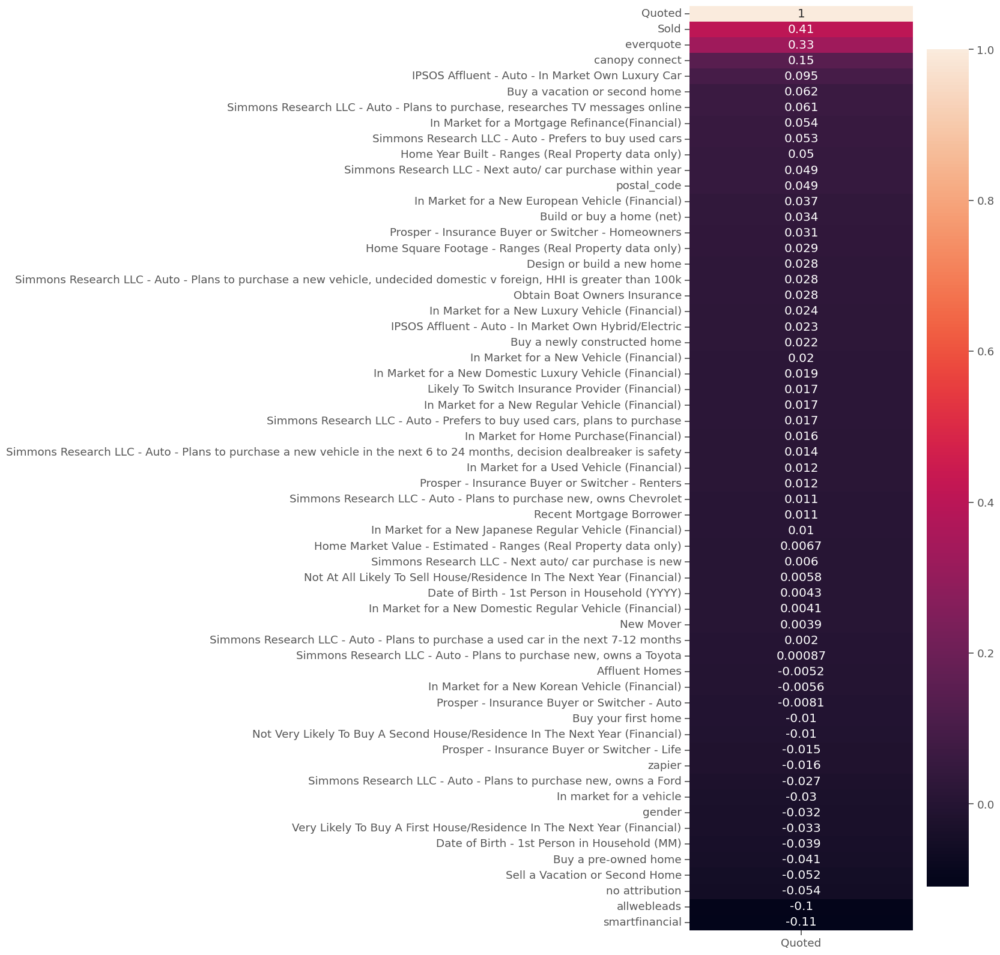

In [ ]:
#Sort the correlations of each column to 'Quoted'
corr = feat_df.corr()[['Quoted']].sort_values(by = 'Quoted', ascending = False)
plt.figure(figsize= (6,20))
sns.heatmap(corr, annot = True);

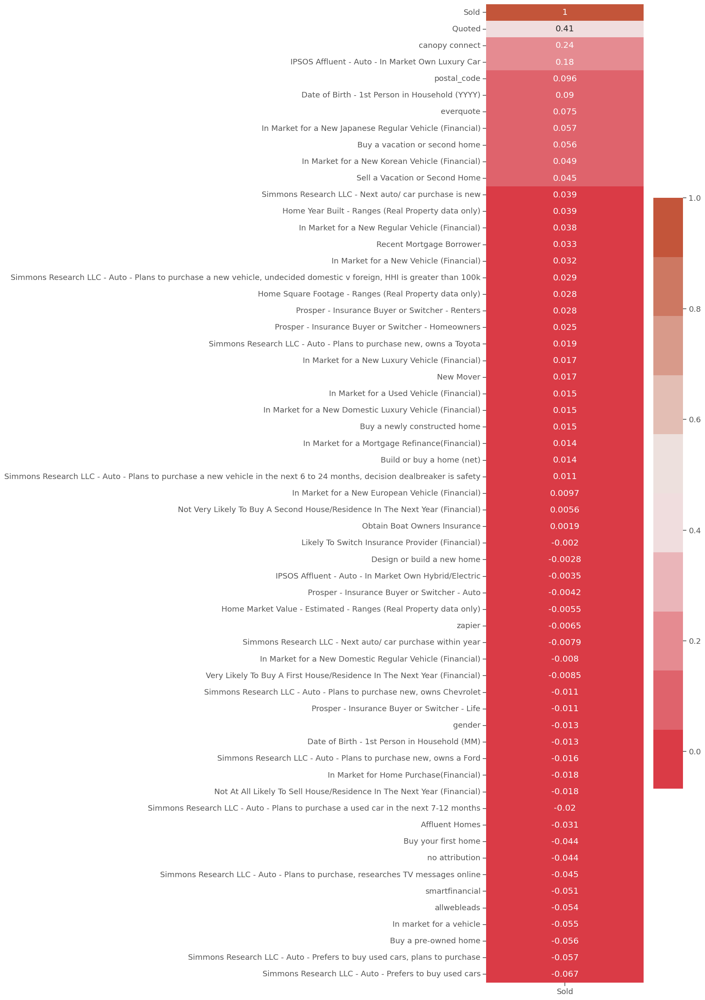

In [ ]:
#Sort the correlations of each column to SalePrice
corr = feat_df.corr()[['Sold']].sort_values(by = 'Sold', ascending = False)
plt.figure(figsize= (6,30))
sns.heatmap(corr, annot = True, cmap=sns.diverging_palette(10, 20, n=10));


In [ ]:
corr
corr.to_csv('Column Correlations.csv')

In [ ]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1904 entries, 0 to 3472
Data columns (total 59 columns):
 #   Column                                                                                                                    Non-Null Count  Dtype  
---  ------                                                                                                                    --------------  -----  
 0   postal_code                                                                                                               1813 non-null   float64
 1   Obtain Boat Owners Insurance                                                                                              1813 non-null   float64
 2   Prosper - Insurance Buyer or Switcher - Auto                                                                              1443 non-null   float64
 3   Prosper - Insurance Buyer or Switcher - Homeowners                                                                        1443 non-nu

In [ ]:
#Select features with a greater or lesser correlation than 0.04 to "Sold"
#train_df = df_clean.copy()

#train_df.drop(columns = corr[(corr['Sold'] < 0.00) & (corr['Sold'] > -0.00)].index, inplace = True)

#train_df.info()

In [ ]:
#corr = train_df.corr()
#plt.figure(figsize = (20,20));
#sns.heatmap(corr, cmap=sns.diverging_palette(10, 220, n=10), annot = True, vmin=-1, vmax=1, center=0,fmt='.2f');

## Prepare data for classification target "Sold"

In [ ]:
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

In [ ]:
df_ml = df_clean.copy()
df_ml.dropna()

df_ml = df_ml.drop(columns=['Quoted'])


# df_merged real train data


In [ ]:
#df_ml = df_ml.drop(columns=['postal_code'])


df_ml['postal_code'] = df_ml['postal_code'].astype(str)
df_ml['postal_code'] = df_ml['postal_code'].astype(str).str.zfill(5)
df_ml['postal_code'].value_counts()

00nan      91
76226.0    91
75028.0    40
75287.0    23
75067.0    22
           ..
75159.0     1
75140.0     1
75135.0     1
76109.0     1
75125.0     1
Name: postal_code, Length: 302, dtype: int64

In [ ]:
df_ml['Sold'].value_counts()

0.0    1866
1.0      38
Name: Sold, dtype: int64

In [ ]:
# split X and y

X = df_ml.drop(columns=['Sold'])
y = df_ml['Sold']

# split training and test
# set random_state to SEED for reproducibility
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = SEED, stratify=y, test_size=.25)

In [ ]:
#instantiate the StandardScaler, OneHotEncoder, and Imputers
scaler = StandardScaler()
ohe = OneHotEncoder(drop='if_binary', sparse=False, handle_unknown='ignore')

mean_imputer = SimpleImputer(strategy='mean')
freq_imputer = SimpleImputer(strategy='most_frequent')
# Setup the pipelines for the numeric and categorical data

num_pipeline = make_pipeline(mean_imputer, scaler)
nom_pipeline = make_pipeline(freq_imputer, ohe)

# Selectors
num_selector = make_column_selector(dtype_include='number')
nom_selector = make_column_selector(dtype_include='object')

# Setup the tuples to pair the processors with the make column selectors

numeric_tuple = (num_pipeline, num_selector)
nominal_tuple = (nom_pipeline, nom_selector)

# Instantiate the make column transformer
preprocessor = make_column_transformer((num_pipeline, num_selector),
                                       (nom_pipeline, nom_selector),
                                       verbose_feature_names_out=False)

# Fit the column transformer on the X_train
preprocessor.fit(X_train)

# extract feature names for feature importance analysis
feature_names = preprocessor.get_feature_names_out()

# Transform the X_train and the X_test with feature names for importance analysis
X_train_df = pd.DataFrame(preprocessor.transform(X_train),
                           columns = feature_names, index = X_train.index)
X_test_df = pd.DataFrame(preprocessor.transform(X_test),
                           columns = feature_names, index = X_test.index)

X_train_df.head(3)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:202: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,In market for a vehicle,Affluent Homes,Likely To Switch Insurance Provider (Financial),Build or buy a home (net),Design or build a new home,Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Sell a Vacation or Second Home,Very Likely To Buy A First House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),In Market for a Mortgage Refinance(Financial),In Market for Home Purchase(Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a Used Vehicle (Financial),Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota",Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase","Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,"Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety",IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),New Mover,Recent Mortgage Borrower,gender,postal_code_00nan,postal_code_75001.0,postal_code_75002.0,postal_code_75006.0,postal_code_75007.0,postal_code_75009.0,postal_code_75010.0,postal_code_75013.0,postal_code_75014.0,postal_code_75019.0,postal_code_75020.0,postal_code_75022.0,postal_code_75023.0,postal_code_75024.0,postal_code_75025.0,postal_code_75028.0,postal_code_75032.0,postal_code_75033.0,postal_code_75034.0,postal_code_75035.0,postal_code_75036.0,postal_code_75038.0,postal_code_75039.0,postal_code_75040.0,postal_code_75041.0,postal_code_75042.0,postal_code_75043.0,postal_code_75044.0,postal_code_75048.0,postal_code_75050.0,postal_code_75051.0,postal_code_75052.0,postal_code_75054.0,postal_code_75056.0,postal_code_75057.0,postal_code_75060.0,postal_code_75061.0,postal_code_75062.0,postal_code_75063.0,postal_code_75065.0,postal_code_75067.0,postal_code_75068.0,postal_code_75069.0,postal_code_75070.0,postal_code_75071.0,postal_code_75072.0,postal_code_75074.0,postal_code_75075.0,postal_code_75076.0,postal_code_75077.0,postal_code_75078.0,postal_code_75080.0,postal_code_75081.0,postal_code_75082.0,postal_code_75087.0,postal_code_75088.0,postal_code_75089.0,postal_code_75090.0,postal_code_75092.0,postal_code_75093.0,postal_code_75094.0,postal_code_75098.0,postal_code_75104.0,postal_code_75110.0,postal_code_75115.0,postal_code_75116.0,postal_code_75119.0,postal_code_75124.0,postal_code_75126.0,postal_code_75134.0,postal_code_75135.0,postal_code_75137.0,postal_code_75141.0,postal_code_75142.0,postal_code_75143.0,

In [ ]:
X_test_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 476 entries, 2610 to 3191
Columns: 332 entries, Obtain Boat Owners Insurance to zapier_1
dtypes: float64(332)
memory usage: 1.2 MB


In [ ]:
X_test_df

,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,In market for a vehicle,Affluent Homes,Likely To Switch Insurance Provider (Financial),Build or buy a home (net),Design or build a new home,Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Sell a Vacation or Second Home,Very Likely To Buy A First House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),In Market for a Mortgage Refinance(Financial),In Market for Home Purchase(Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a Used Vehicle (Financial),Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota",Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase","Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,"Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety",IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),New Mover,Recent Mortgage Borrower,gender,postal_code_00nan,postal_code_75001.0,postal_code_75002.0,postal_code_75006.0,postal_code_75007.0,postal_code_75009.0,postal_code_75010.0,postal_code_75013.0,postal_code_75014.0,postal_code_75019.0,postal_code_75020.0,postal_code_75022.0,postal_code_75023.0,postal_code_75024.0,postal_code_75025.0,postal_code_75028.0,postal_code_75032.0,postal_code_75033.0,postal_code_75034.0,postal_code_75035.0,postal_code_75036.0,postal_code_75038.0,postal_code_75039.0,postal_code_75040.0,postal_code_75041.0,postal_code_75042.0,postal_code_75043.0,postal_code_75044.0,postal_code_75048.0,postal_code_75050.0,postal_code_75051.0,postal_code_75052.0,postal_code_75054.0,postal_code_75056.0,postal_code_75057.0,postal_code_75060.0,postal_code_75061.0,postal_code_75062.0,postal_code_75063.0,postal_code_75065.0,postal_code_75067.0,postal_code_75068.0,postal_code_75069.0,postal_code_75070.0,postal_code_75071.0,postal_code_75072.0,postal_code_75074.0,postal_code_75075.0,postal_code_75076.0,postal_code_75077.0,postal_code_75078.0,postal_code_75080.0,postal_code_75081.0,postal_code_75082.0,postal_code_75087.0,postal_code_75088.0,postal_code_75089.0,postal_code_75090.0,postal_code_75092.0,postal_code_75093.0,postal_code_75094.0,postal_code_75098.0,postal_code_75104.0,postal_code_75110.0,postal_code_75115.0,postal_code_75116.0,postal_code_75119.0,postal_code_75124.0,postal_code_75126.0,postal_code_75134.0,postal_code_75135.0,postal_code_75137.0,postal_code_75141.0,postal_code_75142.0,postal_code_75143.0,

## Classification Models

In [ ]:
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, ConfusionMatrixDisplay,
                             RocCurveDisplay, f1_score, accuracy_score,
                             classification_report)

In [ ]:
df_results = pd.DataFrame()
df_results['Sold'] = y_test
df_results['no attribution'] = df_ml['no attribution']
df_results['allwebleads'] = df_ml['allwebleads']
df_results['canopy connect'] = df_ml['canopy connect']
#df_results['personal contact'] = df_ml['personal contact']
#df_results['cole xdates'] = df_ml['cole xdates']
#df_results['old account'] = df_ml['old account']
df_results['everquote'] = df_ml['everquote']
#df_results['referral'] = df_ml['referral']
#df_results['philipines'] = df_ml['philipines']
#df_results['philippines jotform'] = df_ml['philippines jotform']
df_results['zapier'] = df_ml['zapier']
df_results['smartfinancial'] = df_ml['smartfinancial']
#df_results['smarketing'] = df_ml['smarketing']
df_results

,Sold,no attribution,allwebleads,canopy connect,everquote,zapier,smartfinancial
2610,0.0,0,0,0,1,0,0
1614,0.0,0,0,0,0,0,1
2134,0.0,0,0,0,1,0,0
943,0.0,0,0,0,0,0,1
227,0.0,0,0,0,0,0,0
...,...,...,...,...,...,...,...
2532,0.0,0,0,0,0,0,0
3054,0.0,0,0,0,0,0,0
1455,0.0,0,0,0,0,0,0
925,0.0,0,0,0,1,0,0


### Naive Bayes Model for classification

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      1400
         1.0       0.10      0.11      0.10        28

    accuracy                           0.96      1428
   macro avg       0.54      0.54      0.54      1428
weighted avg       0.96      0.96      0.96      1428



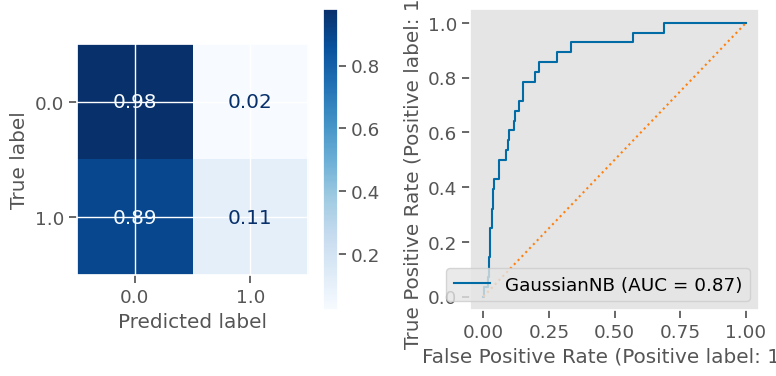

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99       466
         1.0       0.00      0.00      0.00        10

    accuracy                           0.97       476
   macro avg       0.49      0.50      0.49       476
weighted avg       0.96      0.97      0.96       476



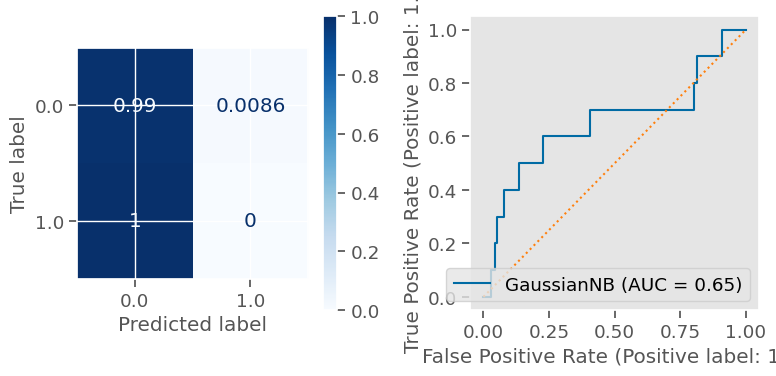

CPU times: user 1.21 s, sys: 164 ms, total: 1.37 s
Wall time: 1.4 s


In [ ]:
%%time
from sklearn.naive_bayes import GaussianNB
naive_bayes = GaussianNB(var_smoothing=1.0)
naive_bayes.fit(X_train_df, y_train)
evaluate_classification(naive_bayes, X_train_df, y_train, X_test_df, y_test)

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       0.99      0.82      0.90      1400
         1.0       0.08      0.75      0.14        28

    accuracy                           0.82      1428
   macro avg       0.53      0.78      0.52      1428
weighted avg       0.98      0.82      0.88      1428



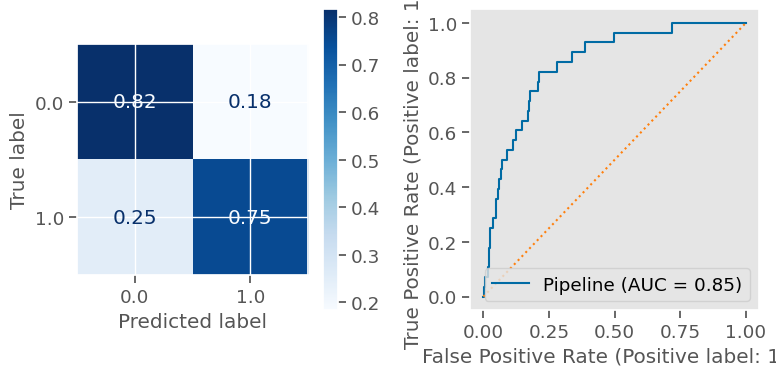

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.99      0.83      0.90       466
         1.0       0.06      0.50      0.11        10

    accuracy                           0.83       476
   macro avg       0.52      0.67      0.51       476
weighted avg       0.97      0.83      0.89       476



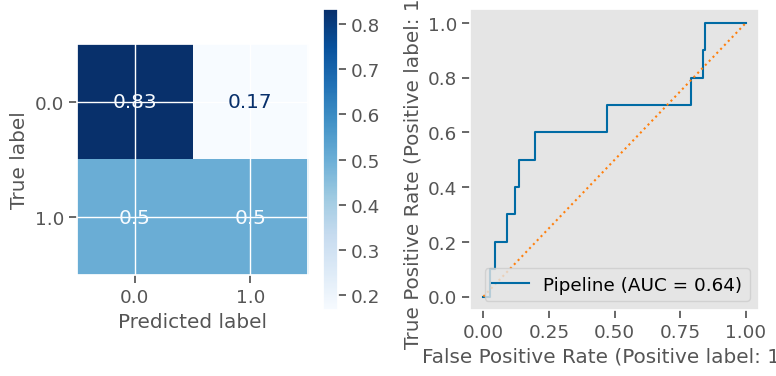

CPU times: user 1.71 s, sys: 195 ms, total: 1.9 s
Wall time: 1.76 s


In [ ]:
%%time
#### RandomOverSampler
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, ConfusionMatrixDisplay,
                             RocCurveDisplay, f1_score, accuracy_score,
                             classification_report)


from sklearn.naive_bayes import GaussianNB
naive_bayes = GaussianNB(var_smoothing=1.0)
naive_bayes_pipe = make_pipeline(RandomOverSampler(), naive_bayes)
naive_bayes_pipe.fit(X_train_df, y_train)
evaluate_classification(naive_bayes_pipe, X_train_df, y_train, X_test_df, y_test)

In [ ]:
param_grid_nb = {'var_smoothing': np.logspace(0,-9, num=100)}

In [ ]:
from sklearn.model_selection import GridSearchCV
nbModel_grid = GridSearchCV(estimator=naive_bayes, param_grid=param_grid_nb, verbose=1, cv=10, n_jobs=-1,scoring = 'recall')
nbModel_grid.fit(X_train_df, y_train)
print(nbModel_grid.best_estimator_)

# , scoring = 'recall'
#...
#Fitting 10 folds for each of 100 candidates, totalling 1000 fits
#GaussianNB(priors=None, var_smoothing=1.0)



Fitting 10 folds for each of 100 candidates, totalling 1000 fits
GaussianNB(var_smoothing=0.012328467394420659)


--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      0.64      0.78      1400
         1.0       0.05      1.00      0.10        28

    accuracy                           0.64      1428
   macro avg       0.53      0.82      0.44      1428
weighted avg       0.98      0.64      0.77      1428



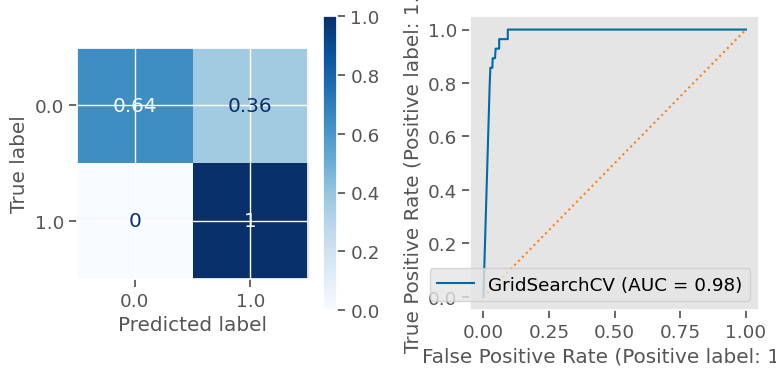

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.99      0.62      0.76       466
         1.0       0.04      0.80      0.08        10

    accuracy                           0.62       476
   macro avg       0.52      0.71      0.42       476
weighted avg       0.97      0.62      0.75       476



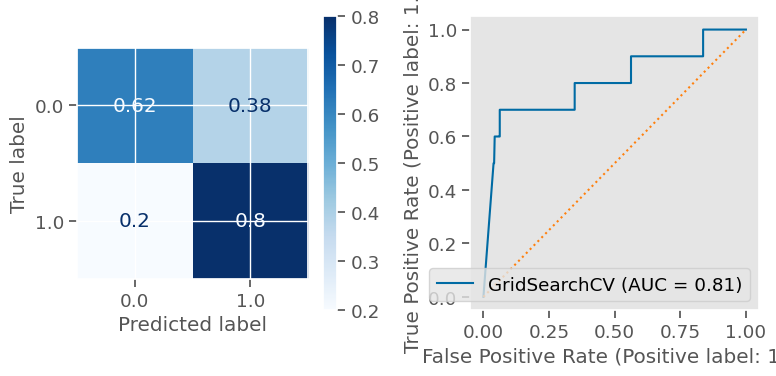

In [ ]:
evaluate_classification(nbModel_grid, X_train_df, y_train, X_test_df, y_test)

In [ ]:
pd.set_option("display.precision", 8)

In [ ]:
imps = permutation_importance(naive_bayes, X_test_df, y_test)


In [ ]:
naive_beyes_imp_mean = imps.importances_mean

In [ ]:
naive_beyes_df = pd.DataFrame()
naive_beyes_df['Feature'] = feature_names
naive_beyes_df['Perm_Imp'] = naive_beyes_imp_mean
naive_beyes_df

,Feature,Perm_Imp
0,Obtain Boat Owners Insurance,5.46218487e-03
1,Prosper - Insurance Buyer or Switcher - Auto,1.68067227e-03
2,Prosper - Insurance Buyer or Switcher - Homeow...,7.14285714e-03
3,Prosper - Insurance Buyer or Switcher - Life,1.68067227e-03
4,Prosper - Insurance Buyer or Switcher - Renters,-2.22044605e-17
...,...,...
327,no attribution_1,-8.40336134e-04
328,smartfinancial_1,1.68067227e-03
329,allwebleads_1,8.40336134e-04
330,canopy connect_1,0.00000000e+00


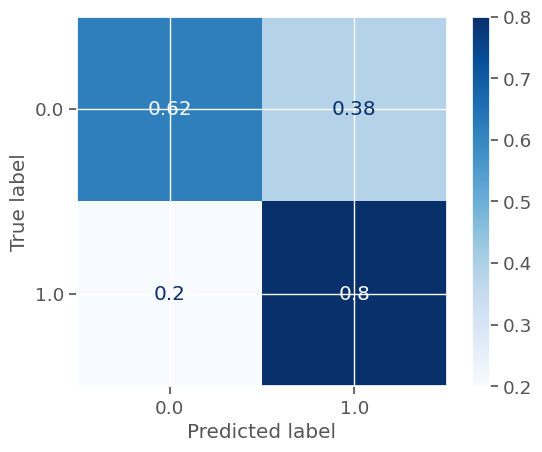

In [ ]:
# evaluate model
#from sklearn.metrics import ConfusionMatrixDisplay

#make predictions
y_preds_nb_proba = nbModel_grid.predict_proba(X_test_df)
raw_data_model_nb =  y_preds_nb_proba
no,yes = zip(*y_preds_nb_proba)
y_preds_nb_proba = yes

df_results['Naive Bayes Prediction Prob'] = y_preds_nb_proba

y_preds_nb_proba = np.array(y_preds_nb_proba)
value = y_preds_nb_proba
value[(value > .5)] = 1
#value[(value < .5)] = 0
y_preds_nb_bool = np.round(value)

df_results['Naive Bayes Prediction Actual'] = y_preds_nb_bool

ConfusionMatrixDisplay.from_predictions(y_test, y_preds_nb_bool,
                                                   cmap='Blues',
                                                   normalize='true');

# .18 is .1 and .3
#.173 is .11 and .5

In [ ]:
df_results

,Sold,no attribution,allwebleads,canopy connect,everquote,zapier,smartfinancial,Naive Bayes Prediction Prob,Naive Bayes Prediction Actual
2610,0.0,0,0,0,1,0,0,1.00000000e+00,1.0
1614,0.0,0,0,0,0,0,1,1.01156899e-17,0.0
2134,0.0,0,0,0,1,0,0,9.99959428e-01,1.0
943,0.0,0,0,0,0,0,1,4.91877492e-22,0.0
227,0.0,0,0,0,0,0,0,4.88614467e-11,0.0
...,...,...,...,...,...,...,...,...,...
2532,0.0,0,0,0,0,0,0,7.43279207e-01,1.0
3054,0.0,0,0,0,0,0,0,6.58019358e-02,0.0
1455,0.0,0,0,0,0,0,0,9.99999999e-01,1.0
925,0.0,0,0,0,1,0,0,1.00000000e+00,1.0


### Support Vector Machines

#### Linear Support Vector Machines

In [ ]:
%%time
## SVM performs well with higher dimentionality
#### RandomOverSampler
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, ConfusionMatrixDisplay,
                             RocCurveDisplay, f1_score, accuracy_score,
                             classification_report)

CPU times: user 18 µs, sys: 2 µs, total: 20 µs
Wall time: 23.8 µs


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1400
         1.0       0.64      1.00      0.78        28

    accuracy                           0.99      1428
   macro avg       0.82      0.99      0.89      1428
weighted avg       0.99      0.99      0.99      1428



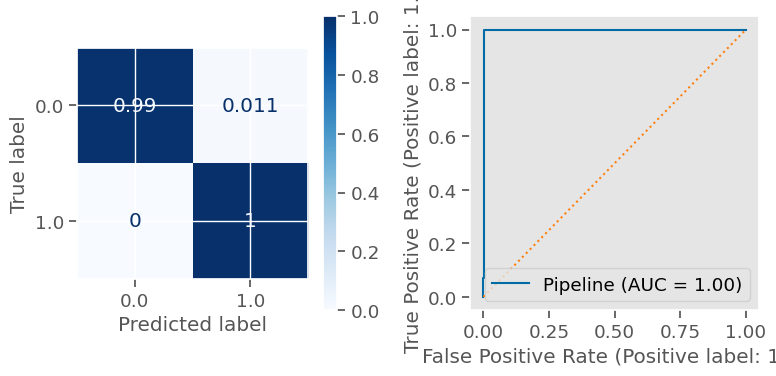

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.98      0.95      0.96       466
         1.0       0.07      0.20      0.11        10

    accuracy                           0.93       476
   macro avg       0.53      0.57      0.54       476
weighted avg       0.96      0.93      0.95       476



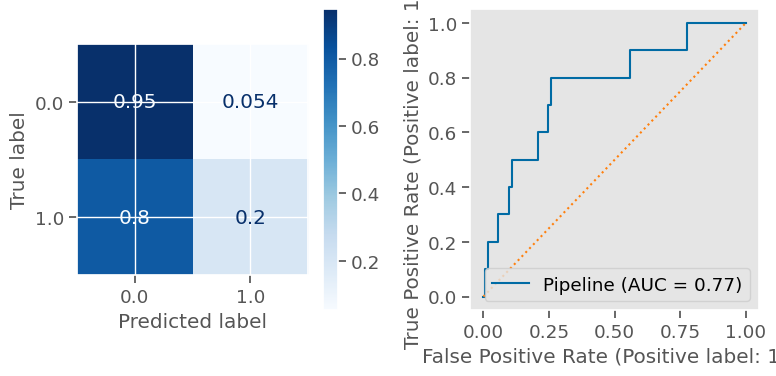

CPU times: user 1.35 s, sys: 425 ms, total: 1.78 s
Wall time: 1.33 s


In [ ]:
%%time

#from sklearn import svm

# Support Vector Machines
from sklearn.svm import LinearSVC
support_vector_machines = LinearSVC (class_weight='balanced')

support_vector_machines_pipe = make_pipeline(RandomOverSampler(), support_vector_machines)
support_vector_machines_pipe.fit(X_train_df, y_train)
evaluate_classification(support_vector_machines_pipe, X_train_df, y_train, X_test_df, y_test)

In [ ]:
support_vector_machines_pipe.get_params()

{'memory': None,
 'steps': [('randomoversampler', RandomOverSampler()),
  ('linearsvc', LinearSVC(class_weight='balanced'))],
 'verbose': False,
 'randomoversampler': RandomOverSampler(),
 'linearsvc': LinearSVC(class_weight='balanced'),
 'randomoversampler__random_state': None,
 'randomoversampler__sampling_strategy': 'auto',
 'randomoversampler__shrinkage': None,
 'linearsvc__C': 1.0,
 'linearsvc__class_weight': 'balanced',
 'linearsvc__dual': True,
 'linearsvc__fit_intercept': True,
 'linearsvc__intercept_scaling': 1,
 'linearsvc__loss': 'squared_hinge',
 'linearsvc__max_iter': 1000,
 'linearsvc__multi_class': 'ovr',
 'linearsvc__penalty': 'l2',
 'linearsvc__random_state': None,
 'linearsvc__tol': 0.0001,
 'linearsvc__verbose': 0}

In [ ]:
from sklearn.model_selection import GridSearchCV

# defining parameter range
param_grid = { 'linearsvc__C': [0.1, 1, 10],
               'linearsvc__penalty': ['l1','l2'],
               'linearsvc__loss' : ['hinge', 'squared_hinge'],
               'linearsvc__dual': [False, True]
              }

SVM_search = GridSearchCV(support_vector_machines_pipe, param_grid, refit = True, verbose = 0, scoring = 'recall')

# fitting the model for grid search
SVM_search.fit(X_train_df, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  w

GridSearchCV(estimator=Pipeline(steps=[('randomoversampler',
                                        RandomOverSampler()),
                                       ('linearsvc',
                                        LinearSVC(class_weight='balanced'))]),
             param_grid={'linearsvc__C': [0.1, 1, 10],
                         'linearsvc__dual': [False, True],
                         'linearsvc__loss': ['hinge', 'squared_hinge'],
                         'linearsvc__penalty': ['l1', 'l2']},
             scoring='recall')

In [ ]:
SVM_search.best_params_

{'linearsvc__C': 10,
 'linearsvc__dual': False,
 'linearsvc__loss': 'squared_hinge',
 'linearsvc__penalty': 'l1'}

In [ ]:
SVM_best = SVM_search.best_estimator_

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1400
         1.0       0.82      1.00      0.90        28

    accuracy                           1.00      1428
   macro avg       0.91      1.00      0.95      1428
weighted avg       1.00      1.00      1.00      1428



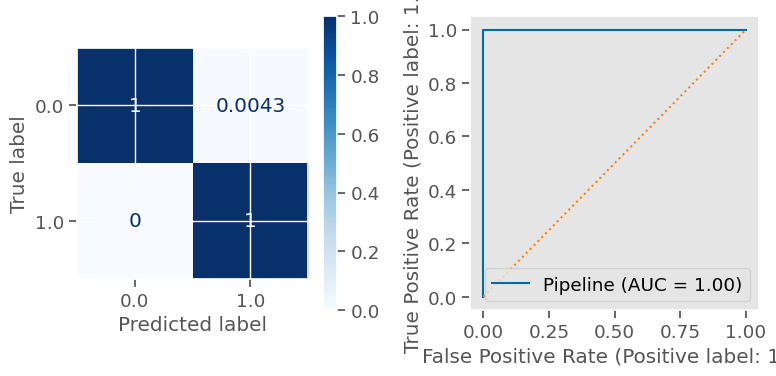

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.98      0.94      0.96       466
         1.0       0.10      0.30      0.15        10

    accuracy                           0.93       476
   macro avg       0.54      0.62      0.55       476
weighted avg       0.97      0.93      0.94       476



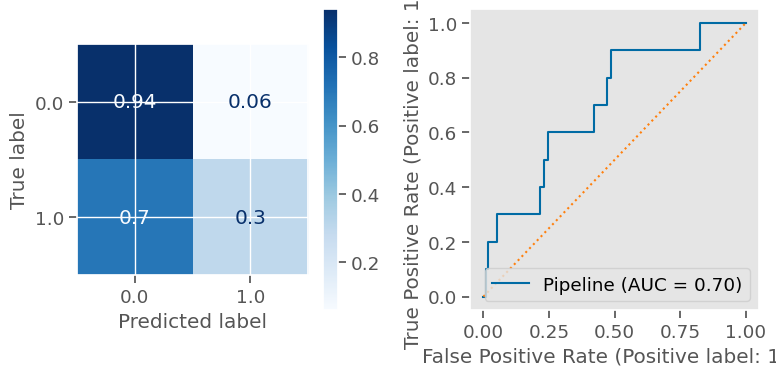

In [ ]:
# print classification report

evaluate_classification(SVM_best, X_train_df, y_train, X_test_df, y_test)

In [ ]:
clf = CalibratedClassifierCV(SVM_best, cv=3)
clf.fit(X_train_df, y_train)
y_proba_svm = clf.predict_proba(X_test_df)

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


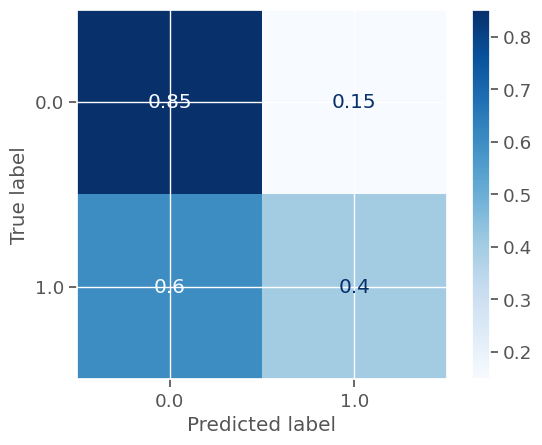

In [ ]:
# evaluate model
from sklearn.metrics import ConfusionMatrixDisplay

# make predictions
y_proba_svm
no,yes = zip(*y_proba_svm)
y_preds_proba_svm = yes

df_results['SVM Prob'] = y_preds_proba_svm


y_preds_proba_svm = np.array(y_preds_proba_svm)
value = y_preds_proba_svm
value[(value > .03)] = 1
y_preds_proba_svm_sold = np.round(value)


df_results['SVM Actual'] = y_preds_proba_svm_sold


ConfusionMatrixDisplay.from_predictions(y_test, y_preds_proba_svm_sold,
                                                   cmap='Blues',
                                                   normalize='true');

#### Stochastic Gradient Descent (SGD) Support Vector Machines

1.   List item
2.   List item



--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1400
         1.0       0.56      1.00      0.72        28

    accuracy                           0.98      1428
   macro avg       0.78      0.99      0.86      1428
weighted avg       0.99      0.98      0.99      1428



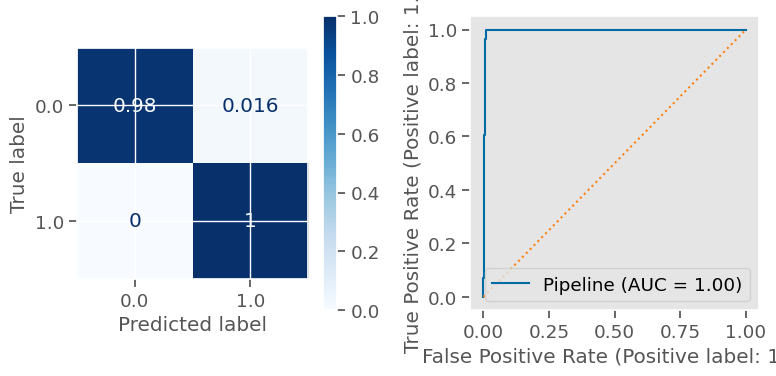

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.98      0.95      0.97       466
         1.0       0.11      0.30      0.16        10

    accuracy                           0.93       476
   macro avg       0.55      0.62      0.56       476
weighted avg       0.97      0.93      0.95       476



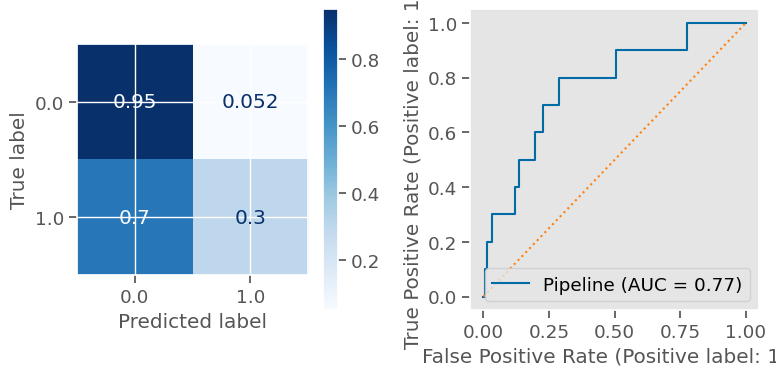

CPU times: user 1.2 s, sys: 457 ms, total: 1.65 s
Wall time: 1.16 s


In [ ]:
%%time
## SVM performs well with higher dimentionality
#### RandomOverSampler
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, ConfusionMatrixDisplay,
                             RocCurveDisplay, f1_score, accuracy_score,
                             classification_report)

#from sklearn import svm

# Support Vector Machines
from sklearn.linear_model import SGDClassifier
support_vector_machines_SGD = SGDClassifier(class_weight='balanced')

support_vector_machines_SGD_pipe = make_pipeline(RandomOverSampler(), support_vector_machines_SGD)
support_vector_machines_SGD_pipe.fit(X_train_df, y_train)
evaluate_classification(support_vector_machines_SGD_pipe, X_train_df, y_train, X_test_df, y_test)

In [ ]:
support_vector_machines_SGD_pipe.get_params()

{'memory': None,
 'steps': [('randomoversampler', RandomOverSampler()),
  ('sgdclassifier', SGDClassifier(class_weight='balanced'))],
 'verbose': False,
 'randomoversampler': RandomOverSampler(),
 'sgdclassifier': SGDClassifier(class_weight='balanced'),
 'randomoversampler__random_state': None,
 'randomoversampler__sampling_strategy': 'auto',
 'randomoversampler__shrinkage': None,
 'sgdclassifier__alpha': 0.0001,
 'sgdclassifier__average': False,
 'sgdclassifier__class_weight': 'balanced',
 'sgdclassifier__early_stopping': False,
 'sgdclassifier__epsilon': 0.1,
 'sgdclassifier__eta0': 0.0,
 'sgdclassifier__fit_intercept': True,
 'sgdclassifier__l1_ratio': 0.15,
 'sgdclassifier__learning_rate': 'optimal',
 'sgdclassifier__loss': 'hinge',
 'sgdclassifier__max_iter': 1000,
 'sgdclassifier__n_iter_no_change': 5,
 'sgdclassifier__n_jobs': None,
 'sgdclassifier__penalty': 'l2',
 'sgdclassifier__power_t': 0.5,
 'sgdclassifier__random_state': None,
 'sgdclassifier__shuffle': True,
 'sgdclassif

In [ ]:
%%time
from sklearn.model_selection import GridSearchCV

# defining parameter range
param_grid_SGD = {'sgdclassifier__loss' : ['hinge', 'log_loss','modified_huber','squared_hinge', 'perceptron','squared_error','huber',
                       'epsilon_insensitive','squared_epsilon_insensitive'],
                  'sgdclassifier__penalty': ['l1','l2','elasticnet', None],
                  'sgdclassifier__alpha': [0.0001]
                  }

SGD_search = GridSearchCV(support_vector_machines_SGD_pipe, param_grid_SGD, verbose = 0, refit = True, scoring = 'recall')

#
#
#, scoring = 'recall'
# ,
# fitting the model for grid search
SGD_best = SGD_search.fit(X_train_df, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stochastic_gradient.py:702: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stochastic_gradient.py:702: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stochastic_gradient.py:702: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(


CPU times: user 1min 46s, sys: 15 s, total: 2min 1s
Wall time: 1min 48s


In [ ]:
SGD_best.best_params_

{'sgdclassifier__alpha': 0.0001,
 'sgdclassifier__loss': 'squared_epsilon_insensitive',
 'sgdclassifier__penalty': 'l1'}

In [ ]:
SGD_search_predictions = SGD_best.best_estimator_

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       0.99      0.49      0.65      1400
         1.0       0.03      0.71      0.05        28

    accuracy                           0.49      1428
   macro avg       0.51      0.60      0.35      1428
weighted avg       0.97      0.49      0.64      1428



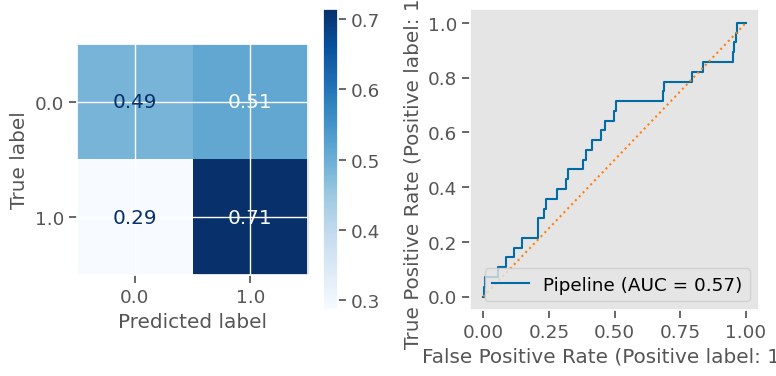

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.99      0.48      0.64       466
         1.0       0.03      0.70      0.05        10

    accuracy                           0.48       476
   macro avg       0.51      0.59      0.35       476
weighted avg       0.97      0.48      0.63       476



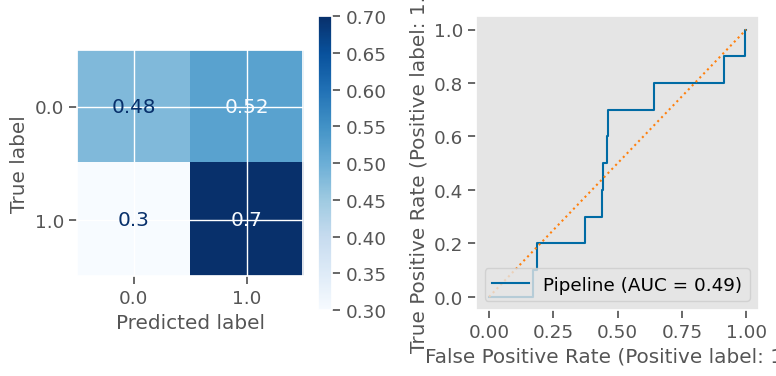

In [ ]:
# print classification report
#evaluate_classification(y_test, SVM_search_predictions)


evaluate_classification(SGD_search_predictions, X_train_df, y_train, X_test_df, y_test)

In [ ]:
svm = SGD_search_predictions
clf = CalibratedClassifierCV(svm, cv=3)
clf.fit(X_train_df, y_train)
y_proba = clf.predict_proba(X_test_df)

### Logistic Regression Model for classification

In [ ]:
%%time
#### RandomOverSampler
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, ConfusionMatrixDisplay,
                             RocCurveDisplay, f1_score, accuracy_score,
                             classification_report)

CPU times: user 25 µs, sys: 3 µs, total: 28 µs
Wall time: 33.4 µs


--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       0.99      0.58      0.73      1400
         1.0       0.04      0.79      0.07        28

    accuracy                           0.58      1428
   macro avg       0.51      0.68      0.40      1428
weighted avg       0.97      0.58      0.72      1428



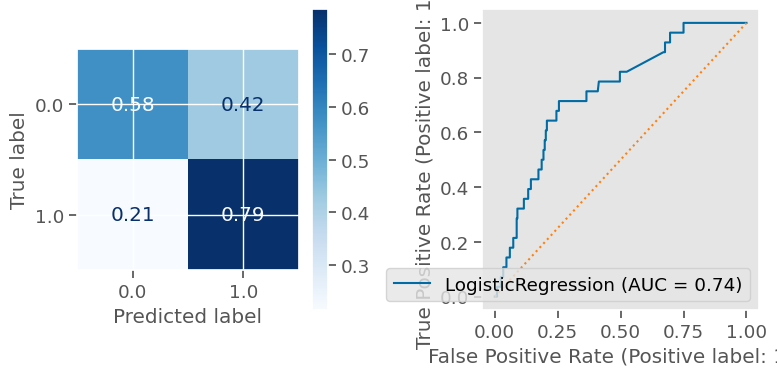

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.99      0.58      0.73       466
         1.0       0.03      0.60      0.06        10

    accuracy                           0.58       476
   macro avg       0.51      0.59      0.39       476
weighted avg       0.97      0.58      0.71       476



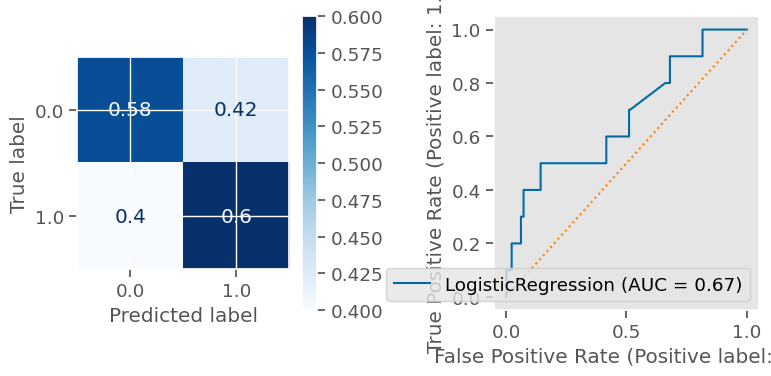

CPU times: user 1.49 s, sys: 286 ms, total: 1.77 s
Wall time: 3.1 s


In [ ]:
%%time
#class_weight = 'balanced'
log_reg = LogisticRegression(C=0.01, class_weight='balanced', penalty='l1',solver='liblinear')
log_reg.fit(X_train_df, y_train)
evaluate_classification(log_reg, X_train_df, y_train, X_test_df, y_test)

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       0.99      0.71      0.83      1400
         1.0       0.05      0.75      0.09        28

    accuracy                           0.71      1428
   macro avg       0.52      0.73      0.46      1428
weighted avg       0.97      0.71      0.82      1428



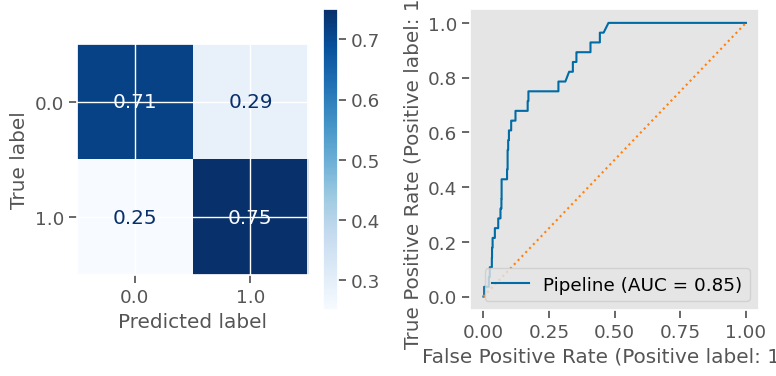

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.99      0.70      0.82       466
         1.0       0.04      0.60      0.08        10

    accuracy                           0.70       476
   macro avg       0.51      0.65      0.45       476
weighted avg       0.97      0.70      0.80       476



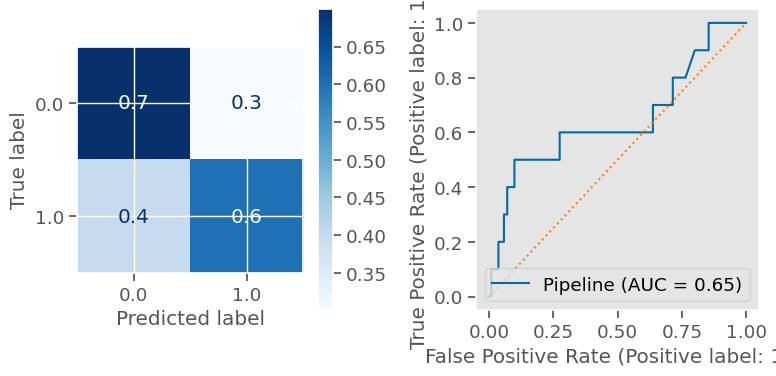

CPU times: user 1.41 s, sys: 350 ms, total: 1.76 s
Wall time: 1.96 s


In [ ]:
%%time
#### RandomOverSampler
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, ConfusionMatrixDisplay,
                             RocCurveDisplay, f1_score, accuracy_score,
                             classification_report)


log_reg = LogisticRegression(C=0.01, penalty='l1',solver='liblinear')
log_reg_pipe = make_pipeline(RandomOverSampler(), log_reg)
log_reg_pipe.fit(X_train_df, y_train)
evaluate_classification(log_reg_pipe, X_train_df, y_train, X_test_df, y_test)



```
# This is formatted as code
```

#### Tune Classification

In [ ]:
log_reg_pipe.get_params()

{'memory': None,
 'steps': [('randomoversampler', RandomOverSampler()),
  ('logisticregression',
   LogisticRegression(C=0.01, penalty='l1', solver='liblinear'))],
 'verbose': False,
 'randomoversampler': RandomOverSampler(),
 'logisticregression': LogisticRegression(C=0.01, penalty='l1', solver='liblinear'),
 'randomoversampler__random_state': None,
 'randomoversampler__sampling_strategy': 'auto',
 'randomoversampler__shrinkage': None,
 'logisticregression__C': 0.01,
 'logisticregression__class_weight': None,
 'logisticregression__dual': False,
 'logisticregression__fit_intercept': True,
 'logisticregression__intercept_scaling': 1,
 'logisticregression__l1_ratio': None,
 'logisticregression__max_iter': 100,
 'logisticregression__multi_class': 'auto',
 'logisticregression__n_jobs': None,
 'logisticregression__penalty': 'l1',
 'logisticregression__random_state': None,
 'logisticregression__solver': 'liblinear',
 'logisticregression__tol': 0.0001,
 'logisticregression__verbose': 0,
 'log

In [ ]:
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

In [ ]:
parameters = {'logisticregression__penalty' : ['l2'],
              'logisticregression__C': [0.001,.01, 0.1, 1, 10],
              'logisticregression__solver' : ['saga','liblinear']}

#'l1',
#
# 0.0001, 0.001, 0.01,
# , 100, 1000

In [ ]:
log_reg = LogisticRegression(class_weight='balanced')
log_reg_pipe = make_pipeline(RandomOverSampler(), log_reg)
log_reg_pipe_search = GridSearchCV(log_reg_pipe, param_grid = parameters, scoring='recall')

In [ ]:
%%time
log_reg_pipe_search.fit(X_train_df, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

CPU times: user 26.1 s, sys: 4.48 s, total: 30.6 s
Wall time: 26.3 s


GridSearchCV(estimator=Pipeline(steps=[('randomoversampler',
                                        RandomOverSampler()),
                                       ('logisticregression',
                                        LogisticRegression(class_weight='balanced'))]),
             param_grid={'logisticregression__C': [0.001, 0.01, 0.1, 1, 10],
                         'logisticregression__penalty': ['l2'],
                         'logisticregression__solver': ['saga', 'liblinear']},
             scoring='recall')

In [ ]:
log_reg_pipe_search.best_params_

{'logisticregression__C': 0.001,
 'logisticregression__penalty': 'l2',
 'logisticregression__solver': 'liblinear'}

In [ ]:
#retrieve the best version of the model
log_reg_pipe_best = log_reg_pipe_search.best_estimator_

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      0.66      0.79      1400
         1.0       0.05      0.96      0.10        28

    accuracy                           0.67      1428
   macro avg       0.53      0.81      0.45      1428
weighted avg       0.98      0.67      0.78      1428



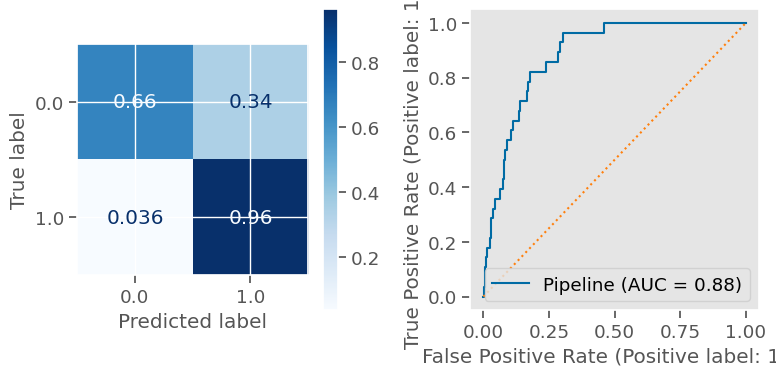

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.99      0.67      0.80       466
         1.0       0.04      0.60      0.07        10

    accuracy                           0.67       476
   macro avg       0.51      0.63      0.43       476
weighted avg       0.97      0.67      0.78       476



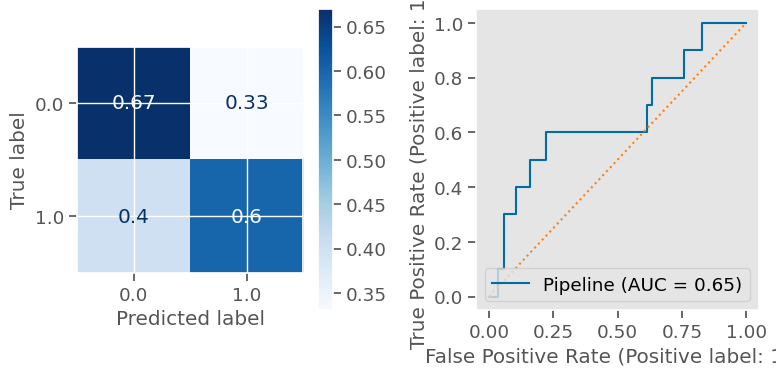

In [ ]:

evaluate_classification(log_reg_pipe_best, X_train_df, y_train, X_test_df, y_test)

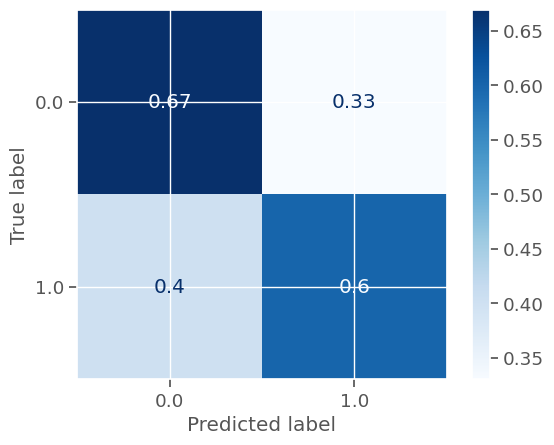

In [ ]:
# evaluate model
#from sklearn.metrics import ConfusionMatrixDisplay

#make predictions
y_preds_lr = log_reg_pipe_best.predict_proba(X_test_df)
raw_data_model_lr =  y_preds_lr

no,yes = zip(*y_preds_lr)

#cuttoff=.535 .83, .2
cuttoff=.5

y_preds_lr_proba = yes
y_preds_lr_proba = np.array(y_preds_lr_proba)
value = y_preds_lr_proba
value[(value > cuttoff)] = 1
value[(value < cuttoff)] = 0
y_preds_lr_proba = np.round(value)
df_results['Logistic Prediction Actual'] = y_preds_lr_proba

ConfusionMatrixDisplay.from_predictions(y_test, y_preds_lr_proba,
                                                   cmap='Blues',
                                                   normalize='true');

In [ ]:
df_results['Logistic Prediction Actual']

2610    0.0
1614    0.0
2134    1.0
943     0.0
227     0.0
       ... 
2532    0.0
3054    0.0
1455    0.0
925     0.0
3191    0.0
Name: Logistic Prediction Actual, Length: 476, dtype: float64

In [ ]:
df_results

,Sold,no attribution,allwebleads,canopy connect,everquote,zapier,smartfinancial,Naive Bayes Prediction Prob,Naive Bayes Prediction Actual,SVM Prob,SVM Actual,Logistic Prediction Actual
2610,0.0,0,0,0,1,0,0,1.00000000e+00,1.0,0.01393057,0.0,0.0
1614,0.0,0,0,0,0,0,1,1.01156899e-17,0.0,0.00528299,0.0,0.0
2134,0.0,0,0,0,1,0,0,9.99959428e-01,1.0,0.02144451,0.0,1.0
943,0.0,0,0,0,0,0,1,4.91877492e-22,0.0,0.00493906,0.0,0.0
227,0.0,0,0,0,0,0,0,4.88614467e-11,0.0,0.00688172,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2532,0.0,0,0,0,0,0,0,7.43279207e-01,1.0,0.01597900,0.0,0.0
3054,0.0,0,0,0,0,0,0,6.58019358e-02,0.0,0.01895564,0.0,0.0
1455,0.0,0,0,0,0,0,0,9.99999999e-01,1.0,0.01834436,0.0,0.0
925,0.0,0,0,0,1,0,0,1.00000000e+00,1.0,0.02391712,0.0,0.0


In [ ]:
y_preds_lr = log_reg_pipe_best.predict_proba(X_test_df)
raw_data_model_lr =  y_preds_lr

no,yes = zip(*y_preds_lr)

y_preds_lr_proba = yes
y_preds_lr_proba = np.array(y_preds_lr_proba)

df_results['Logistic Prediction Prob'] = y_preds_lr_proba



df_results

,Sold,no attribution,allwebleads,canopy connect,everquote,zapier,smartfinancial,Naive Bayes Prediction Prob,Naive Bayes Prediction Actual,SVM Prob,SVM Actual,Logistic Prediction Actual,Logistic Prediction Prob
2610,0.0,0,0,0,1,0,0,1.00000000e+00,1.0,0.01393057,0.0,0.0,0.39566837
1614,0.0,0,0,0,0,0,1,1.01156899e-17,0.0,0.00528299,0.0,0.0,0.35779339
2134,0.0,0,0,0,1,0,0,9.99959428e-01,1.0,0.02144451,0.0,1.0,0.64734984
943,0.0,0,0,0,0,0,1,4.91877492e-22,0.0,0.00493906,0.0,0.0,0.36095093
227,0.0,0,0,0,0,0,0,4.88614467e-11,0.0,0.00688172,0.0,0.0,0.27004125
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2532,0.0,0,0,0,0,0,0,7.43279207e-01,1.0,0.01597900,0.0,0.0,0.29718487
3054,0.0,0,0,0,0,0,0,6.58019358e-02,0.0,0.01895564,0.0,0.0,0.44591096
1455,0.0,0,0,0,0,0,0,9.99999999e-01,1.0,0.01834436,0.0,0.0,0.39281038
925,0.0,0,0,0,1,0,0,1.00000000e+00,1.0,0.02391712,0.0,0.0,0.47397540


#### Feature Importance

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      0.59      0.74      1400
         1.0       0.04      0.86      0.08        28

    accuracy                           0.59      1428
   macro avg       0.52      0.72      0.41      1428
weighted avg       0.98      0.59      0.72      1428



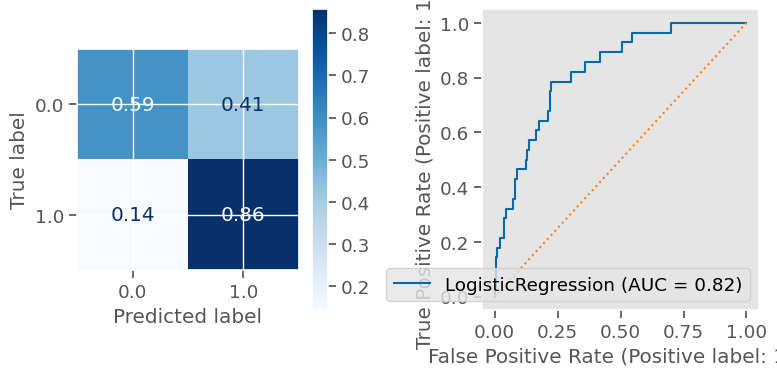

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.99      0.58      0.73       466
         1.0       0.03      0.60      0.06        10

    accuracy                           0.58       476
   macro avg       0.51      0.59      0.40       476
weighted avg       0.97      0.58      0.72       476



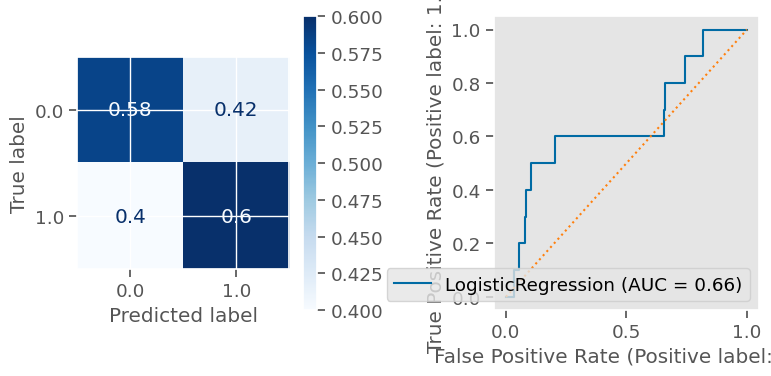

CPU times: user 1.51 s, sys: 515 ms, total: 2.02 s
Wall time: 1.49 s


In [ ]:
%%time
log_reg = LogisticRegression(C=0.0001, class_weight='balanced', max_iter=1000, solver='liblinear', penalty='l2')
log_reg.fit(X_train_df, y_train)
evaluate_classification(log_reg, X_train_df, y_train, X_test_df, y_test)

In [ ]:
def get_coeffs_logreg(logreg, feature_names = None, sort=True,ascending=True,
                      name='LogReg Coefficients', class_index=0):
    if feature_names is None:
        feature_names = logreg.feature_names_in_

    ## Saving the coefficients
    coeffs = pd.Series(logreg.coef_[class_index],
                       index= feature_names, name=name)

    # use .loc to add the intercept to the series
    coeffs.loc['intercept'] = logreg.intercept_[class_index]
    if sort == True:
        coeffs = coeffs.sort_values(ascending=ascending)
    return coeffs

In [ ]:
pd.set_option("display.precision", 8)
coeffs = get_coeffs_logreg(log_reg)
coeffs

Simmons Research LLC - Auto - Prefers to buy used cars                           -0.01666709
Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase        -0.01142579
Simmons Research LLC - Auto - Plans to purchase, researches TV messages online   -0.00878010
In Market for a New Domestic Regular Vehicle (Financial)                         -0.00875149
In market for a vehicle                                                          -0.00872834
                                                                                     ...    
Recent Mortgage Borrower                                                          0.01170714
In Market for a New Korean Vehicle (Financial)                                    0.01331570
Home Year Built - Ranges (Real Property data only)                                0.01368589
IPSOS Affluent - Auto - In Market Own Luxury Car                                  0.01663300
Date of Birth - 1st Person in Household (YYYY)                        

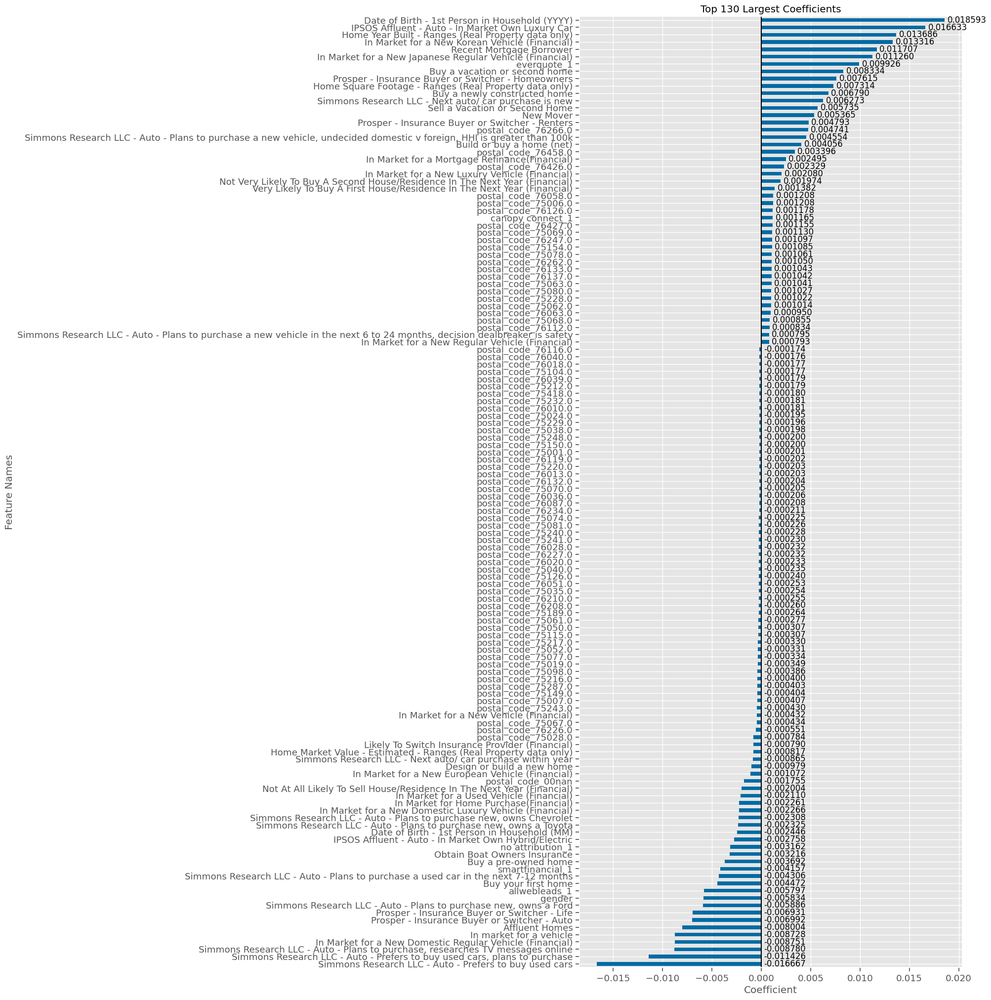

In [ ]:
ax = plot_coeffs(coeffs,top_n=130, figsize=(10,25))
annotate_hbars(ax)

In [ ]:
def get_coeffs_logreg(logreg, feature_names = None, sort=True,ascending=True,
                      name='LogReg Coefficients', class_index=0,
                      as_odds=False):

    if feature_names is None:
        feature_names = logreg.feature_names_in_

    ## Saving the coefficients
    coeffs = pd.Series(logreg.coef_[class_index],
                       index= feature_names, name=name)

    # use .loc to add the intercept to the series
    coeffs.loc['intercept'] = logreg.intercept_[class_index]

    if as_odds==True:
        coeffs = np.exp(coeffs)
    if sort == True:
        coeffs = coeffs.sort_values(ascending=ascending)


    return coeffs

In [ ]:
coeffs_odds = get_coeffs_logreg(log_reg,  as_odds=True)
coeffs_odds

Simmons Research LLC - Auto - Prefers to buy used cars                            0.98347104
Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase         0.98863924
Simmons Research LLC - Auto - Plans to purchase, researches TV messages online    0.99125834
In Market for a New Domestic Regular Vehicle (Financial)                          0.99128669
In market for a vehicle                                                           0.99130964
                                                                                     ...    
Recent Mortgage Borrower                                                          1.01177594
In Market for a New Korean Vehicle (Financial)                                    1.01340475
Home Year Built - Ranges (Real Property data only)                                1.01377997
IPSOS Affluent - Auto - In Market Own Luxury Car                                  1.01677210
Date of Birth - 1st Person in Household (YYYY)                        

In [ ]:
df_coefficients = pd.DataFrame()
df_coefficients['coefficients'] = coeffs_odds
df_coefficients.sort_values(by='coefficients', ascending=False, inplace=True)

In [ ]:
df_coefficients

,coefficients
Date of Birth - 1st Person in Household (YYYY),1.01876679
IPSOS Affluent - Auto - In Market Own Luxury Car,1.01677210
Home Year Built - Ranges (Real Property data only),1.01377997
In Market for a New Korean Vehicle (Financial),1.01340475
Recent Mortgage Borrower,1.01177594
...,...
In market for a vehicle,0.99130964
In Market for a New Domestic Regular Vehicle (Financial),0.99128669
"Simmons Research LLC - Auto - Plans to purchase, researches TV messages online",0.99125834
"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase",0.98863924


In [ ]:
df_coefficients.to_csv('Log Reg Coefficients L2.csv')

In [ ]:
coeffs_odds.sort_values()

Simmons Research LLC - Auto - Prefers to buy used cars                            0.98347104
Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase         0.98863924
Simmons Research LLC - Auto - Plans to purchase, researches TV messages online    0.99125834
In Market for a New Domestic Regular Vehicle (Financial)                          0.99128669
In market for a vehicle                                                           0.99130964
                                                                                     ...    
Recent Mortgage Borrower                                                          1.01177594
In Market for a New Korean Vehicle (Financial)                                    1.01340475
Home Year Built - Ranges (Real Property data only)                                1.01377997
IPSOS Affluent - Auto - In Market Own Luxury Car                                  1.01677210
Date of Birth - 1st Person in Household (YYYY)                        

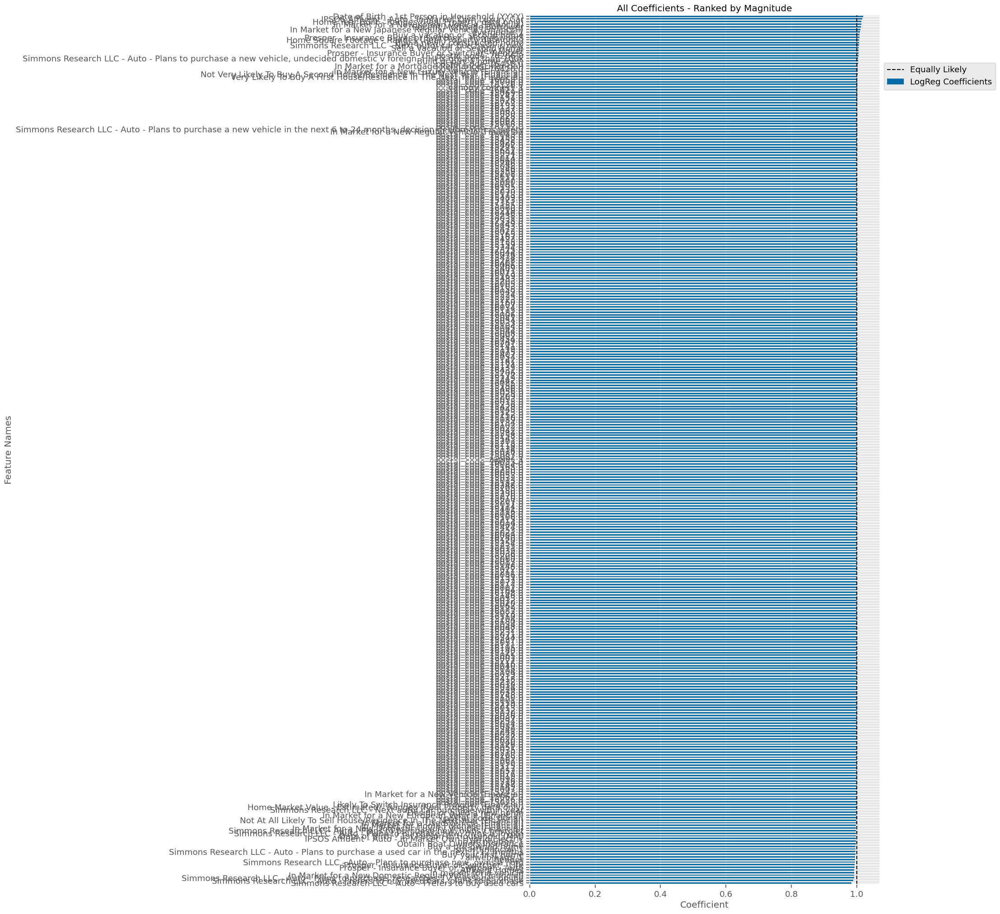

In [ ]:
ax = plot_coeffs(coeffs_odds,figsize=(10,25))
ax.axvline(1, ls='--',label='Equally Likely',color='k', zorder=1)
ax.legend(bbox_to_anchor=[1,.95])

### Random Forest Classifier

In [ ]:
#X_preds_lr_proba_train = log_reg_pipe_best.predict_proba(X_train_df)
#no,yes = zip(*X_preds_lr_proba_train)
#X_preds_lr_proba_train = yes

#y_preds_lr_proba_test = log_reg_pipe_best.predict_proba(X_test_df)
#no,yes = zip(*y_preds_lr_proba_test)
#y_preds_lr_proba_test = yes

#X_preds_lr = log_reg_pipe_best.predict(X_train_df)
#y_preds_lr = log_reg_pipe_best.predict(X_test_df)


#X_train_df['Logistic Regression Prob'] = X_preds_lr_proba_train
#X_test_df['Logistic Regression Prob'] = y_preds_lr_proba_test

#X_train_df['Logistic Regression Prediction'] = X_preds_nb
#X_test_df['Logistic Regression Prediction'] = y_preds_nb

#X_train_df

In [ ]:
%%time
#### RandomOverSampler
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, ConfusionMatrixDisplay,
                             RocCurveDisplay, f1_score, accuracy_score,
                             classification_report)

CPU times: user 25 µs, sys: 3 µs, total: 28 µs
Wall time: 32.4 µs


--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1400
         1.0       0.84      0.93      0.88        28

    accuracy                           1.00      1428
   macro avg       0.92      0.96      0.94      1428
weighted avg       1.00      1.00      1.00      1428



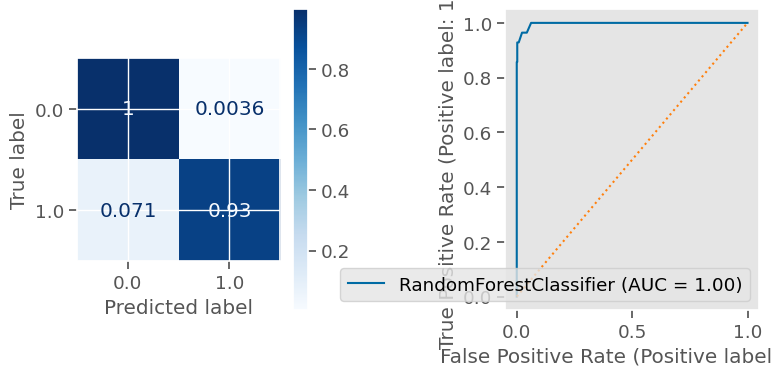

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       466
         1.0       0.00      0.00      0.00        10

    accuracy                           0.97       476
   macro avg       0.49      0.50      0.49       476
weighted avg       0.96      0.97      0.97       476



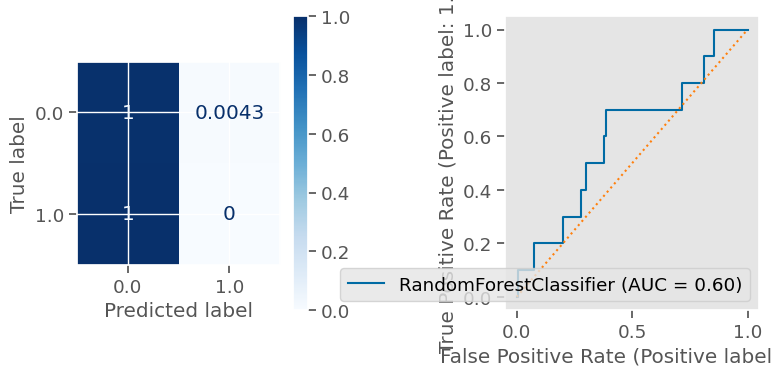

CPU times: user 1.82 s, sys: 241 ms, total: 2.06 s
Wall time: 1.81 s


In [ ]:

%%time
# fit and evaluate a RandomForestClassifier
rf = RandomForestClassifier(class_weight='balanced',max_depth=25,
                            min_samples_leaf=20,
                            min_samples_split=25,
                            n_estimators=250)
rf.fit(X_train_df, y_train)
evaluate_classification(rf, X_train_df, y_train, X_test_df, y_test)

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1400
         1.0       0.88      1.00      0.93        28

    accuracy                           1.00      1428
   macro avg       0.94      1.00      0.97      1428
weighted avg       1.00      1.00      1.00      1428



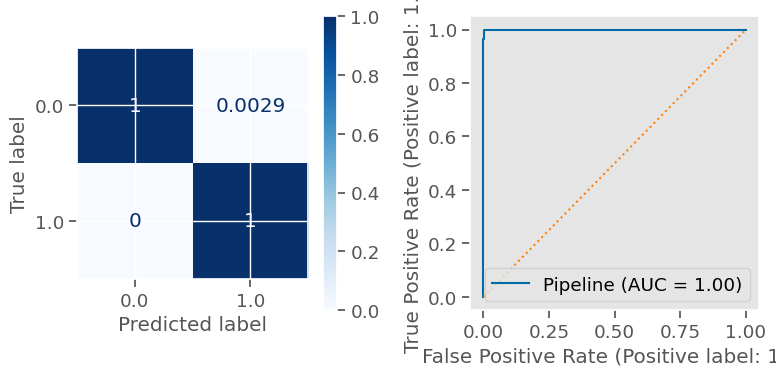

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99       466
         1.0       0.20      0.10      0.13        10

    accuracy                           0.97       476
   macro avg       0.59      0.55      0.56       476
weighted avg       0.96      0.97      0.97       476



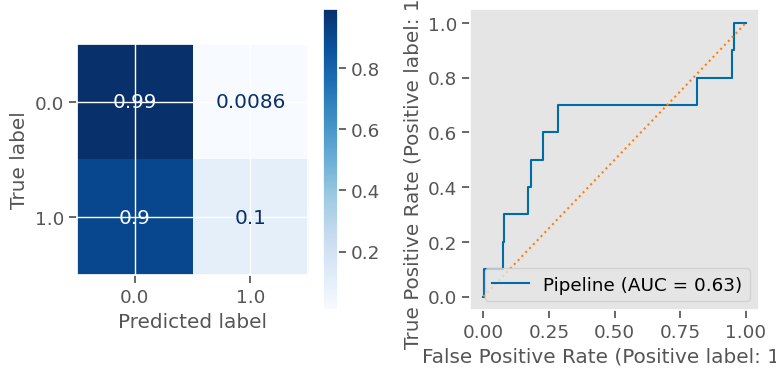

CPU times: user 2.08 s, sys: 255 ms, total: 2.34 s
Wall time: 2.12 s


In [ ]:
%%time
# fit and evaluate a RandomForestClassifier
rf = RandomForestClassifier(max_depth=25,
                            min_samples_leaf=20,
                            min_samples_split=25,
                            n_estimators=250)
rf_pipe = make_pipeline(RandomOverSampler(), rf)
rf_pipe.fit(X_train_df, y_train)
evaluate_classification(rf_pipe, X_train_df, y_train, X_test_df, y_test)

# class_weight='balanced'

#### Tune Random Forest Classifier

In [ ]:
rf_pipe.get_params()

{'memory': None,
 'steps': [('randomoversampler', RandomOverSampler()),
  ('randomforestclassifier',
   RandomForestClassifier(max_depth=25, min_samples_leaf=20, min_samples_split=25,
                          n_estimators=250))],
 'verbose': False,
 'randomoversampler': RandomOverSampler(),
 'randomforestclassifier': RandomForestClassifier(max_depth=25, min_samples_leaf=20, min_samples_split=25,
                        n_estimators=250),
 'randomoversampler__random_state': None,
 'randomoversampler__sampling_strategy': 'auto',
 'randomoversampler__shrinkage': None,
 'randomforestclassifier__bootstrap': True,
 'randomforestclassifier__ccp_alpha': 0.0,
 'randomforestclassifier__class_weight': None,
 'randomforestclassifier__criterion': 'gini',
 'randomforestclassifier__max_depth': 25,
 'randomforestclassifier__max_features': 'sqrt',
 'randomforestclassifier__max_leaf_nodes': None,
 'randomforestclassifier__max_samples': None,
 'randomforestclassifier__min_impurity_decrease': 0.0,
 'rand

In [ ]:
pip install optuna

In [ ]:
import optuna
import time
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score

def objective(trial):
    """return the f1-score"""

    # search space
    max_depth = trial.suggest_int('randomforestclassifier__max_depth', low=20, high=30, step=1)
    min_samples_leaf = trial.suggest_int('randomforestclassifier__min_samples_leaf', low=10, high=30, step=1)
    min_samples_split = trial.suggest_int('randomforestclassifier__min_samples_split', low=20, high=30, step=1)
    n_estimators =  trial.suggest_int('randomforestclassifier__n_estimators', low=200, high=300, step=25)
    criterion = trial.suggest_categorical('randomforestclassifier__criterion', ['gini', 'entropy'])
    max_features = trial.suggest_categorical('randomforestclassifier__max_features', ['auto', 'sqrt','log2'])

    # random forest classifier object
    rfc = RandomForestClassifier(n_estimators=n_estimators,
                                                  criterion=criterion,
                                                  min_samples_split=min_samples_split,
                                                  min_samples_leaf=min_samples_leaf,
                                                  max_depth=max_depth,
                                                  max_features=max_features,
                                                  random_state=42)
    score =  cross_val_score(estimator=rfc,
                             X=X_train_df,
                             y=y_train,
                             scoring='f1_micro',
                             cv=5,
                             n_jobs=-1).mean()

    return score

# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='maximize')

## perform hyperparamter tuning (while timing the process)
#time_start = time.time()
#study.optimize(objective, n_trials=100)
#time_bayesian = time.time() - time_start

[I 2023-11-16 02:22:34,702] A new study created in memory with name: no-name-ab076823-f06c-421f-8919-cd14c0878962


In [ ]:
params = {'randomforestclassifier__max_depth': [15,20],
          'randomforestclassifier__min_samples_leaf': [20],
          'randomforestclassifier__min_samples_split': [20],
          'randomforestclassifier__n_estimators': [200],}

##          max_depth=25, min_samples_leaf=20, min_samples_split=25,
##                       n_estimators=250

In [ ]:
model = rf_pipe
rf_pipe_grid_search = GridSearchCV(model, params, scoring = 'recall')

In [ ]:
%%time
rf_pipe_grid_search.fit(X_train_df, y_train)

CPU times: user 13.6 s, sys: 53.4 ms, total: 13.7 s
Wall time: 22 s


GridSearchCV(estimator=Pipeline(steps=[('randomoversampler',
                                        RandomOverSampler()),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(max_depth=25,
                                                               min_samples_leaf=20,
                                                               min_samples_split=25,
                                                               n_estimators=250))]),
             param_grid={'randomforestclassifier__max_depth': [15, 20],
                         'randomforestclassifier__min_samples_leaf': [20],
                         'randomforestclassifier__min_samples_split': [20],
                         'randomforestclassifier__n_estimators': [200]},
             scoring='recall')

In [ ]:
rf_pipe_grid_search.best_params_

{'randomforestclassifier__max_depth': 15,
 'randomforestclassifier__min_samples_leaf': 20,
 'randomforestclassifier__min_samples_split': 20,
 'randomforestclassifier__n_estimators': 200}

In [ ]:
##retrieve the best version of the model
best_model_rf = rf_pipe_grid_search

In [ ]:
##refit the model on the whole training set
best_model_rf.fit(X_train_df, y_train)

##score the model on the test set
best_model_rf.score(X_test_df, y_test)

0.1

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1400
         1.0       0.96      0.96      0.96        28

    accuracy                           1.00      1428
   macro avg       0.98      0.98      0.98      1428
weighted avg       1.00      1.00      1.00      1428



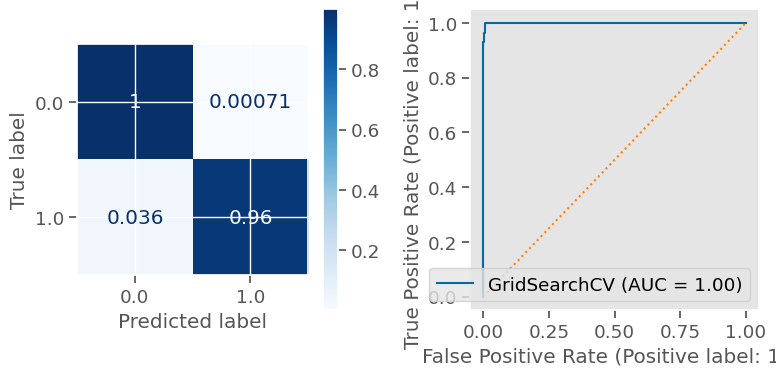

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99       466
         1.0       0.20      0.10      0.13        10

    accuracy                           0.97       476
   macro avg       0.59      0.55      0.56       476
weighted avg       0.96      0.97      0.97       476



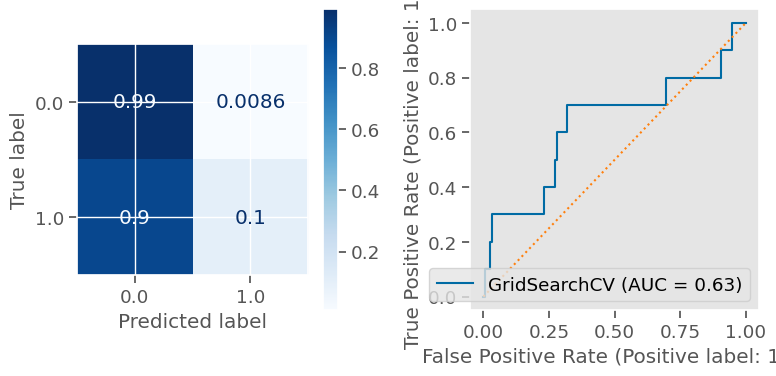

In [ ]:
evaluate_classification(best_model_rf, X_train_df, y_train, X_test_df, y_test)

In [ ]:
best_model_rf.get_params()

{'cv': None,
 'error_score': nan,
 'estimator__memory': None,
 'estimator__steps': [('randomoversampler', RandomOverSampler()),
  ('randomforestclassifier',
   RandomForestClassifier(max_depth=25, min_samples_leaf=20, min_samples_split=25,
                          n_estimators=250))],
 'estimator__verbose': False,
 'estimator__randomoversampler': RandomOverSampler(),
 'estimator__randomforestclassifier': RandomForestClassifier(max_depth=25, min_samples_leaf=20, min_samples_split=25,
                        n_estimators=250),
 'estimator__randomoversampler__random_state': None,
 'estimator__randomoversampler__sampling_strategy': 'auto',
 'estimator__randomoversampler__shrinkage': None,
 'estimator__randomforestclassifier__bootstrap': True,
 'estimator__randomforestclassifier__ccp_alpha': 0.0,
 'estimator__randomforestclassifier__class_weight': None,
 'estimator__randomforestclassifier__criterion': 'gini',
 'estimator__randomforestclassifier__max_depth': 25,
 'estimator__randomforestcla

2610    0.15871484
1614    0.08134050
2134    0.24626002
943     0.14699905
227     0.10618728
           ...    
2532    0.07914207
3054    0.14164884
1455    0.17366855
925     0.25184326
3191    0.20464075
Name: Random Forest Prob, Length: 476, dtype: float64

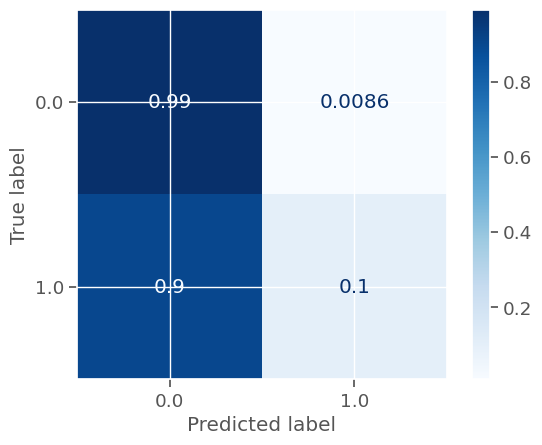

In [ ]:
# evaluate model
from sklearn.metrics import ConfusionMatrixDisplay

# make predictions
y_preds_rf = best_model_rf.predict_proba(X_test_df)
no,yes = zip(*y_preds_rf)
y_preds_rf_proba = yes

df_results['Random Forest Prob'] = y_preds_rf_proba


y_preds_rf_proba = np.array(y_preds_rf_proba)
value = y_preds_rf_proba
value[(value > .5)] = 1
y_preds_rf_proba_sold = np.round(value)


df_results['Random Forest Actual'] = y_preds_rf_proba_sold


ConfusionMatrixDisplay.from_predictions(y_test, y_preds_rf_proba_sold,
                                                   cmap='Blues',
                                                   normalize='true');
df_results['Random Forest Prob']

#### Most Important Features

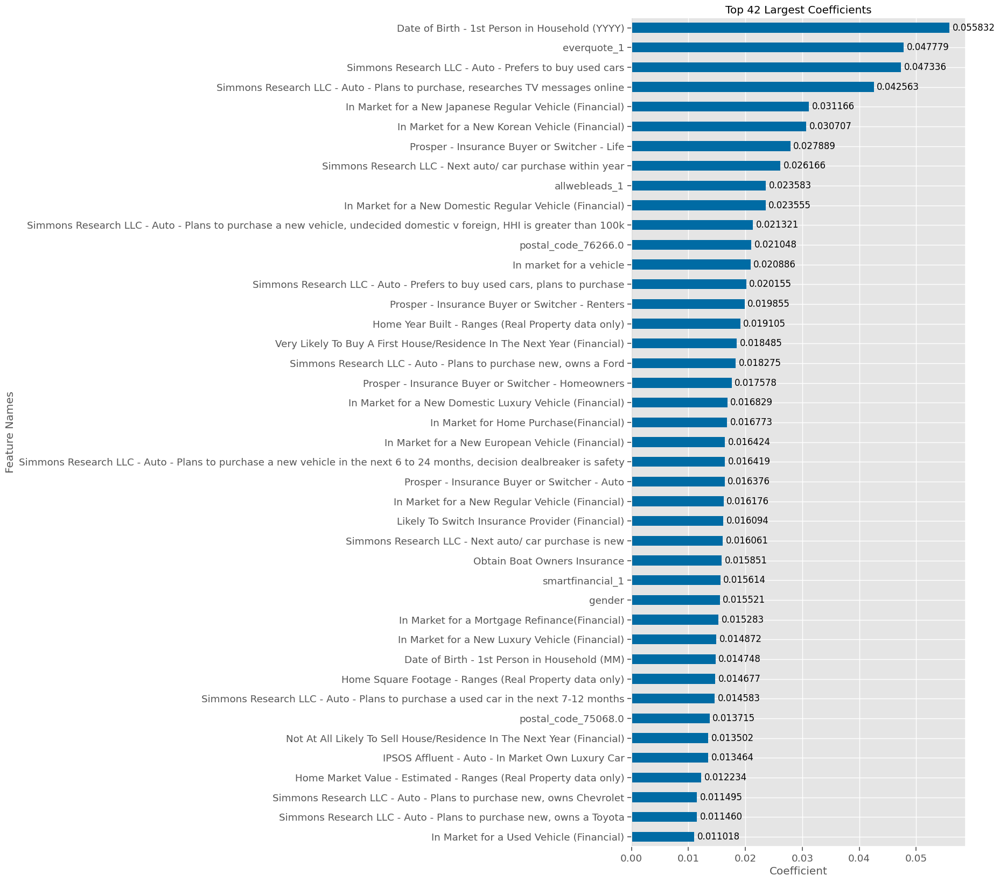

In [ ]:
rf_importances = get_importances(rf)
ax = plot_coeffs(rf_importances,top_n=42, figsize=(8,20))
annotate_hbars(ax)

In [ ]:
len(rf_importances)

332

In [ ]:
rf_importances

Obtain Boat Owners Insurance                          0.01585147
Prosper - Insurance Buyer or Switcher - Auto          0.01637555
Prosper - Insurance Buyer or Switcher - Homeowners    0.01757778
Prosper - Insurance Buyer or Switcher - Life          0.02788854
Prosper - Insurance Buyer or Switcher - Renters       0.01985487
                                                         ...    
no attribution_1                                      0.00505881
smartfinancial_1                                      0.01561392
allwebleads_1                                         0.02358251
canopy connect_1                                      0.00191507
zapier_1                                              0.00000000
Name: Feature Importance, Length: 332, dtype: float64

In [ ]:
rf_importances.to_frame()
rf_importances
rf_importances.to_csv('RF Importances.csv')

In [ ]:
## Permutation Importances - RandomForest
#from sklearn.inspection import permutation_importance
#r = permutation_importance(rf,X_train_df,y_train,n_jobs=-1,n_repeats=5)
#r.keys()

In [ ]:
## getting the colors for the top 7 important rf features
#colors_rf = get_color_dict(rf_importances,top_n=100)

In [ ]:
## can make the mean importances into a series
#rf_perm_importances = pd.Series(r['importances_mean'],index=X_train_df.columns,
#                           name = 'permutation importance')
#rf_perm_importances = rf_perm_importances.sort_values(ascending=False)
#plot_importance_color(rf_perm_importances,color_dict=colors_rf,top_n=150,  figsize=(8,25));

In [ ]:
#ax = plot_coeffs(rf_perm_importances,top_n=42, figsize=(8,20))
#annotate_hbars(ax)

In [ ]:
#rf_perm_importances.to_frame()
#rf_perm_importances
#rf_perm_importances.to_csv('RF Permutation Importances.csv')

### Boosting

In [ ]:
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, ConfusionMatrixDisplay,
                             RocCurveDisplay, f1_score, accuracy_score,
                             classification_report)

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1400
         1.0       1.00      1.00      1.00        28

    accuracy                           1.00      1428
   macro avg       1.00      1.00      1.00      1428
weighted avg       1.00      1.00      1.00      1428



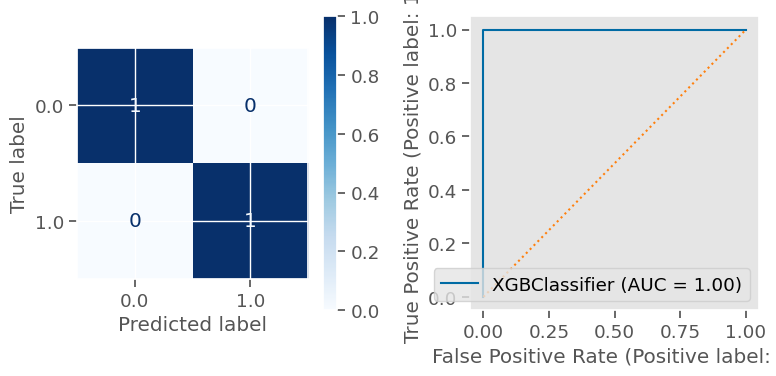

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       466
         1.0       0.33      0.10      0.15        10

    accuracy                           0.98       476
   macro avg       0.66      0.55      0.57       476
weighted avg       0.97      0.98      0.97       476



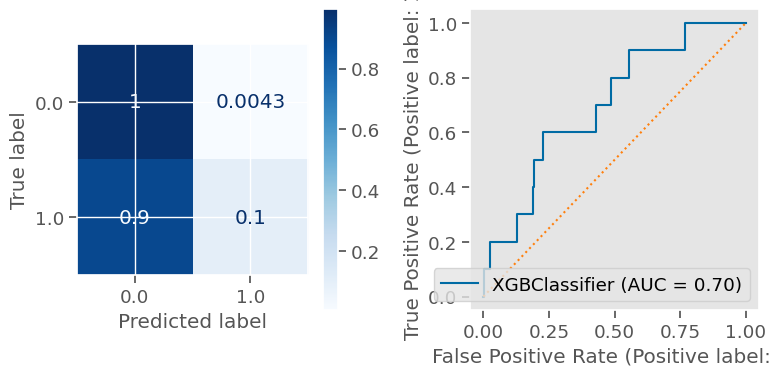

CPU times: user 6.27 s, sys: 556 ms, total: 6.83 s
Wall time: 12.9 s


In [ ]:
%%time
# fit and evaluate XGB
xgb = XGBClassifier(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=5,
 min_child_weight=1,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'binary:logistic',
 nthread=4,
 scale_pos_weight=50,
 seed=SEED,
 )

xgb.fit(X_train_df, y_train)
evaluate_classification(xgb, X_train_df, y_train, X_test_df, y_test)

              precision    recall  f1-score   support

         0.0       0.99      0.76      0.86       466
         1.0       0.05      0.60      0.09        10

    accuracy                           0.76       476
   macro avg       0.52      0.68      0.48       476
weighted avg       0.97      0.76      0.84       476



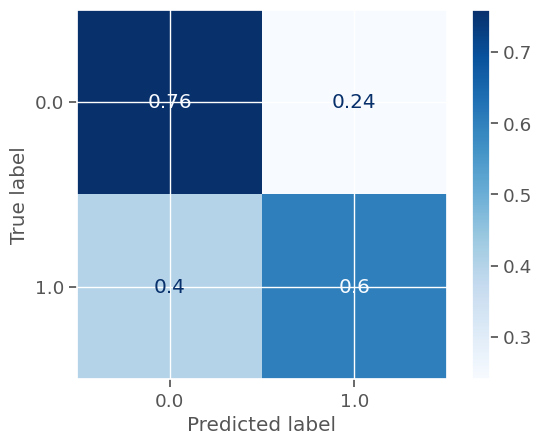

In [ ]:
#make predictions
y_preds_proba_xgb = xgb.predict_proba(X_test_df)
# round the predictions
raw_results_xgb_proba = y_preds_proba_xgb

no,yes = zip(*y_preds_proba_xgb)
#print(x)
y_preds_proba_yes_xgb = yes
y_preds_proba_yes_xgb = np.array(y_preds_proba_yes_xgb)
value = y_preds_proba_yes_xgb
value[(value > .001)] = 1
y_preds_proba_yes_xgb_round = np.round(value)
df_results['XGB Actual'] = y_preds_proba_yes_xgb_round


print(classification_report(y_test, y_preds_proba_yes_xgb_round))
ConfusionMatrixDisplay.from_predictions(y_test, y_preds_proba_yes_xgb_round,
                                                   cmap='Blues',
                                                   normalize='true');

# value[(value > .00015)] = 1

In [ ]:
y_preds_proba_xgb = xgb.predict_proba(X_test_df)
raw_results_xgb_proba = y_preds_proba_xgb
no,yes = zip(*y_preds_proba_xgb)
y_preds_proba_yes_xgb = yes
y_preds_proba_yes_xgb = np.array(y_preds_proba_yes_xgb)
df_results['XGB Prob'] = y_preds_proba_yes_xgb
df_results

,Sold,no attribution,allwebleads,canopy connect,everquote,zapier,smartfinancial,Naive Bayes Prediction Prob,Naive Bayes Prediction Actual,SVM Prob,SVM Actual,Logistic Prediction Actual,Logistic Prediction Prob,Random Forest Prob,Random Forest Actual,XGB Actual,XGB Prob
2610,0.0,0,0,0,1,0,0,1.00000000e+00,1.0,0.01393057,0.0,0.0,0.39566837,0.15871484,0.0,1.0,0.00236085
1614,0.0,0,0,0,0,0,1,1.01156899e-17,0.0,0.00528299,0.0,0.0,0.35779339,0.08134050,0.0,0.0,0.00002201
2134,0.0,0,0,0,1,0,0,9.99959428e-01,1.0,0.02144451,0.0,1.0,0.64734984,0.24626002,0.0,0.0,0.00019830
943,0.0,0,0,0,0,0,1,4.91877492e-22,0.0,0.00493906,0.0,0.0,0.36095093,0.14699905,0.0,0.0,0.00027279
227,0.0,0,0,0,0,0,0,4.88614467e-11,0.0,0.00688172,0.0,0.0,0.27004125,0.10618728,0.0,0.0,0.00016201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2532,0.0,0,0,0,0,0,0,7.43279207e-01,1.0,0.01597900,0.0,0.0,0.29718487,0.07914207,0.0,0.0,0.00001356
3054,0.0,0,0,0,0,0,0,6.58019358e-02,0.0,0.01895564,0.0,0.0,0.44591096,0.14164884,0.0,0.0,0.00003572
1455,0.0,0,0,0,0,0,0,9.99999999e-01,1.0,0.01834436,0.0,0.0,0.39281038,0.17366855,0.0,0.0,0.00034459
925,0.0,0,0,0,1,0,0,1.00000000e+00,1.0,0.02391712,0.0,0.0,0.47397540,0.25184326,0.0,1.0,0.00159464


In [ ]:
not_sold_xgb = df_results[df_results['Sold']==0]
sold_xgb = df_results[df_results['Sold']==1]

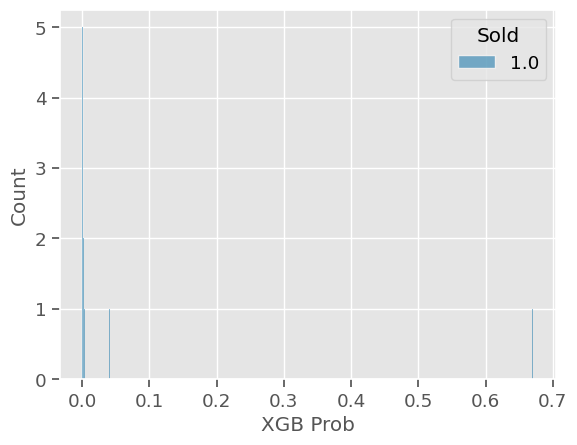

In [ ]:
sns.histplot(data=sold_xgb, x='XGB Prob', hue='Sold', bins=500);

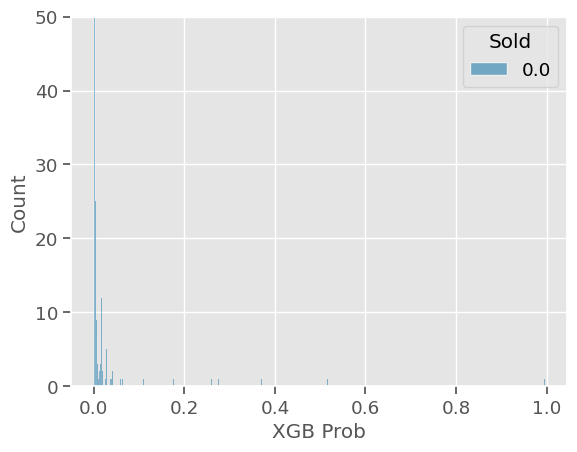

In [ ]:
sns.histplot(data=not_sold_xgb, x='XGB Prob', hue='Sold', bins=500);
plt.ylim(0, 50);

#### Feature Importance

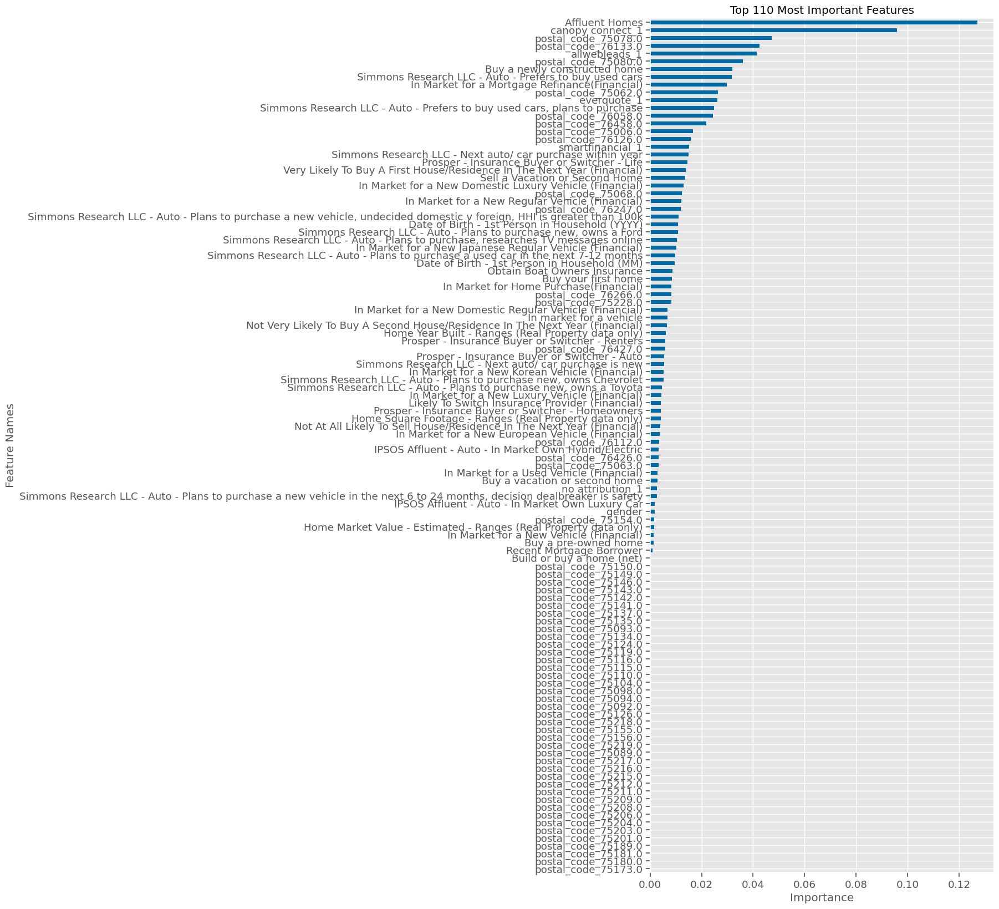

In [ ]:
xgb_importances = get_importances(xgb)
ax = plot_importance(xgb_importances,top_n=110,figsize=(8,20))

In [ ]:
## Permutation Importances - RandomForest
#from sklearn.inspection import permutation_importance
#r = permutation_importance(xgb,X_train_df,y_train,n_jobs=-1,n_repeats=5)
#r.keys()

In [ ]:
### getting the colors for the top 7 important rf features
#colors_xgb = get_color_dict(xgb_importances,top_n=120)

In [ ]:
### can make the mean importances into a series
#xgb_perm_importances = pd.Series(r['importances_mean'],index=X_train_df.columns,
#                           name = 'permutation importance')
#xgb_perm_importances = xgb_perm_importances.sort_values(ascending=False)
#plot_importance_color(xgb_perm_importances,color_dict=colors_rf,top_n=150,  figsize=(8,25));

In [ ]:
#ax = plot_coeffs(xgb_perm_importances,top_n=120, figsize=(8,20))
#annotate_hbars(ax)

In [ ]:
#xgb_importances.to_frame()
#xgb_importances
#xgb_importances.to_csv('XGB Importances.csv')

In [ ]:
#xgb_perm_importances.to_frame()
#xgb_perm_importances
#xgb_perm_importances.to_csv('xgb Permutation Importances.csv')

## TEST MULITPLE MODELS


In [ ]:
models = {}

# Logistic Regression
from sklearn.linear_model import LogisticRegression
models['Logistic Regression'] = LogisticRegression(C=.01, class_weight='balanced', max_iter=1000, solver='liblinear', penalty='l1')

# Support Vector Machines
from sklearn.svm import LinearSVC
models['Linear SVC'] = LinearSVC(class_weight='balanced')

# Support Vector Machines
from sklearn.linear_model import SGDClassifier
models['SGD SVC1'] = SGDClassifier(class_weight='balanced' , alpha=.0001 , loss ='hinge' , penalty='l2')

# Support Vector Machines
from sklearn.linear_model import SGDClassifier
models['SGD SVC2'] = SGDClassifier(class_weight='balanced', alpha=.0001,loss='squared_error', penalty='l2')


# Decision Trees
from sklearn.tree import DecisionTreeClassifier
models['Decision Trees'] = DecisionTreeClassifier(class_weight='balanced')

# Random Forest
from sklearn.ensemble import RandomForestClassifier
models['Random Forest'] = RandomForestClassifier(class_weight='balanced',max_depth=25, min_samples_leaf=20, min_samples_split=25,
                          n_estimators=250)

# Naive Bayes
from sklearn.naive_bayes import GaussianNB
models['Naive Bayes'] = GaussianNB(var_smoothing=1.0)

# K-Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier
models['K-Nearest Neighbor'] = KNeighborsClassifier()

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

accuracy, precision, recall = {}, {}, {}

for key in models.keys():

    # Fit the classifier
    models[key].fit(X_train_df, y_train)

    # Make predictions
    predictions = models[key].predict(X_test_df)

    # Calculate metrics
    accuracy[key] = accuracy_score(predictions, y_test)
    precision[key] = precision_score(predictions, y_test)
    recall[key] = recall_score(predictions, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
import pandas as pd

df_model = pd.DataFrame(index=models.keys(), columns=['Accuracy', 'Precision', 'Recall'])
df_model['Accuracy'] = accuracy.values()
df_model['Precision'] = precision.values()
df_model['Recall'] = recall.values()

df_model

,Accuracy,Precision,Recall
Logistic Regression,0.57773109,0.6,0.02955665
Linear SVC,0.92857143,0.3,0.10000000
SGD SVC1,0.86974790,0.4,0.06666667
SGD SVC2,0.40336134,0.6,0.02097902
Decision Trees,0.95588235,0.1,0.07692308
Random Forest,0.97478992,0.0,0.00000000
Naive Bayes,0.97058824,0.0,0.00000000
K-Nearest Neighbor,0.97899160,0.0,0.00000000


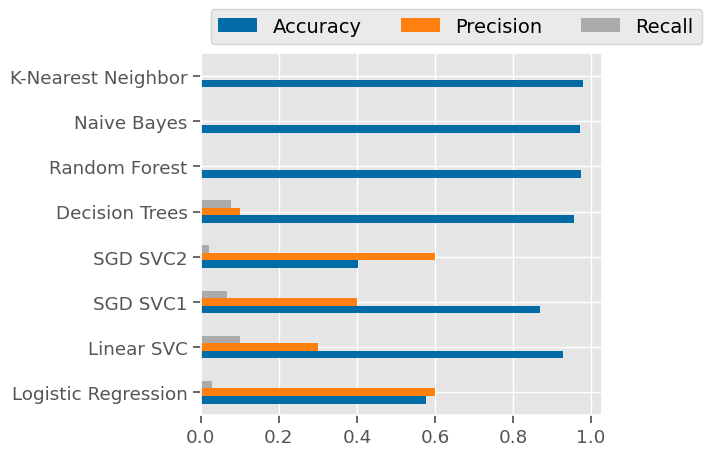

In [ ]:
ax = df_model.plot.barh()
ax.legend(
    ncol=len(models.keys()),
    bbox_to_anchor=(0, 1),
    loc='lower left',
    prop={'size': 14}
)
plt.tight_layout()

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       1.00      0.59      0.74      1400
         1.0       0.04      0.86      0.08        28

    accuracy                           0.59      1428
   macro avg       0.52      0.72      0.41      1428
weighted avg       0.98      0.59      0.72      1428



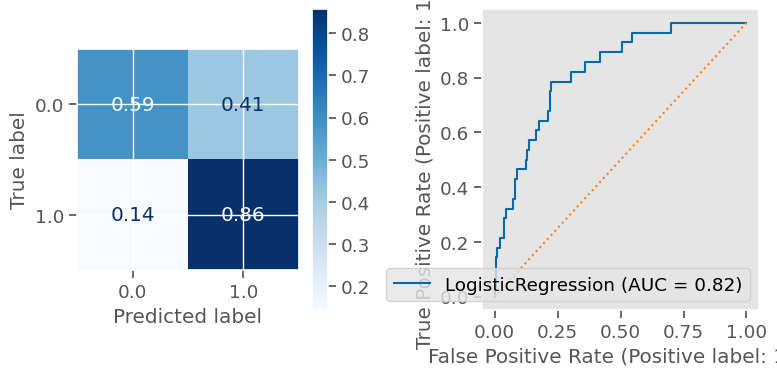

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.99      0.58      0.73       466
         1.0       0.03      0.60      0.06        10

    accuracy                           0.58       476
   macro avg       0.51      0.59      0.40       476
weighted avg       0.97      0.58      0.72       476



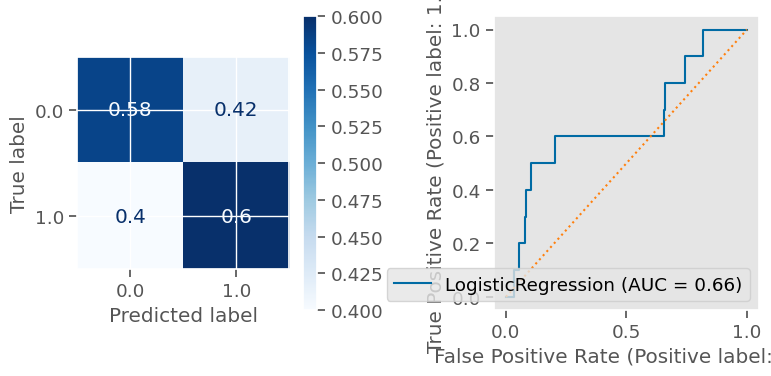

In [ ]:
evaluate_classification(log_reg, X_train_df, y_train, X_test_df, y_test)

--------------------------------------------------------------------------------
	CLASSIFICATION REPORT
--------------------------------------------------------------------------------
[i] Training Data:
              precision    recall  f1-score   support

         0.0       0.99      0.82      0.90      1400
         1.0       0.08      0.75      0.14        28

    accuracy                           0.82      1428
   macro avg       0.53      0.78      0.52      1428
weighted avg       0.98      0.82      0.88      1428



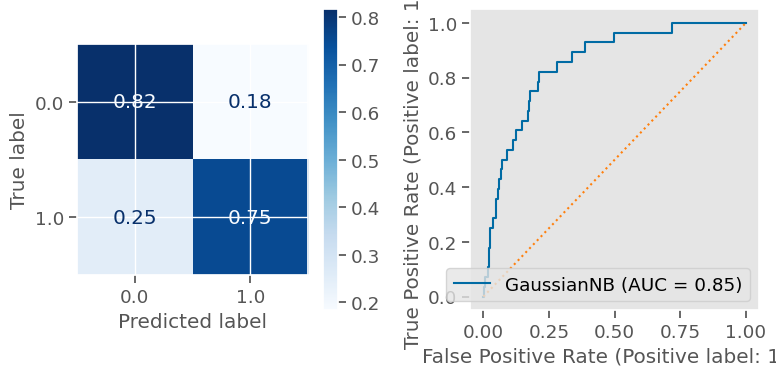

--------------------------------------------------------------------------------
[i] Test Data:
              precision    recall  f1-score   support

         0.0       0.99      0.83      0.90       466
         1.0       0.06      0.50      0.11        10

    accuracy                           0.83       476
   macro avg       0.52      0.67      0.51       476
weighted avg       0.97      0.83      0.89       476



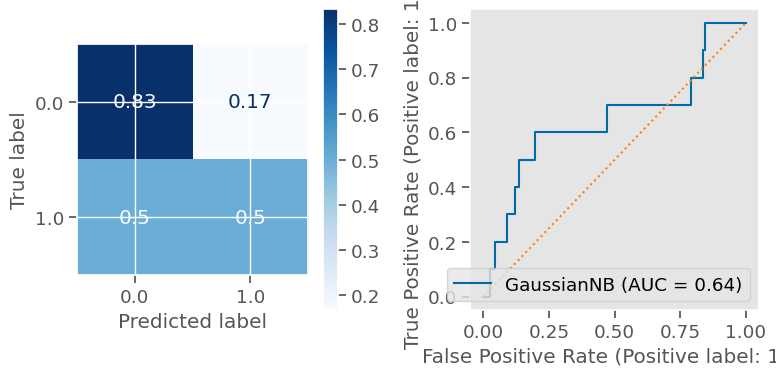

In [ ]:
evaluate_classification(naive_bayes, X_train_df, y_train, X_test_df, y_test)

### Deep Neural Network

In [ ]:
# Imports for neural networks
#Keras
from tensorflow.keras import Sequential
from tensorflow.keras import metrics
from tensorflow.keras.layers import Dense, Dropout

In [ ]:
X_train_df.shape

(1428, 332)

In [ ]:
np.isnan(X_train_df).sum().sum()

0

In [ ]:
np.isnan(X_test_df).sum().sum()

0

In [ ]:
input_dim = X_train_df.shape[1]
input_dim

332

In [ ]:
input_dim = X_test_df.shape[1]
input_dim

332

In [ ]:
def plot_history(history):
  """Takes a keras model learning history and plots each metric"""

  metrics = history.history.keys()

  for metric in metrics:
      if not 'val' in metric:
        plt.plot(history.history[f'{metric}'], label=f'{metric}')
        if f'val_{metric}' in metrics:
          plt.plot(history.history[f'val_{metric}'], label=f'val_{metric}')
        plt.legend()
        plt.title(f'{metric}')
        plt.show()

In [ ]:
## define the evaluate_regression function here.

def evaluate_regression(model, X_test, y_test, label="Test Data"):
  y_pred = model.predict(X_test)


   ## Print regression report for the test data
  print('---'*20)
  print(f"REGRESSION REPORT FOR: {label}")
  print('---'*20)
  # print the classiffication report from the test data

  print(f'final RMSE: {round(np.sqrt(mean_squared_error(y_test, y_pred)),-1)}')
  print(f'final MAE: {round(mean_absolute_error(y_test, y_pred),-1)}')
  print(f'final R2: {round(r2_score(y_test, y_pred),4)}')

  plt.show()

In [ ]:
# create model
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(patience = 5)
from keras import regularizers

model = Sequential()
model.add(Dense(80, input_dim = input_dim, activation = 'relu'))
model.add(Dropout(.2))
model.add(Dense(10, activation = 'relu'))
model.add(Dropout(.5))
model.add(Dense(5, activation = 'relu'))
model.add(Dropout(.5))
model.add(Dense(1, activation = 'sigmoid'))

# Most deep learning regression models will use MSE as the loss function
# Use Recall()

model.compile(loss = 'bce', optimizer = 'adam', metrics=['accuracy',
                                                         metrics.Precision(),
                                                         metrics.Recall()])




In [ ]:
%%time
# fit your model
history = model.fit(X_train_df, y_train,
                    validation_data=(X_test_df, y_test),
                    epochs=100,
                    verbose=0,
                    callbacks=[early_stopping],
                    class_weight = {0: .5, 1: .95}
                    )

CPU times: user 5.72 s, sys: 217 ms, total: 5.94 s
Wall time: 5.96 s


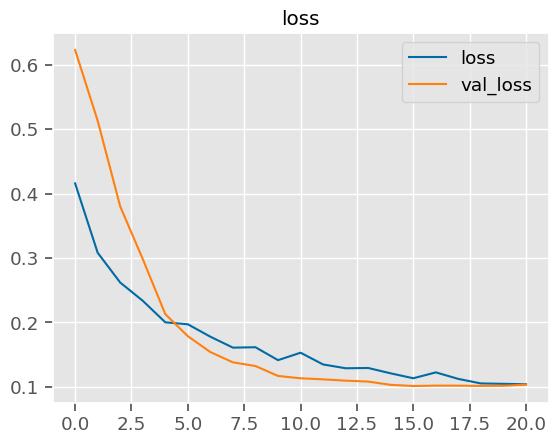

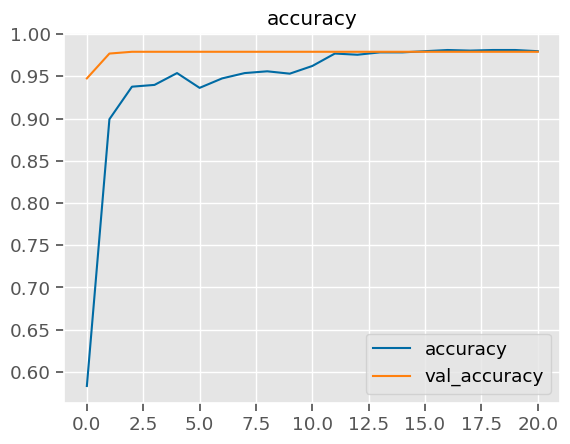

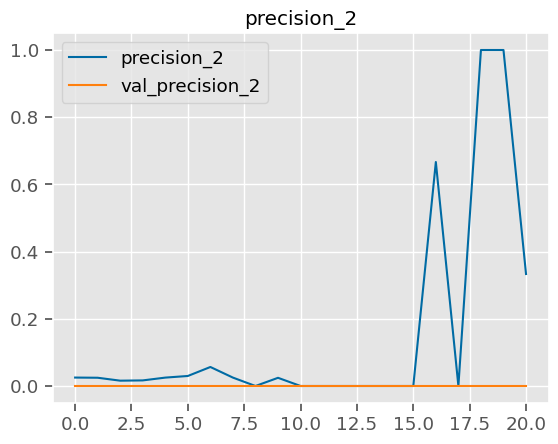

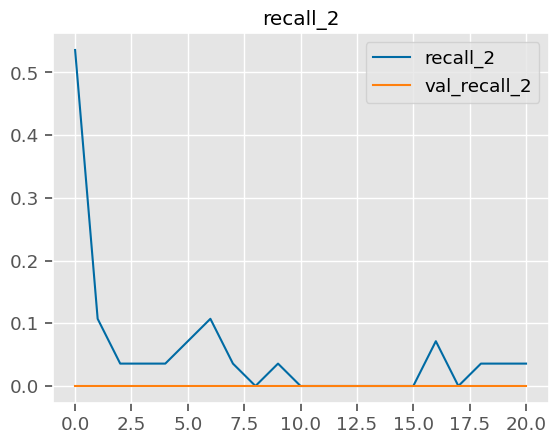

In [ ]:
# plot learning

plot_history(history)

15/15 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

         0.0       0.99      0.59      0.74       466
         1.0       0.04      0.70      0.07        10

    accuracy                           0.59       476
   macro avg       0.51      0.64      0.40       476
weighted avg       0.97      0.59      0.72       476



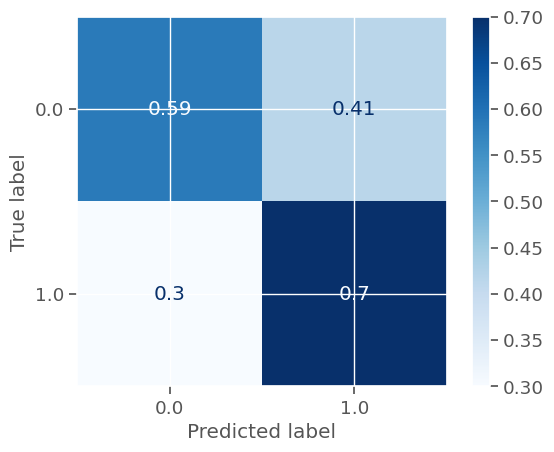

In [ ]:
## evaluate model
#from sklearn.metrics import ConfusionMatrixDisplay

#make predictions
y_preds = model.predict(X_test_df)
raw_data_nn =  y_preds
df_results['NN Probability'] = model.predict(X_test_df)
y_preds[(y_preds > .01)] = 1
y_preds = np.round(y_preds)

df_results['NN Actual'] = y_preds

print(classification_report(y_test, y_preds))

ConfusionMatrixDisplay.from_predictions(y_test, y_preds,
                                                   cmap='Blues',
                                                   normalize='true');

In [ ]:
df_results

,Sold,no attribution,allwebleads,canopy connect,everquote,zapier,smartfinancial,Naive Bayes Prediction Prob,Naive Bayes Prediction Actual,SVM Prob,SVM Actual,Logistic Prediction Actual,Logistic Prediction Prob,Random Forest Prob,Random Forest Actual,XGB Actual,XGB Prob,NN Probability,NN Actual
2610,0.0,0,0,0,1,0,0,1.00000000e+00,1.0,0.01393057,0.0,0.0,0.39566837,0.15871484,0.0,1.0,0.00236085,0.00759452,0.0
1614,0.0,0,0,0,0,0,1,1.01156899e-17,0.0,0.00528299,0.0,0.0,0.35779339,0.08134050,0.0,0.0,0.00002201,0.00102597,0.0
2134,0.0,0,0,0,1,0,0,9.99959428e-01,1.0,0.02144451,0.0,1.0,0.64734984,0.24626002,0.0,0.0,0.00019830,0.04263574,1.0
943,0.0,0,0,0,0,0,1,4.91877492e-22,0.0,0.00493906,0.0,0.0,0.36095093,0.14699905,0.0,0.0,0.00027279,0.00003450,0.0
227,0.0,0,0,0,0,0,0,4.88614467e-11,0.0,0.00688172,0.0,0.0,0.27004125,0.10618728,0.0,0.0,0.00016201,0.00043692,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2532,0.0,0,0,0,0,0,0,7.43279207e-01,1.0,0.01597900,0.0,0.0,0.29718487,0.07914207,0.0,0.0,0.00001356,0.00122280,0.0
3054,0.0,0,0,0,0,0,0,6.58019358e-02,0.0,0.01895564,0.0,0.0,0.44591096,0.14164884,0.0,0.0,0.00003572,0.02287398,1.0
1455,0.0,0,0,0,0,0,0,9.99999999e-01,1.0,0.01834436,0.0,0.0,0.39281038,0.17366855,0.0,0.0,0.00034459,0.00447890,0.0
925,0.0,0,0,0,1,0,0,1.00000000e+00,1.0,0.02391712,0.0,0.0,0.47397540,0.25184326,0.0,1.0,0.00159464,0.01576992,1.0


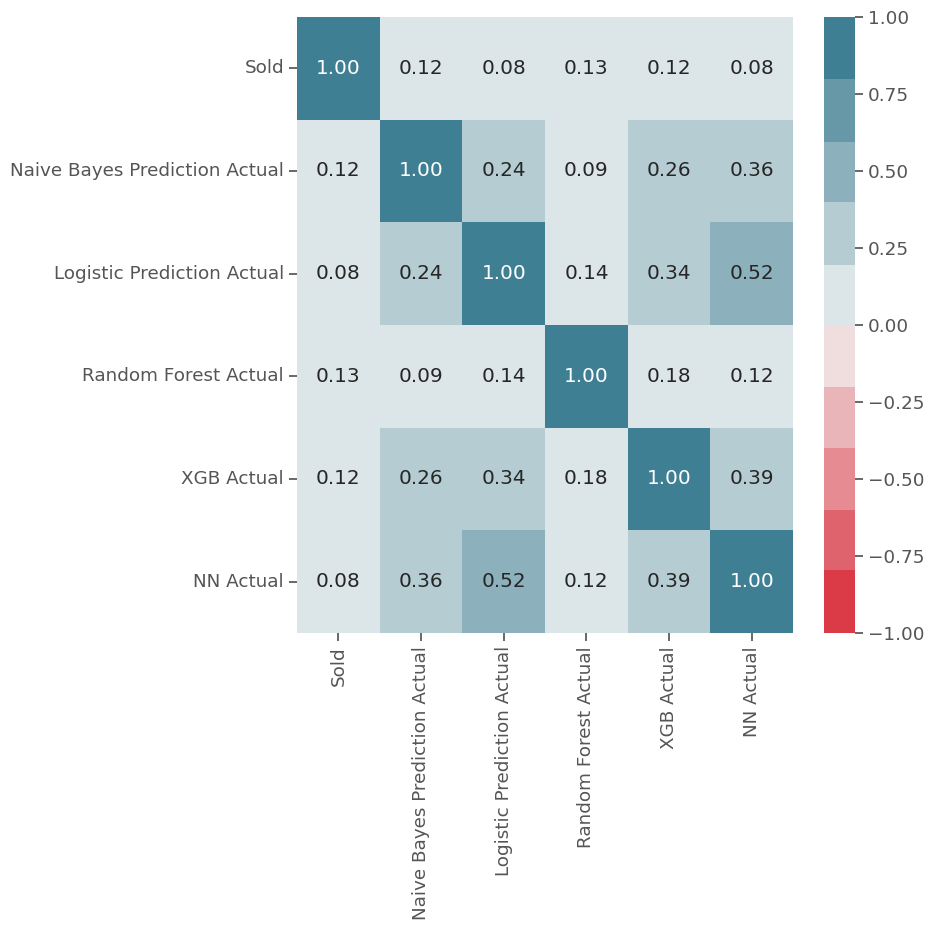

In [ ]:
df_results_clean = df_results[['Sold', 'Naive Bayes Prediction Actual', 'Logistic Prediction Actual', 'Random Forest Actual', 'XGB Actual', 'NN Actual']]

corr = df_results_clean.corr()
plt.figure(figsize = (8,8));
sns.heatmap(corr, cmap=sns.diverging_palette(10, 220, n=10), annot = True, vmin=-1, vmax=1, center=0,fmt='.2f');



## Export Results


In [ ]:
df_results.to_csv('Regression Results.csv')

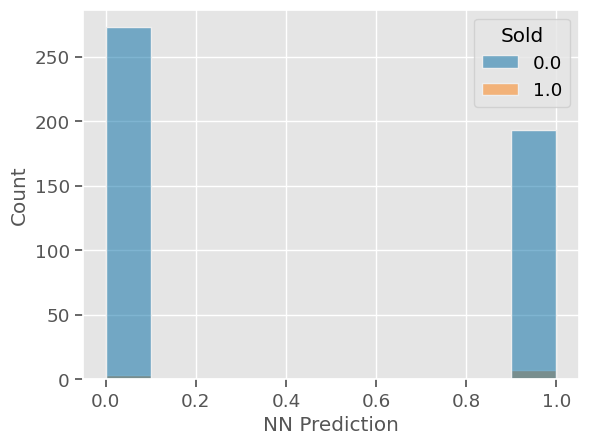

In [ ]:
X_test['NN Prediction'] = raw_data_nn
X_test['Sold'] = y_test

sns.histplot(data=X_test, x='NN Prediction', hue='Sold');

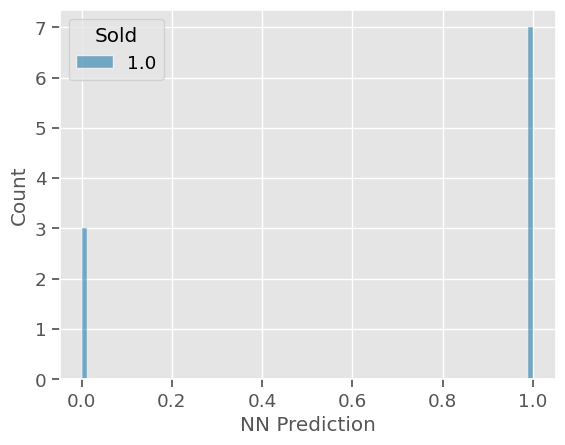

In [ ]:
X_test_sold = X_test[X_test['Sold']==1]
sns.histplot(data=X_test_sold, x='NN Prediction', hue='Sold', bins=100);

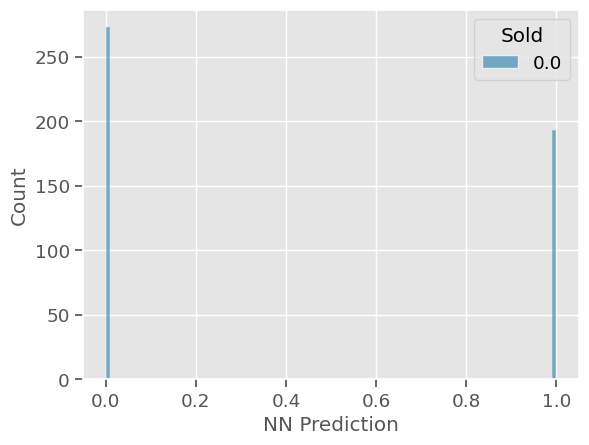

In [ ]:
X_test_sold = X_test[X_test['Sold']==0]
sns.histplot(data=X_test_sold, x='NN Prediction', hue='Sold', bins=100);

In [ ]:
X_test['Sold'].value_counts()

0.0    466
1.0     10
Name: Sold, dtype: int64

In [ ]:
false_pos = round(814*.37,0)
pos = round(32*.59,0)

print(f"With 30%, false positives are {false_pos}")

print(f"With 30%, positives are {pos}")

With 30%, false positives are 301.0
With 30%, positives are 19.0


In [ ]:
false_pos = round(799*.063,0)
pos = round(35*.89,0)
print(f"With 20%, false positives are {false_pos}")
print(f"With 20%, positives are {pos}")

With 20%, false positives are 50.0
With 20%, positives are 31.0


In [ ]:
false_pos = round(799*.089,0)
pos = round(35*.89,0)
print(f"With 10%, false positives are {false_pos}")
print(f"With 10%, positives are {pos}")

With 10%, false positives are 71.0
With 10%, positives are 31.0


#### Test on rest of data

In [ ]:
## Set data to test

df_merged_test = df_merged_test
#df_merged_test = df_source_filtered
df_merged_test

,postal_code,Date of Birth - 1st Person in Household (MM),Date of Birth - 1st Person in Household (YYYY),In Market for a New Domestic Luxury Vehicle (Financial),In Market for a New Domestic Regular Vehicle (Financial),In Market for a New European Vehicle (Financial),In Market for a New Japanese Regular Vehicle (Financial),In Market for a New Korean Vehicle (Financial),In Market for a New Luxury Vehicle (Financial),In Market for a New Regular Vehicle (Financial),In Market for a New Vehicle (Financial),In Market for a Used Vehicle (Financial),Build or buy a home (net),Buy your first home,Buy a newly constructed home,Buy a pre-owned home,Buy a vacation or second home,Design or build a new home,Sell a Vacation or Second Home,In Market for Home Purchase(Financial),In Market for a Mortgage Refinance(Financial),Not At All Likely To Sell House/Residence In The Next Year (Financial),Not Very Likely To Buy A Second House/Residence In The Next Year (Financial),Very Likely To Buy A First House/Residence In The Next Year (Financial),Affluent Homes,Likely To Switch Insurance Provider (Financial),IPSOS Affluent - Auto - In Market Own Hybrid/Electric,IPSOS Affluent - Auto - In Market Own Luxury Car,Simmons Research LLC - Next auto/ car purchase is new,Simmons Research LLC - Next auto/ car purchase within year,"Simmons Research LLC - Auto - Plans to purchase, researches TV messages online","Simmons Research LLC - Auto - Plans to purchase new, owns Chevrolet","Simmons Research LLC - Auto - Plans to purchase new, owns a Ford","Simmons Research LLC - Auto - Plans to purchase new, owns a Toyota","Simmons Research LLC - Auto - Plans to purchase a new vehicle in the next 6 to 24 months, decision dealbreaker is safety","Simmons Research LLC - Auto - Plans to purchase a new vehicle, undecided domestic v foreign, HHI is greater than 100k",Simmons Research LLC - Auto - Plans to purchase a used car in the next 7-12 months,Simmons Research LLC - Auto - Prefers to buy used cars,"Simmons Research LLC - Auto - Prefers to buy used cars, plans to purchase",In market for a vehicle,Obtain Boat Owners Insurance,Prosper - Insurance Buyer or Switcher - Auto,Prosper - Insurance Buyer or Switcher - Homeowners,Prosper - Insurance Buyer or Switcher - Life,Prosper - Insurance Buyer or Switcher - Renters,Home Square Footage - Ranges (Real Property data only),Home Year Built - Ranges (Real Property data only),Home Market Value - Estimated - Ranges (Real Property data only),New Mover,Recent Mortgage Borrower,Sold,gender,no attribution,allwebleads,canopy connect,everquote,zapier,smartfinancial
3,76427,1,1963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,7,6,0,0,0,0,0,1,0,0,0,0,0
24,76010,7,1968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,14,61.0,60.0,78.0,91.0,0,0,0,0,0,1,0,0,0,0,1,0,0
25,75024,8,1983,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,8,3,0,0,0,0,0,0,0,0,1,0,0
26,76068,10,1981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,3,4,0,0,0,0,0,0,0,0,1,0,0
27,76110,2,1986,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339,77388,8,1955,11.0,3.0,27.0,8.0,1.0,21.0,3.0,3.0,5.0,20.0,20.0,15.0,15.0,19.0,10.0,7.0,75.0,13.0,20.0,15.0,16.0,NaN,15.

In [ ]:
df_merged_test['Sold'].value_counts()

0    159
1     55
Name: Sold, dtype: int64

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:202: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


              precision    recall  f1-score   support

           0       0.73      0.71      0.72       159
           1       0.23      0.25      0.24        55

    accuracy                           0.59       214
   macro avg       0.48      0.48      0.48       214
weighted avg       0.61      0.59      0.60       214



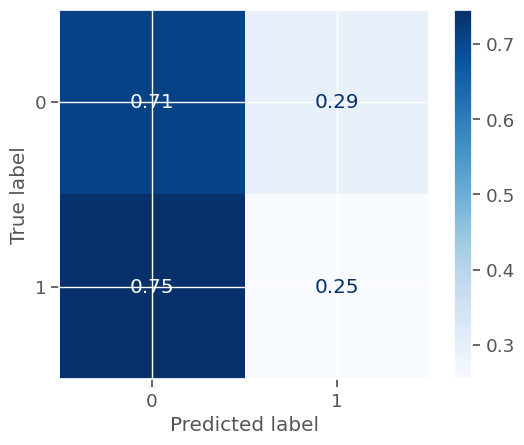

In [ ]:
X_quoted_test = df_merged_test.drop(columns=['Sold'])
y_quoted_test = df_merged_test['Sold']
X_quoted_test_processed = preprocessor.transform(X_quoted_test)
##make predictions
np.set_printoptions(suppress=True)
y_quoted_test_preds = log_reg_pipe_best.predict_proba(X_quoted_test_processed)

no,yes = zip(*y_quoted_test_preds)
y_quoted_test_preds = yes
y_quoted_test_preds = np.array(y_quoted_test_preds)

#cuttoff=.535 .83, .2
cuttoff=.6

## round the predictions
value = y_quoted_test_preds

value[(value > cuttoff)] = 1
value[(value < cuttoff)] = 0

y_quoted_test_preds = np.round(value)

print(classification_report(y_quoted_test, y_quoted_test_preds))
ConfusionMatrixDisplay.from_predictions(y_quoted_test, y_quoted_test_preds,
                                                   cmap='Blues',
                                                   normalize='true');
# naive_bayes_pipe
# support_vector_machines_pipe
# log_reg_pipe_best
# rf
# xgb
# model

## Save Model using Joblib

In [ ]:
## saving variables for next lesson/notebook
import joblib
## creating a dictionary of all of the linear regression variables to save for later
export = {'X_train':X_train_df,
         'y_train': y_train,
         'X_test':X_test_df,
         'y_test': y_test,
         'preprocessor':preprocessor,
         'LogisticRegression':log_reg}
joblib.dump(export, 'logistic_regression.joblib')

['logistic_regression.joblib']

In [ ]:
import joblib
loaded_joblib = joblib.load('logistic_regression.joblib')
loaded_joblib.keys()

dict_keys(['X_train', 'y_train', 'X_test', 'y_test', 'preprocessor', 'LogisticRegression'])